## Python libraries, file locations

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline     
sns.set(color_codes=True)

In [ ]:
# import and name datasets

# unfiltered data
mcf_smart_unfiltered = "MCF7_SmartS_Unfiltered_Data.txt"
hcc_smart_unfiltered = "HCC1806_SmartS_Unfiltered_Data.txt"

# meta data
mcf_smart_meta = "MCF7_SmartS_MetaData.tsv"
hcc_smart_meta = "HCC1806_SmartS_MetaData.tsv"

# filtered data
mcf_smart_filtered  = "MCF7_SmartS_Filtered_Data.txt"
hcc_smart_filtered =  "HCC1806_SmartS_Filtered_Data.txt"

# training data
mcf_smart_train = "MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt"
hcc_smart_train = "HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt"
mcf_drop_train = "MCF7_Filtered_Normalised_3000_Data_train.txt"
hcc_drop_train = "HCC1806_Filtered_Normalised_3000_Data_train.txt"

# test data
mcf_smart_test = "MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt"
mcf_drop_test = "MCF7_Filtered_Normalised_3000_Data_test_anonim.txt"
hcc_smart_test = "HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt"
hcc_drop_test = "HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt"
xcells_smart_test = "XCells_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt"
xcells_drop_test = "XCells_Filtered_Normalised_3000_Data_test_anonim.txt"

In [ ]:
df_mcf_smart_unfiltered = pd.read_csv(mcf_smart_unfiltered,delimiter=' ',engine='python',index_col=0)
#df_hcc_smart_unfiltered = pd.read_csv(hcc_smart_unfiltered,delimiter=' ',engine='python',index_col=0)
df_mcf_smart_meta = pd.read_csv(mcf_smart_meta,delimiter='\t',engine='python',index_col=0)
#df_hcc_smart_meta = pd.read_csv(hcc_smart_meta,delimiter='\t',engine='python',index_col=0)
df_mcf_smart_filtered = pd.read_csv(mcf_smart_filtered,delimiter=' ',engine='python',index_col=0)
#df_hcc_smart_filtered = pd.read_csv(hcc_smart_filtered,delimiter=' ',engine='python',index_col=0)
df_mcf_smart_train = pd.read_csv(mcf_smart_train,delimiter=' ',engine='python',index_col=0)
#df_hcc_smart_train = pd.read_csv(hcc_smart_train,delimiter=' ',engine='python',index_col=0)
#df_mcf_drop_train = pd.read_csv(mcf_drop_train,delimiter=' ',engine='python',index_col=0)
#df_hcc_drop_train = pd.read_csv(hcc_drop_train,delimiter=' ',engine='python',index_col=0)
#df_mcf_drop_test = pd.read_csv(mcf_drop_test,delimiter=' ',engine='python',index_col=0)
#df_hcc_smart_test = pd.read_csv(hcc_smart_test,delimiter=' ',engine='python',index_col=0)
#df_mcf_smart_test = pd.read_csv(mcf_smart_test,delimiter=' ',engine='python',index_col=0)
#df_hcc_drop_test = pd.read_csv(hcc_drop_test,delimiter=' ',engine='python',index_col=0)
#df_xcells_smart_test = pd.read_csv(xcells_smart_test,delimiter=' ',engine='python',index_col=0)
#df_xcells_drop_test = pd.read_csv(xcells_drop_test,delimiter=' ',engine='python',index_col=0)

#df_hcc_smart_unfiltered.columns = df_hcc_smart_unfiltered.columns.str.replace(r'"', '')
#df_hcc_smart_filtered.columns = df_hcc_smart_filtered.columns.str.replace(r'"', '')
#df_hcc_smart_train.columns = df_hcc_smart_train.columns.str.replace(r'"', '')

df_mcf_smart_unfiltered.columns = df_mcf_smart_unfiltered.columns.str.replace(r'"', '')
df_mcf_smart_filtered.columns = df_mcf_smart_filtered.columns.str.replace(r'"', '')
df_mcf_smart_train.columns = df_mcf_smart_train.columns.str.replace(r'"', '')

In [ ]:
df_meta = df_mcf_smart_meta
df_unfiltered = df_mcf_smart_unfiltered

# Explanatory data analysis

## Description and visualization of the data

We start by looking at the metadata, which gives us informations about the sample cells.

In [ ]:
print("Dataframe dimensions:", np.shape(df_meta))


Dataframe dimensions: (383, 8)


In [ ]:
df_meta.dtypes

Cell Line             object
Lane                  object
Pos                   object
Condition             object
Hours                  int64
Cell name             object
PreprocessingTag      object
ProcessingComments    object
dtype: object

In [ ]:
df_meta.head()

,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


By looking at the first rows of the dataset and knowing its dimension, we can see that there are 383 sample cells and 8 features. Next we look at the possible values that the features can take to better describe their meaning.

In [ ]:
df_meta.isnull().sum()

Cell Line             0
Lane                  0
Pos                   0
Condition             0
Hours                 0
Cell name             0
PreprocessingTag      0
ProcessingComments    0
dtype: int64

In [ ]:
for i,x in enumerate(df_meta.columns):
  print(f'Values of {x}:')
  print(df_meta.iloc[:,i].value_counts().to_string(), '\n')

Values of Cell Line:
MCF7    383 

Values of Lane:
output.STAR.1    96
output.STAR.2    96
output.STAR.3    96
output.STAR.4    95 

Values of Pos:
A10    4
F10    4
F7     4
F6     4
F5     4
F4     4
F3     4
F2     4
F1     4
F12    4
F11    4
E9     4
F9     4
E8     4
E7     4
E6     4
E5     4
E4     4
E3     4
E2     4
E1     4
E12    4
F8     4
G10    4
E10    4
H10    4
H9     4
H8     4
H7     4
H6     4
H5     4
H4     4
H3     4
H2     4
H1     4
G9     4
G11    4
G8     4
G7     4
G6     4
G5     4
G4     4
G3     4
G2     4
G1     4
G12    4
A11    4
E11    4
D9     4
B10    4
B7     4
B6     4
B5     4
B4     4
B3     4
B2     4
B1     4
B12    4
B11    4
A9     4
B9     4
A8     4
A7     4
A6     4
A5     4
A4     4
A3     4
A2     4
A1     4
A12    4
D8     4
B8     4
C10    4
D7     4
D5     4
D4     4
D3     4
D2     4
D1     4
D12    4
D11    4
C11    4
D10    4
C9     4
C8     4
C7     4
C6     4
C5     4
C4     4
C3     4
C2     4
C1     4
C12    4
D6     4
H12   

As expected all cells in the dataset belong to the `Cell line` MCF7. The data of `PCR plate` and `Pos` tell us the precise location of the cells in the plates. There are four of them and each can allocate at most 96 cells, with coordinates that go from 1 to 14 in one direction and from A to H in the other. The most relevant information is the one of the `Condition`, which can be either Normoxia or Hypoxia and we can see that the data are evenly distributed between the two categories with 192 'Normo' and 191 'Hypo'. Next we have the `Hours` category which tells us how long the experiment has been carried out for, but this is an irrelevant data since there is only one common value. Then we have the `Cell name` column, which contains all different data, telling us that each cell is uniquely represented. Finally we have two columns explaining the preprocessing and processing of the data (`PreprocessingTag` and `ProcessingComments`), which are irrelevant in our study since they are equal for all cells.

Now we move on to the actual unfiltered data.

In [ ]:
print("Dataframe dimensions:", np.shape(df_unfiltered))


Dataframe dimensions: (22934, 383)


First of all, we check for missing values in the unfiltered dataset and again observe that there aren't any.

In [ ]:
df_unfiltered.isnull().any().sum()

0

In [ ]:
df_unfiltered.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,0,0,1,10,1,0,0,...,1,1,0,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
print("Dataframe indices: ", df_unfiltered.index)

Dataframe indices:  Index(['WASH7P', 'MIR6859-1', 'WASH9P', 'OR4F29', 'MTND1P23', 'MTND2P28',
       'MTCO1P12', 'MTCO2P12', 'MTATP8P1', 'MTATP6P1',
       ...
       'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-ND5', 'MT-ND6', 'MT-TE', 'MT-CYB',
       'MT-TT', 'MT-TP', 'MAFIP'],
      dtype='object', length=22934)


In [ ]:
gene_types = pd.Series(index=df_unfiltered.index, dtype='object')
for x in df_unfiltered.index:
    index = next((i for i, c in enumerate(x) if (c.isdigit() or c=='-')), len(x))
    gene_types[x]=x[0:index]
gene_types.value_counts()

LINC     670
ZNF      554
MIR      541
RPL      417
SLC      365
        ... 
EPO        1
SRRT       1
ACHE       1
VGF        1
MAFIP      1
Length: 6086, dtype: int64

By looking at the unfiltered data we see that the columns are represented by the 383 cells, which are the same ones we saw in the metadata. On the other hand, the rows are indexed by symbols that identify the genes and there are 22934 of them.
Each gene corresponds to a sequence of bases in the DNA  and identifiers are used to name sequences that may have a specific function when activated or not. Each symbol is associated to only one gene and their aim is to briefly describe its charcteristics and/or functions. An example is the prefix 'LINC' (long intergenic non-protein coding) that is the most common in our dataset.

In the following line of code we check that all the entries are numeric.

In [ ]:
df_unfiltered.dtypes.value_counts()

int64    383
dtype: int64

In [ ]:
df_unfiltered.describe()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,...,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000,22934.000000
mean,40.817651,0.012253,86.442400,1.024636,14.531351,56.213613,75.397183,62.767725,67.396747,2.240734,...,17.362562,42.080230,34.692422,32.735284,21.992718,17.439391,49.242784,61.545609,68.289352,62.851400
std,465.709940,0.207726,1036.572689,6.097362,123.800530,503.599145,430.471519,520.167576,459.689019,25.449630,...,193.153757,256.775704,679.960908,300.291051,153.441647,198.179666,359.337479,540.847355,636.892085,785.670341
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.000000,0.000000,5.000000,0.000000,7.000000,23.000000,39.000000,35.000000,38.000000,1.000000,...,9.000000,30.000000,0.000000,17.000000,12.000000,9.000000,27.000000,30.000000,38.000000,33.000000
max,46744.000000,14.000000,82047.000000,289.000000,10582.000000,46856.000000,29534.000000,50972.000000,36236.000000,1707.000000,...,17800.000000,23355.000000,81952.000000,29540.000000,12149.000000,19285.000000,28021.000000,40708.000000,46261.000000,68790.000000


The describe() method used above returns the description of the data in the DataFrame. Here we can observe that the data is sparse; in fact, the features have mostly zero values and have some big entries, an issue that we will address later on.

In [ ]:
df_unfiltered.T.describe()

,WASH7P,MIR6859-1,WASH9P,OR4F29,MTND1P23,MTND2P28,MTCO1P12,MTCO2P12,MTATP8P1,MTATP6P1,...,MT-TH,MT-TS2,MT-TL2,MT-ND5,MT-ND6,MT-TE,MT-CYB,MT-TT,MT-TP,MAFIP
count,383.000000,383.000000,383.000000,383.00000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.00000,383.000000,383.000000,383.000000
mean,0.133159,0.026110,1.344648,0.05483,0.049608,6.261097,4.681462,0.524804,0.073107,222.054830,...,1.060052,0.443864,3.146214,1016.477807,204.600522,5.049608,2374.97389,2.083551,5.626632,1.749347
std,0.618664,0.249286,2.244543,0.31477,0.229143,7.565749,6.232649,0.980857,0.298131,262.616874,...,1.990566,1.090827,4.265352,1009.444811,220.781927,6.644302,2920.39000,3.372714,7.511180,3.895204
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,...,0.000000,0.000000,0.000000,172.000000,30.500000,0.000000,216.50000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.00000,0.000000,3.000000,2.000000,0.000000,0.000000,98.000000,...,0.000000,0.000000,1.000000,837.000000,152.000000,3.000000,785.00000,0.000000,3.000000,0.000000
75%,0.000000,0.000000,2.000000,0.00000,0.000000,10.000000,7.000000,1.000000,0.000000,370.500000,...,1.000000,0.000000,5.000000,1549.000000,294.000000,7.000000,4059.00000,3.000000,8.000000,2.000000
max,9.000000,4.000000,20.000000,3.00000,2.000000,45.000000,36.000000,6.000000,2.000000,1662.000000,...,15.000000,8.000000,22.000000,8115.000000,2002.000000,46.000000,16026.00000,22.000000,56.000000,32.000000


Also the gene readings across cells are highly sparse. In some cases, the amount of zero values overcome the third quartile.

Next we plot the cells in their respective positions in the plates and use two different colors to distinguish hypoxic cells from the normal ones.

In [ ]:
def meta_column(info):
    return df_meta.loc[:,info]

In [ ]:
plate_1 = df_unfiltered.loc[:,meta_column('Lane')=='output.STAR.1']
plate_2 = df_unfiltered.loc[:,meta_column('Lane')=='output.STAR.2']
plate_3 = df_unfiltered.loc[:,meta_column('Lane')=='output.STAR.3']
plate_4 = df_unfiltered.loc[:,meta_column('Lane')=='output.STAR.4']

plate_1_meta = df_meta.loc[meta_column('Lane')=='output.STAR.1',:]
plate_2_meta = df_meta.loc[meta_column('Lane')=='output.STAR.2',:]
plate_3_meta = df_meta.loc[meta_column('Lane')=='output.STAR.3',:]
plate_4_meta = df_meta.loc[meta_column('Lane')=='output.STAR.4',:]

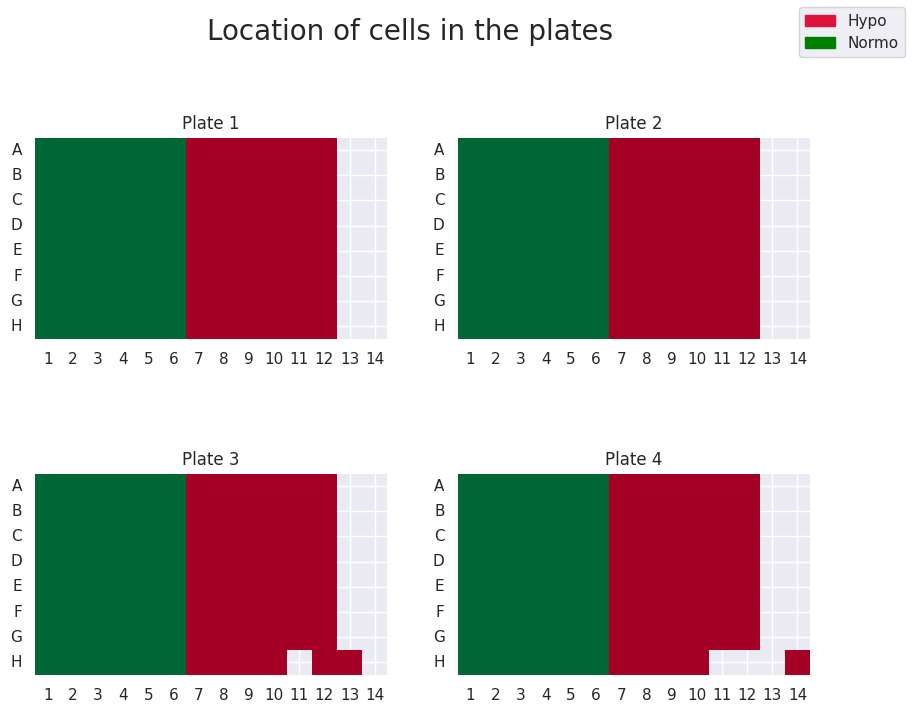

In [ ]:
def plate_pos(plate_meta):
    platepos = plate_meta[['Pos','Pos']].copy()
    platepos.columns = ['Letter','Number']
    for i,p in platepos.iterrows():
        p[0]=p[0][0]
        p[1]=int(p[1][1:])
    return platepos

plate_1_pos = plate_pos(plate_1_meta)
plate_2_pos = plate_pos(plate_2_meta)
plate_3_pos = plate_pos(plate_3_meta)
plate_4_pos = plate_pos(plate_4_meta)

empty = pd.DataFrame(np.zeros((8,14)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(14)))

plate_1_values = empty.copy()
for i in plate_1_pos.index:
    plate_1_values.loc[plate_1_pos.loc[i][0]][plate_1_pos.loc[i][1]] = (-1 if plate_1_meta.loc[i,'Condition']=='Hypo' else 1)
plate_2_values = empty.copy()
for i in plate_2_pos.index:
    plate_2_values.loc[plate_2_pos.loc[i][0]][plate_2_pos.loc[i][1]] = (-1 if plate_2_meta.loc[i,'Condition']=='Hypo' else 1)
plate_3_values = empty.copy()
for i in plate_3_pos.index:
    plate_3_values.loc[plate_3_pos.loc[i][0]][plate_3_pos.loc[i][1]] = (-1 if plate_3_meta.loc[i,'Condition']=='Hypo' else 1)
plate_4_values = empty.copy()
for i in plate_4_pos.index:
    plate_4_values.loc[plate_4_pos.loc[i][0]][plate_4_pos.loc[i][1]] = (-1 if plate_4_meta.loc[i,'Condition']=='Hypo' else 1)

fig , ax = plt.subplots(2,2, figsize=(10,8))

h = sns.heatmap(plate_1_values, xticklabels=plate_1_values.columns, yticklabels=plate_1_values.index, cmap='RdYlGn', center=0, mask=(plate_1_values==0), ax=ax[0,0], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_2_values, xticklabels=plate_2_values.columns, yticklabels=plate_2_values.index, cmap='RdYlGn', center=0, mask=(plate_2_values==0), ax=ax[0,1], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_3_values, xticklabels=plate_3_values.columns, yticklabels=plate_3_values.index, cmap='RdYlGn', center=0, mask=(plate_3_values==0), ax=ax[1,0], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_4_values, xticklabels=plate_4_values.columns, yticklabels=plate_4_values.index, cmap='RdYlGn', center=0, mask=(plate_4_values==0), ax=ax[1,1], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)

ax[0,0].set_title('Plate 1')
ax[0,1].set_title('Plate 2')
ax[1,0].set_title('Plate 3')
ax[1,1].set_title('Plate 4')

fig.suptitle("Location of cells in the plates", fontsize=20)
red_patch = mpatches.Patch(color='crimson', label='Hypo')
green_patch = mpatches.Patch(color='green', label='Normo')
fig.legend(handles=[red_patch, green_patch], loc=1)
plt.show()


We can see that all the hypoxic cells are on the left half of the plates. Surely, this was done on purpose when sequencing the cells so we can exclude the proximity to cells of the same type as a relevant information.

Next we plot again the heatmap, giving to each cell its gene activation value, i.e. the number of genes that have an expression different from 0.

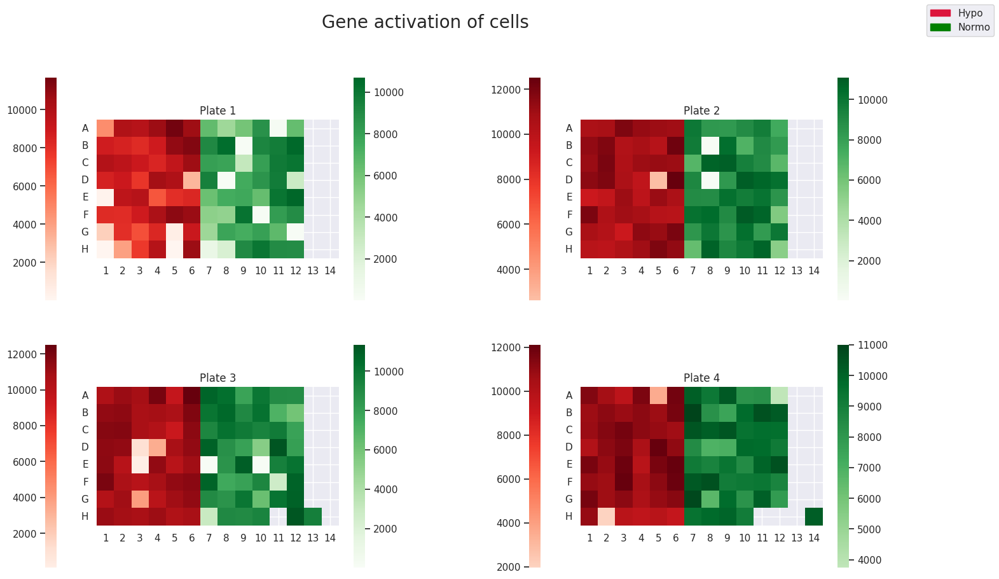

In [ ]:
plate_1_values = empty.copy()
for i in plate_1_pos.index:
    plate_1_values.loc[plate_1_pos.loc[i][0]][plate_1_pos.loc[i][1]] = plate_1.loc[:,i].astype(bool).sum()
plate_2_values = empty.copy()
for i in plate_2_pos.index:
    plate_2_values.loc[plate_2_pos.loc[i][0]][plate_2_pos.loc[i][1]] = plate_2.loc[:,i].astype(bool).sum()
plate_3_values = empty.copy()
for i in plate_3_pos.index:
    plate_3_values.loc[plate_3_pos.loc[i][0]][plate_3_pos.loc[i][1]] = plate_3.loc[:,i].astype(bool).sum()
plate_4_values = empty.copy()
for i in plate_4_pos.index:
    plate_4_values.loc[plate_4_pos.loc[i][0]][plate_4_pos.loc[i][1]] = plate_4.loc[:,i].astype(bool).sum()

fig , ax = plt.subplots(2,2, figsize=(18,10))

plate_1_hypo = plate_1_values.copy()
plate_1_hypo.iloc[:,6:]=0
plate_1_normo = plate_1_values.copy()
plate_1_normo.iloc[:,:6]=0

plate_2_hypo = plate_2_values.copy()
plate_2_hypo.iloc[:,6:]=0
plate_2_normo = plate_2_values.copy()
plate_2_normo.iloc[:,:6]=0

plate_3_hypo = plate_3_values.copy()
plate_3_hypo.iloc[:,6:]=0
plate_3_normo = plate_3_values.copy()
plate_3_normo.iloc[:,:6]=0

plate_4_hypo = plate_4_values.copy()
plate_4_hypo.iloc[:,6:]=0
plate_4_normo = plate_4_values.copy()
plate_4_normo.iloc[:,:6]=0


sns.heatmap(plate_1_hypo, xticklabels=plate_1_hypo.columns, yticklabels=plate_1_hypo.index, cmap='Reds', center=6000, mask=(plate_1_hypo==0), ax=ax[0,0], square=True, cbar_kws = {'location':'left'})
sns.heatmap(plate_2_hypo, xticklabels=plate_2_hypo.columns, yticklabels=plate_2_hypo.index, cmap='Reds', center=6000, mask=(plate_2_hypo==0), ax=ax[0,1], square=True, cbar_kws = {'location':'left'})
sns.heatmap(plate_3_hypo, xticklabels=plate_3_hypo.columns, yticklabels=plate_3_hypo.index, cmap='Reds', center=6000, mask=(plate_3_hypo==0), ax=ax[1,0], square=True, cbar_kws = {'location':'left'})
sns.heatmap(plate_4_hypo, xticklabels=plate_4_hypo.columns, yticklabels=plate_4_hypo.index, cmap='Reds', center=6000, mask=(plate_4_hypo==0), ax=ax[1,1], square=True, cbar_kws = {'location':'left'})

h = sns.heatmap(plate_1_normo, xticklabels=plate_1_normo.columns, yticklabels=plate_1_normo.index, cmap='Greens', center=6000, mask=(plate_1_normo==0), ax=ax[0,0], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_2_normo, xticklabels=plate_2_normo.columns, yticklabels=plate_2_normo.index, cmap='Greens', center=6000, mask=(plate_2_normo==0), ax=ax[0,1], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_3_normo, xticklabels=plate_3_normo.columns, yticklabels=plate_3_normo.index, cmap='Greens', center=6000, mask=(plate_3_normo==0), ax=ax[1,0], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_4_normo, xticklabels=plate_4_normo.columns, yticklabels=plate_4_normo.index, cmap='Greens', center=6000, mask=(plate_4_normo==0), ax=ax[1,1], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)

ax[0,0].set_title('Plate 1')
ax[0,1].set_title('Plate 2')
ax[1,0].set_title('Plate 3')
ax[1,1].set_title('Plate 4')

fig.suptitle("Gene activation of cells", fontsize=20)
red_patch = mpatches.Patch(color='crimson', label='Hypo')
green_patch = mpatches.Patch(color='green', label='Normo')
fig.legend(handles=[red_patch, green_patch], loc=1)
plt.show()

As we can see from the plot, there are cells with a very low gene activation both among the hypoxic and the normal one, an issue that will be dealt with later on.

---





To gain an initial understanding of the data, we create boxplots and violin plots that depict the distribution shapes of gene expression profiles from a selected few cells. Moreover, we use violin plots to graphically represent the distribution of gene expression level for several genes across the cells.

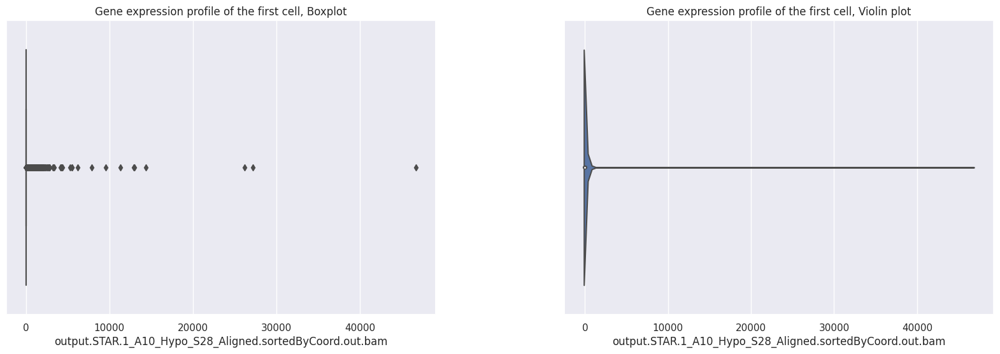

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of gene expression profile of the first cell
cnames = list(df_unfiltered.columns)
cnames[0]
sns.boxplot(x=df_unfiltered[cnames[0]], ax=ax[0]).set_title('Gene expression profile of the first cell, Boxplot')

# Violin plot of gene expression of the first cell
sns.violinplot(x=df_unfiltered[cnames[0]], ax=ax[1]).set_title('Gene expression profile of the first cell, Violin plot')
plt.show()

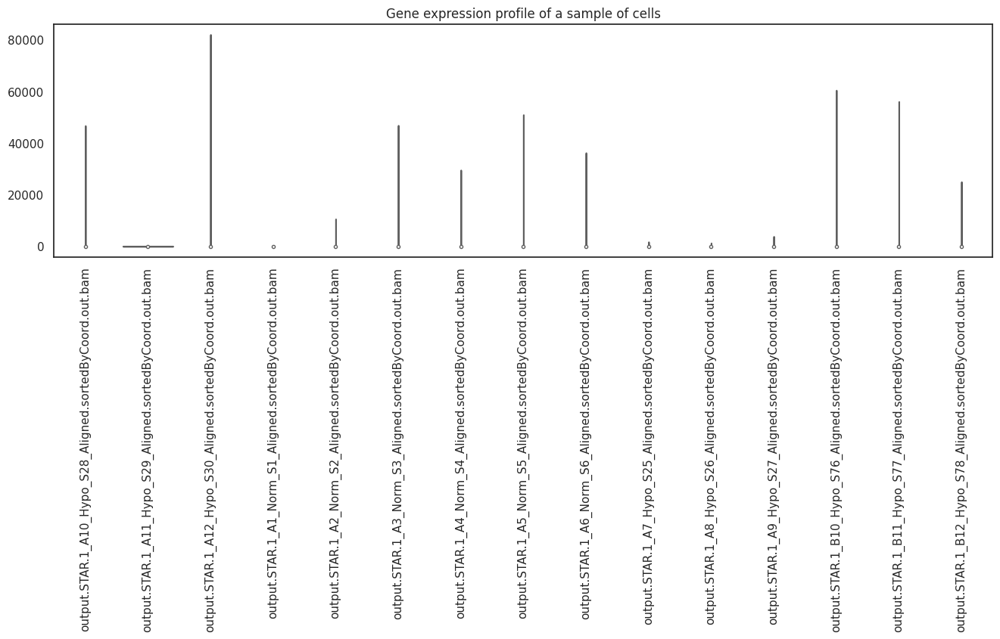

In [ ]:
# Plotting the violin plots of the gene expression of a sample of cells
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_unfiltered.iloc[:, :15],palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Gene expression profile of a sample of cells')
plt.show()

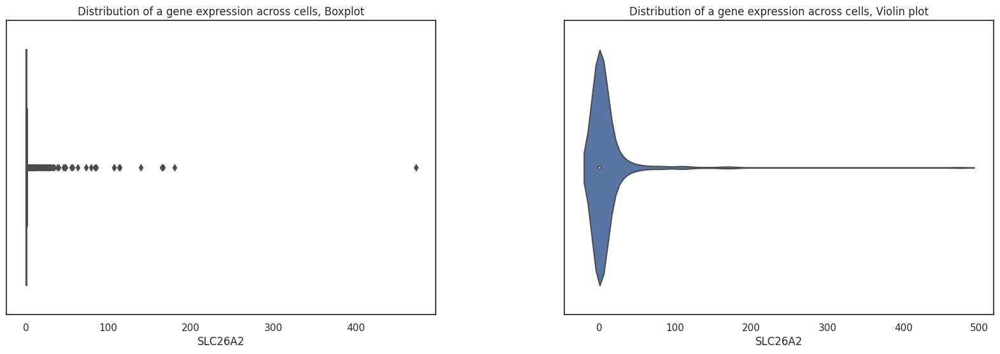

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of the distribution of a gene expression level 
sns.boxplot(x=df_unfiltered.loc['SLC26A2', :], ax=ax[0]).set_title('Distribution of a gene expression across cells, Boxplot')
# Violin plot of the distribution of a gene expression level 
sns.violinplot(x=df_unfiltered.loc['SLC26A2', :], ax=ax[1]).set_title('Distribution of a gene expression across cells, Violin plot')
plt.show()

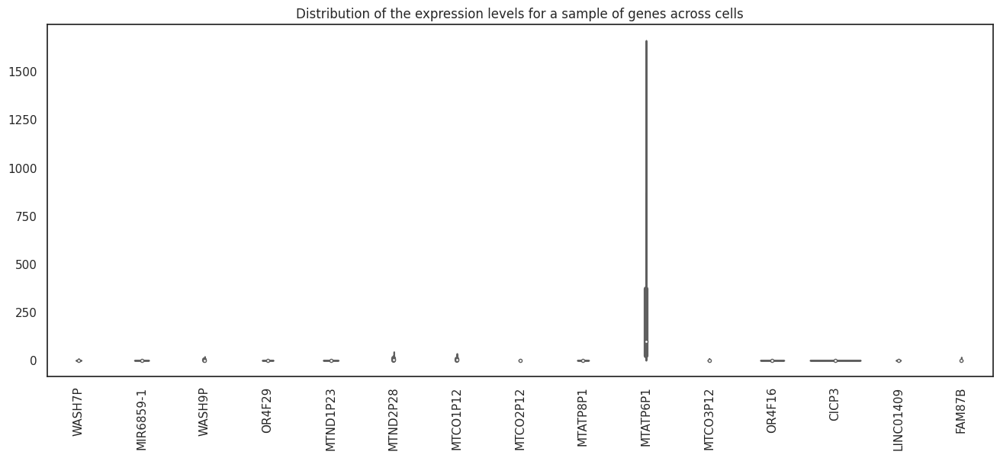

In [ ]:
# Distributions of the expression levels across cells for a sample of genes
plt.figure(figsize=(16, 6))
plot=sns.violinplot(data=df_unfiltered.iloc[:15,:].T, palette='Set3', cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Distribution of the expression levels for a sample of genes across cells')
plt.show()

Our initial impression that the data is sparse, appears to be confirmed by these first graphs. Additionally, it is evident that some gene expressions are significantly larger than the majority.

## Filtering

### Check for duplicates

In data recording tasks, it is useful to check for duplicate rows; that is, pairs of genes that have the same counts across all cells. In our specific case, there may be certain features that have the same frequency across experiments but different names. This could be because of redundancy in gene annotation or overlapping gene annotations in the same region. If we retain both duplicates, we risk generating a biased result. Therefore, we examine and potentially keep one of the duplicate features, but it is important to document this action, as it may lead to issues with data interpretation in the future. 

In [ ]:
duplicate_rows_df = df_unfiltered[df_unfiltered.duplicated(keep=False)]
print("number of duplicate rows: ", duplicate_rows_df.shape)
#print("duplicate rows: ", duplicate_rows_df)

number of duplicate rows:  (56, 383)


There are 56 duplicate genes. Now we understand where the duplicates really are. 

In [ ]:
print("names of duplicate rows: ",duplicate_rows_df.index)
duplicate_rows_df_t = duplicate_rows_df.T
duplicate_rows_df_t
c_dupl = duplicate_rows_df_t.corr()
c_dupl

names of duplicate rows:  Index(['SHISAL2A', 'IL12RB2', 'S1PR1', 'CD84', 'GNLY', 'FAR2P3', 'KLF2P3',
       'PABPC1P2', 'UGT1A8', 'UGT1A9', 'SLC22A14', 'COQ10BP2', 'PANDAR',
       'LAP3P2', 'RPL22P16', 'GALNT17', 'PON1', 'HTR5A', 'SNORA36A', 'MIR664B',
       'CSMD1', 'KCNS2', 'MIR548AA1', 'MIR548D1', 'MTCO2P11', 'CLCN3P1',
       'SUGT1P4-STRA6LP', 'STRA6LP', 'MUC6', 'VSTM4', 'LINC00856', 'LINC00595',
       'CACYBPP1', 'LINC00477', 'KNOP1P1', 'WDR95P', 'MIR20A', 'MIR19B1',
       'RPL21P5', 'RNU6-539P', 'SNRPN', 'SNURF', 'RBFOX1', 'LINC02183', 'MT1M',
       'ASPA', 'BCL6B', 'CCL3L3', 'CCL3L1', 'OTOP3', 'RNA5SP450', 'PSG1',
       'MIR3190', 'MIR3191', 'SEZ6L', 'ADAMTS5'],
      dtype='object')


,SHISAL2A,IL12RB2,S1PR1,CD84,GNLY,FAR2P3,KLF2P3,PABPC1P2,UGT1A8,UGT1A9,...,BCL6B,CCL3L3,CCL3L1,OTOP3,RNA5SP450,PSG1,MIR3190,MIR3191,SEZ6L,ADAMTS5
SHISAL2A,1.000000,0.630630,0.654887,0.312826,0.497375,-0.008333,-0.008333,0.497375,-0.009322,-0.009322,...,0.497375,-0.007615,-0.007615,0.134926,-0.005249,0.497375,-0.005249,-0.005249,0.112487,0.630630
IL12RB2,0.630630,1.000000,0.829681,0.799056,0.630630,-0.007903,-0.007903,0.948434,-0.008841,-0.008841,...,0.630630,-0.007222,-0.007222,0.612365,-0.004979,0.630630,-0.004979,-0.004979,0.586533,0.799056
S1PR1,0.654887,0.829681,1.000000,0.412553,0.654887,-0.007656,-0.007656,0.654887,-0.008565,-0.008565,...,0.654887,-0.006996,-0.006996,0.178813,-0.004823,0.654887,-0.004823,-0.004823,0.149322,0.829681
CD84,0.312826,0.799056,0.412553,1.000000,0.312826,-0.007903,-0.007903,0.948434,-0.008841,-0.008841,...,0.312826,-0.007222,-0.007222,0.964653,-0.004979,0.312826,-0.004979,-0.004979,0.955646,0.397167
GNLY,0.497375,0.630630,0.654887,0.312826,1.000000,-0.008333,-0.008333,0.497375,-0.009322,-0.009322,...,1.000000,0.021357,0.021357,0.134926,-0.005249,0.497375,-0.005249,-0.005249,0.112487,0.948434
FAR2P3,-0.008333,-0.007903,-0.007656,-0.007903,-0.008333,1.000000,1.000000,-0.008333,-0.014798,-0.014798,...,-0.008333,-0.012088,-0.012088,-0.006928,-0.008333,-0.008333,-0.008333,-0.008333,-0.006775,-0.007903
KLF2P3,-0.008333,-0.007903,-0.007656,-0.007903,-0.008333,1.000000,1.000000,-0.008333,-0.014798,-0.014798,...,-0.008333,-0.012088,-0.012088,-0.006928,-0.008333,-0.008333,-0.008333,-0.008333,-0.006775,-0.007903
PABPC1P2,0.497375,0.948434,0.654887,0.948434,0.497375,-0.008333,-0.008333,1.000000,-0.009322,-0.009322,...,0.497375,-0.007615,-0.007615,0.831379,-0.005249,0.497375,-0.005249,-0.005249,0.813013,0.630630
UGT1A8,-0.009322,-0.008841,-0.008565,-0.008841,-0.009322,-0.014798,-0.014798,-0.009322,1.000000,1.000000,...,-0.009322,-0.013523,-0.013523,-0.007750,-0.009322,-0.009322,-0.009322,-0.009322,-0.007579,-0.008841
UGT1A9,-0.009322,-0.008841,-0.008565,-0.008841,-0.009322,-0.014798,-0.014798,-0.009322,1.000000,1.000000,...,-0.009322,-0.013523,-0.013523,-0.007750,-0.009322,-0.009322,-0.009322,-0.009322,-0.007579,-0.008841


We look at the statistics of the gene expression profiles of genes that seem duplicates.

In [ ]:
duplicate_rows_df_t.describe()

,SHISAL2A,IL12RB2,S1PR1,CD84,GNLY,FAR2P3,KLF2P3,PABPC1P2,UGT1A8,UGT1A9,...,BCL6B,CCL3L3,CCL3L1,OTOP3,RNA5SP450,PSG1,MIR3190,MIR3191,SEZ6L,ADAMTS5
count,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000
mean,0.005222,0.007833,0.018277,0.007833,0.005222,0.013055,0.013055,0.005222,0.704961,0.704961,...,0.005222,0.394256,0.394256,0.015666,0.005222,0.005222,0.005222,0.005222,0.018277,0.007833
std,0.072168,0.114138,0.274921,0.114138,0.072168,0.113658,0.113658,0.072168,5.486218,5.486218,...,0.072168,3.756135,3.756135,0.260417,0.072168,0.072168,0.072168,0.072168,0.310683,0.114138
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,2.000000,5.000000,2.000000,1.000000,1.000000,1.000000,1.000000,78.000000,78.000000,...,1.000000,66.000000,66.000000,5.000000,1.000000,1.000000,1.000000,1.000000,6.000000,2.000000


The majority of the duplicates seem to be sparse. Next, we remove them. 

In [ ]:
df_noDup = df_unfiltered.drop_duplicates()

In [ ]:
df_noDup.shape

(22905, 383)

### Sparsity and Outliers

A dataset is said to be sparse when the data stored for a particular feature contains mostly zeroes. This could cause machine learning models to operate in a biased behaviour. There are several strategies to solve data sparsity, which we will investigate.

As previously noted, both the data referring to gene expression across cells and the gene expression profile of single cells are sparse: most of the entries are zeros (more than 50%). Moreover, it is interesting to notice that there are some very big outliers. Both of these features of the dataset will be further investigated throughout the report.

#### Outliers

As previously mentioned, our dataset seems to present a lot of outliers. We try to recognise outliers by computing the interquartile range for each feature, and by looking for those values in our dataset that have a distance larger than 1.5 times the interquartile range from the closest between the first and the third quartile. 

We first compute the interquartile range for the gene expression levels in cells.

In [ ]:
Q1 = df_unfiltered.T.quantile(0.25)
Q3 = df_unfiltered.T.quantile(0.75)
IQR = Q3 - Q1
IQR.value_counts()

0.0       10645
1.0         606
2.0         354
3.0         281
4.0         251
          ...  
373.5         1
324.0         1
572.0         1
692.5         1
3842.5        1
Length: 992, dtype: int64

10 645 genes have an interquartile range 0. This means that most of their readings across cells share the same value and by our previous investigation we know that that value must be 0. Therefore, as previously discussed, the data is very sparse.  

As mentioned, we define "outliers" those values in our dataset that have a distance larger than 1.5 times the interquartile range from the closest between the first and the third quartile.

In [ ]:
low_bound = (Q1 - 1.5*IQR)
high_bound = (Q3 + 1.5*IQR)

We only want to keep those cells that have no outlier values among their features

In [ ]:
msk = (df_unfiltered.T < low_bound) | (df_unfiltered.T > high_bound)
df_filt = df_unfiltered.T[~ msk.any(axis=1)]
df_filt.shape

(4, 22934)

By filtering the data according to the absence of outlier values among their features, almost all the cells have been removed. So, this strategy doesn't work. We apply an analogous strategy on the genes' expressions.

In [ ]:
Q1 = df_unfiltered.quantile(0.25)
Q3 = df_unfiltered.quantile(0.75)
IQR = Q3 - Q1
IQR.value_counts()

0.00     38
34.00    17
33.00    14
35.00    14
32.00    13
2.00     12
28.00    12
17.00    11
31.00    11
29.00    10
27.00     9
14.00     9
25.00     9
18.00     9
42.00     8
13.00     8
11.00     8
30.00     8
39.00     8
1.00      8
9.00      8
38.00     8
45.00     7
23.00     7
37.00     7
26.00     7
19.00     7
21.00     6
20.00     6
5.00      6
3.00      6
8.00      6
7.00      5
16.00     5
22.00     5
4.00      5
15.00     5
43.00     5
10.00     4
40.00     4
6.00      4
44.00     3
12.00     3
24.00     3
41.00     3
47.00     2
36.00     2
4.75      1
41.75     1
45.75     1
50.00     1
24.75     1
35.75     1
40.75     1
49.00     1
dtype: int64

In [ ]:
low_bound = (Q1 - 1.5*IQR).T
high_bound = (Q3 + 1.5*IQR).T

In [ ]:
msk = (df_unfiltered < low_bound) | (df_unfiltered > high_bound)
df_filt = df_unfiltered[~ msk.any(axis=1)]
df_filt.shape

(6435, 383)

About three quarters of the genes have now been cut.

We analyse how this filtering affected our previously built violin plots. 

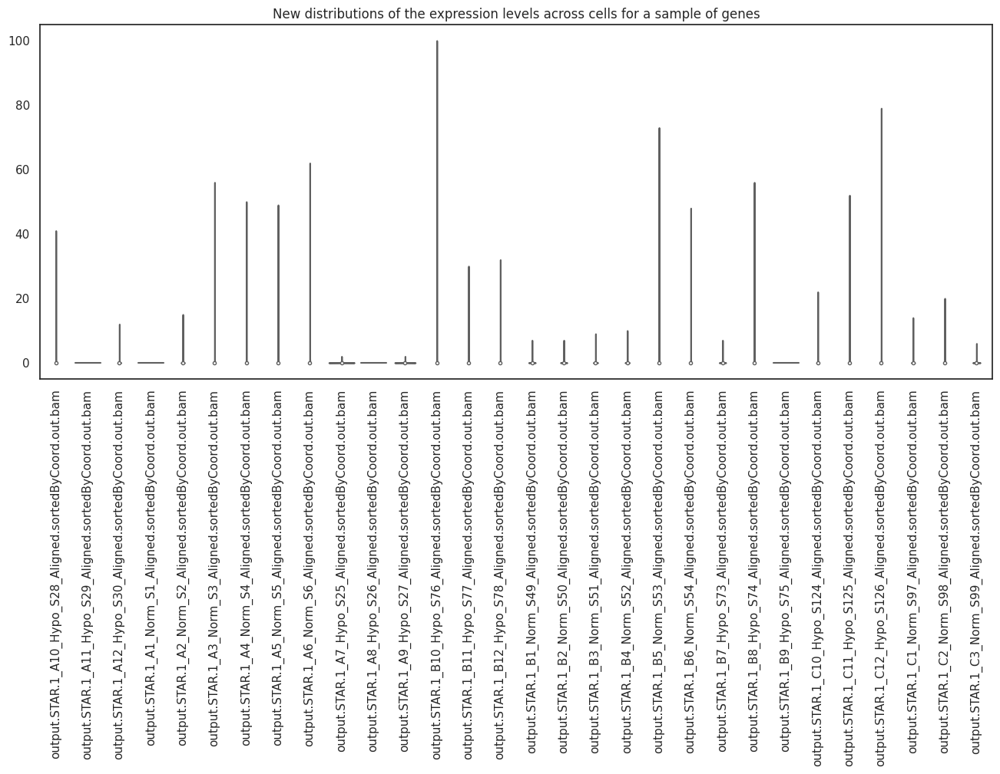

In [ ]:
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_filt.iloc[:,:30], palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("New distributions of the expression levels across cells for a sample of genes")
plt.show()

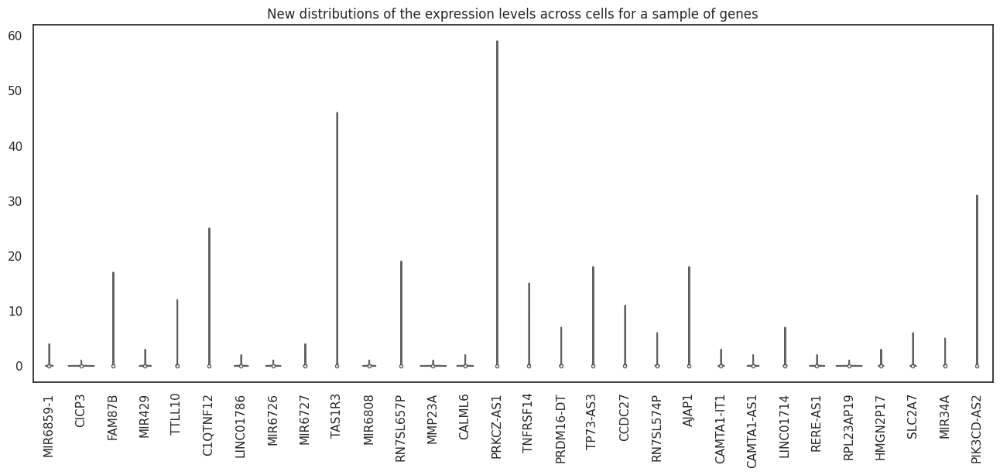

In [ ]:
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_filt.iloc[:30,:].T, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("New distributions of the expression levels across cells for a sample of genes")
plt.show()

In order to calculate sparsity, one can divide the overall number of zero-valued elements by the total number of elements in a dataset. This is often defined as the "sparsity of the matrix".

In [ ]:
print("sparsity level:")
print("without outliers:", (df_filt == 0).sum().sum() / df_filt.size)
print("with outliers:", (df_unfiltered == 0).sum().sum() / df_unfiltered.size)

sparsity level:
without outliers: 0.9548755277214808
with outliers: 0.6021531646834907


We obtain an unsatisfactory result: the post-filtering data are even more sparse than the original data. Therefore, our filtering method must be reshaped. We learn that we cannot simply filter the data by the outliers, because they often carry some important information for our inquiry.

#### Sparsity of genes

Very sparse genes are generally expressed in a few amount of cells. We do not expect sparse genes to be relevant for the classification, since they add little information about the cells in which they are observed.

As previously detected, the sparsity level of our dataset is just above 0.6:

In [ ]:
print("sparsity level:", (df_unfiltered == 0).sum().sum() / df_unfiltered.size)

sparsity level: 0.6021531646834907


We now compute the individual sparsity level of each gene, and the sparsity level of the expression level of genes across cells.

In [ ]:
sparsity_levels_genes = (df_unfiltered.T==0).sum() / df_unfiltered.T.shape[0]
sparsity_levels_genes.sort_values()

KRT8         0.013055
ACTB         0.015666
ALDOA        0.015666
KRT18        0.015666
GAPDH        0.015666
               ...   
PECAM1       0.994778
RPL23AP23    0.994778
RPL26P29     0.994778
BEND7P1      0.994778
SLIT3        0.994778
Length: 22934, dtype: float64

In [ ]:
sparsity_levels_cells = (df_unfiltered==0).sum() / df_unfiltered.shape[0]
sparsity_levels_cells.sort_values()

output.STAR.2_D6_Norm_S156_Aligned.sortedByCoord.out.bam     0.454129
output.STAR.3_A6_Norm_S18_Aligned.sortedByCoord.out.bam      0.454783
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam      0.465423
output.STAR.4_F3_Norm_S261_Aligned.sortedByCoord.out.bam     0.472137
output.STAR.4_D5_Norm_S167_Aligned.sortedByCoord.out.bam     0.473576
                                                               ...   
output.STAR.3_E7_Hypo_S229_Aligned.sortedByCoord.out.bam     0.998823
output.STAR.1_H5_Norm_S341_Aligned.sortedByCoord.out.bam     0.999041
output.STAR.1_G12_Hypo_S318_Aligned.sortedByCoord.out.bam    0.999433
output.STAR.1_D8_Hypo_S170_Aligned.sortedByCoord.out.bam     0.999695
output.STAR.1_H1_Norm_S337_Aligned.sortedByCoord.out.bam     0.999956
Length: 383, dtype: float64

We represent these sparsity levels in their corresponding histograms

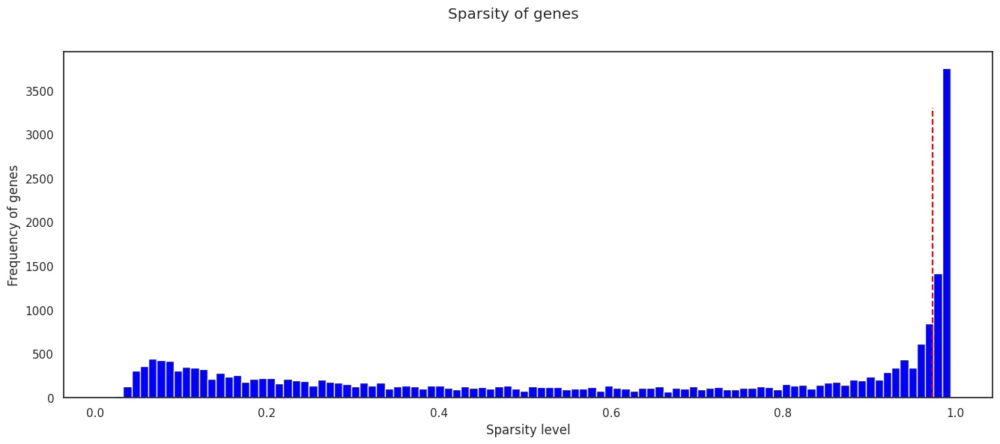

In [ ]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.set_style("white")

bars = ax.hist(sparsity_levels_genes, bins = 100, color = 'blue')

# Labels
fig.suptitle("Sparsity of genes")
ax.set_xlabel("Sparsity level")
ax.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9738903394255874

ax.plot([sparsity_threshold, sparsity_threshold], [0, 3300], color='red', linestyle='dashed')

sns.set_theme() # resetting the style plot

We can easily notice that the distribution of the sparsity level of genes has two tall peaks at its extremes. We aim at filtering the data that is extremely sparse, since it may cause a decrease in the performance of our algorithms.

Hence, we filter out those genes that are expressed in ten or less cells.

In [ ]:
sparsity_threshold = -((10 - df_unfiltered.T.shape[0])/df_unfiltered.T.shape[0])
sparsity_threshold

0.9738903394255874

In [ ]:
sparse_genes = (sparsity_levels_genes > sparsity_threshold)
df_genes_not_sparse = df_unfiltered.T.drop(df_unfiltered.T.columns[sparse_genes], axis=1)
print('Number of relevant genes:',df_genes_not_sparse.shape[1])

Number of relevant genes: 17763


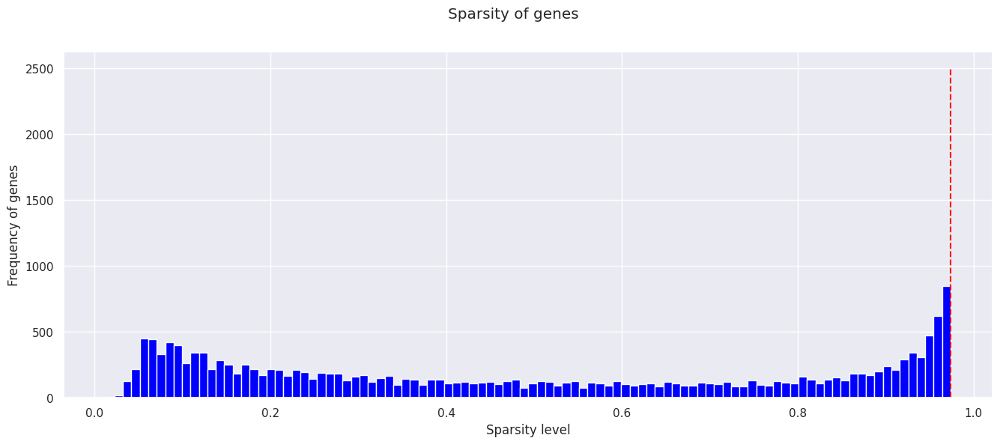

In [ ]:
sparsity_levels_genes_not_sparse = (df_genes_not_sparse==0).sum() / df_genes_not_sparse.shape[0]
fig, ax = plt.subplots(figsize=(16, 6))
sns.set_style("white")

bars = ax.hist(sparsity_levels_genes_not_sparse, bins = 100, color = 'blue')

# Labels
fig.suptitle("Sparsity of genes")
ax.set_xlabel("Sparsity level")
ax.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9738903394255874

ax.plot([sparsity_threshold, sparsity_threshold], [0, 2500], color='red', linestyle='dashed')

sns.set_theme() # resetting the style plot

In [ ]:
not_sparse_genes = (sparsity_levels_genes <= sparsity_threshold)
df_genes_sparse = df_unfiltered.T.drop(df_unfiltered.T.columns[not_sparse_genes], axis=1)
print('Number of sparse genes:',df_genes_sparse.shape[1])

Number of sparse genes: 5171


### Variability


We aim to delete from our dataset those genes that have the lowest variability. Indeed, these are the genes that appear with similar frequencies in most cells, meaning that they add little information to our inquiry. In our inquiry, we will only keep the upper quartile of the vmr distribution.

In [ ]:
std_dev = df_unfiltered.std(axis=1)
var = df_unfiltered.var(axis=1)

In [ ]:
#Sort by standard deviation
sorted_std_dev = std_dev.sort_values(ascending=False)

# Sort by variance
sorted_variance = var.sort_values(ascending=False)

In [ ]:
sorted_std_dev

GAPDH        27101.548020
ACTG1        18356.319754
KRT8         17396.413716
ALDOA        15858.033857
KRT18        15563.122599
                 ...     
RNU6-539P        0.072168
MYMX             0.072168
NPM1P52          0.072168
CICP23           0.072168
PSG7             0.072168
Length: 22934, dtype: float64

In [ ]:
sorted_variance

GAPDH        7.344939e+08
ACTG1        3.369545e+08
KRT8         3.026352e+08
ALDOA        2.514772e+08
KRT18        2.422108e+08
                 ...     
RNF11P1      5.208262e-03
RPS27P16     5.208262e-03
HTR5A        5.208262e-03
RNU6-539P    5.208262e-03
SRSF3P5      5.208262e-03
Length: 22934, dtype: float64

In [ ]:
mean_values = df_unfiltered.mean(axis=1)

In [ ]:
sorted_mean = mean_values.sort_values(ascending=False)

In [ ]:
sorted_mean

KRT8         23052.762402
GAPDH        22839.556136
KRT18        19193.574413
ACTB         18830.691906
ACTG1        13757.522193
                 ...     
OR2A4            0.005222
WBP1P2           0.005222
WBP1P1           0.005222
SELENOKP2        0.005222
ARSF             0.005222
Length: 22934, dtype: float64

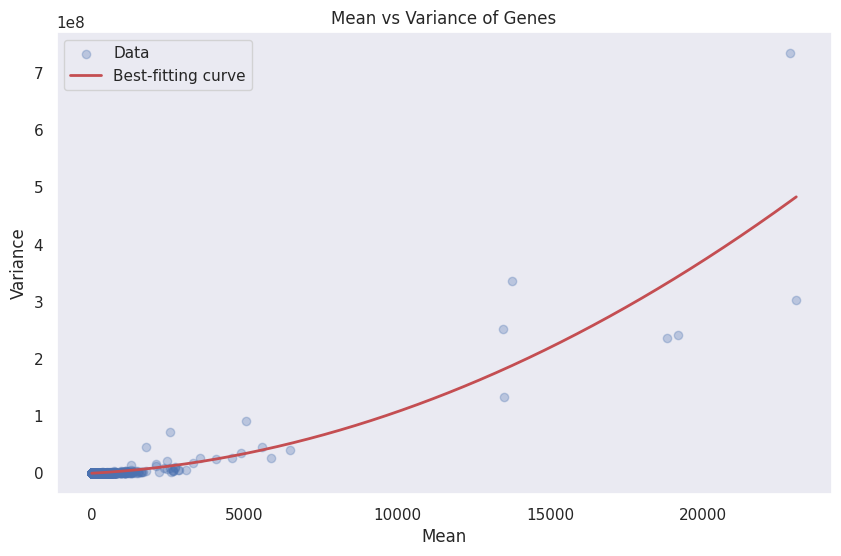

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c):
    return a * x**2 + b * x + c
  
popt, _ = curve_fit(polynomial_func, mean_values, var)
a, b, c = popt

# create plot 
plt.figure(figsize=(10, 6))
plt.scatter(mean_values, var, alpha = 0.3, label='Data')

# Plot the fitted curve
x_line = np.linspace(min(mean_values), max(mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c)
plt.plot(x_line, y_line, 'r', label='Best-fitting curve', linewidth=2)

plt.xlabel('Mean')
plt.ylabel('Variance')
plt.title('Mean vs Variance of Genes')
plt.legend()
plt.grid()
plt.show()

Next we try applying different transformations to the data to better capture the differences in variability.

In [ ]:
# apply a log-transformation

log_df = np.log2(df_unfiltered+1)
log_df.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.000000,1.000000
MIR6859-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
WASH9P,1.0,0.0,0.0,0.0,0.0,1.0,3.459432,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.321928,2.584963
OR4F29,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000
MTND1P23,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000


In [ ]:
# recalculate std, var, mean

log_std_dev = log_df.std(axis=1)
log_var = log_df.var(axis=1)
log_mean_values = log_df.mean(axis=1)

In [ ]:
#Sort by standard deviation
log_sorted_std_dev = log_std_dev.sort_values(ascending=False)

# Sort by variance
log_sorted_variance = log_var.sort_values(ascending=False)

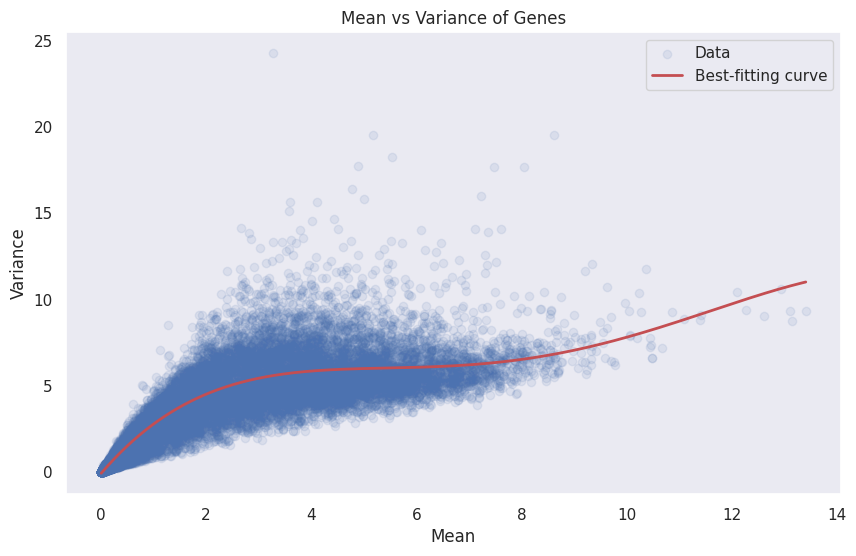

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c, d, e):
    return a * x**4 + b * x**3 + c * x**2 + d * x + e
  
popt, _ = curve_fit(polynomial_func, log_mean_values, log_var)
a, b, c, d, e = popt

# create plot 
plt.figure(figsize=(10, 6))
plt.scatter(log_mean_values, log_var, alpha = 0.1, label='Data')

# Plot the fitted curve
x_line = np.linspace(min(log_mean_values), max(log_mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c, d, e)
plt.plot(x_line, y_line, 'r', label='Best-fitting curve', linewidth=2)

plt.xlabel('Mean')
plt.ylabel('Variance')
plt.title('Mean vs Variance of Genes')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# apply a square-root transformation

sqrt_df = np.sqrt(df_unfiltered)
sqrt_df.head()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.000000
MIR6859-1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
WASH9P,1.0,0.0,0.0,0.0,0.0,1.0,3.162278,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.236068
OR4F29,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000
MTND1P23,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


In [ ]:
# recalculate std, var, mean

sqrt_std_dev = sqrt_df.std(axis=1)
sqrt_var = sqrt_df.var(axis=1)
sqrt_mean_values = sqrt_df.mean(axis=1)

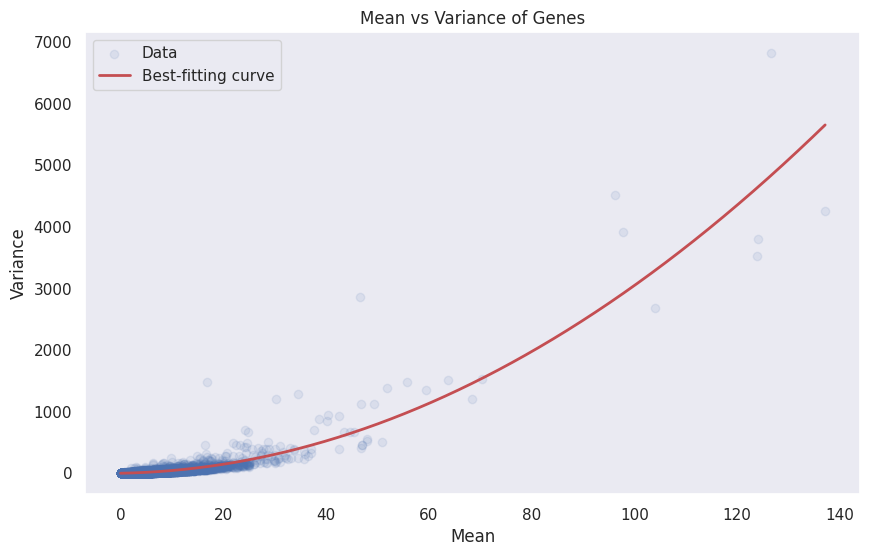

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c):
    return a * x**2 + b * x + c 
  
popt, _ = curve_fit(polynomial_func, sqrt_mean_values, sqrt_var)
a, b, c = popt

# create plot 
plt.figure(figsize=(10, 6))
plt.scatter(sqrt_mean_values, sqrt_var, alpha = 0.1, label='Data')

# Plot the fitted curve
x_line = np.linspace(min(sqrt_mean_values), max(sqrt_mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c)
plt.plot(x_line, y_line, 'r', label='Best-fitting curve', linewidth=2)

plt.xlabel('Mean')
plt.ylabel('Variance')
plt.title('Mean vs Variance of Genes')
plt.legend()
plt.grid()
plt.show()

We decide to work on the log-transformed data

We want to find an optimal threshold for filtering our data. Hence, we use an objective function to quantify how well the threshold separates the data into the desired groups. One common approach is to keep the upper quartile.

In [ ]:
# Calculate variance-to-mean ratio
vmr = log_var / log_mean_values

# Calculate the 75th percentile of the VMR values
vmr_threshold = vmr.quantile(0.75)

In [ ]:
# Get the column indices of genes with a VMR above the threshold
high_vmr_columns = vmr[vmr >= vmr_threshold].index

# Filter the DataFrame to keep only the genes with a high VMR
log_df_dispersed = df_unfiltered.T[high_vmr_columns]

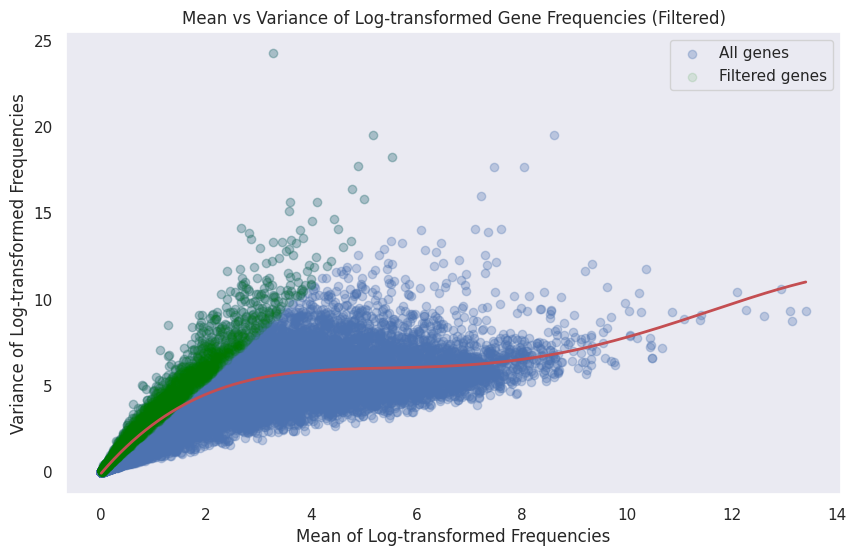

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c, d, e):
    return a * x**4 + b * x**3 + c * x**2 + d * x + e
  
popt, _ = curve_fit(polynomial_func, log_mean_values, log_var)
a, b, c, d, e = popt

# create plot 
plt.figure(figsize=(10, 6))

# Plot all the genes with low alpha
plt.scatter(log_mean_values, log_var, alpha=0.3, label='All genes')

# Highlight the filtered genes with a higher alpha and different color
high_vmr_indices = vmr[vmr >= vmr_threshold].index
plt.scatter(log_mean_values[high_vmr_indices], log_var[high_vmr_indices], alpha=0.1, color='green', label='Filtered genes')

# Plot the fitted curve
x_line = np.linspace(min(log_mean_values), max(log_mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c, d, e)
plt.plot(x_line, y_line, 'r', linewidth=2)

plt.xlabel('Mean of Log-transformed Frequencies')
plt.ylabel('Variance of Log-transformed Frequencies')
plt.title('Mean vs Variance of Log-transformed Gene Frequencies (Filtered)')
plt.legend()
plt.grid()
plt.show()

In [ ]:
print("Number of dispersed genes:",log_df_dispersed.shape[1])

Number of dispersed genes: 5734


In [ ]:
# Filter the rows based on the presence of the index in log_df_dispersed
df_dispersed = df_unfiltered.T.loc[:, df_unfiltered.T.columns.isin(log_df_dispersed.columns)]


In [ ]:
df_dispersed.shape

(383, 5734)

### Mitochondria density

By looking at the mitochondrial density in cells, we are able to assess if we are dealing with damaged cells. Indeed, when cells are perforated, or dying, they present a large percentage of mithocondrial genes. This is because mitochondrial genes are larger and take more time leaving dying cells whose membrane has been damaged.

In [ ]:
mt_genes = np.array(df_unfiltered.T.columns[df_unfiltered.T.columns.str.startswith("MT-")])
print(mt_genes)

['MT-TF' 'MT-RNR1' 'MT-TV' 'MT-RNR2' 'MT-TL1' 'MT-ND1' 'MT-TI' 'MT-TQ'
 'MT-TM' 'MT-ND2' 'MT-TW' 'MT-TA' 'MT-TC' 'MT-TY' 'MT-CO1' 'MT-TS1'
 'MT-TD' 'MT-CO2' 'MT-TK' 'MT-ATP8' 'MT-ATP6' 'MT-CO3' 'MT-TG' 'MT-ND3'
 'MT-TR' 'MT-ND4L' 'MT-ND4' 'MT-TH' 'MT-TS2' 'MT-TL2' 'MT-ND5' 'MT-ND6'
 'MT-TE' 'MT-CYB' 'MT-TT' 'MT-TP']


In [ ]:
df_mt = df_unfiltered.T.loc[:,mt_genes]
df_mt

,MT-TF,MT-RNR1,MT-TV,MT-RNR2,MT-TL1,MT-ND1,MT-TI,MT-TQ,MT-TM,MT-ND2,...,MT-ND4,MT-TH,MT-TS2,MT-TL2,MT-ND5,MT-ND6,MT-TE,MT-CYB,MT-TT,MT-TP
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,0,89,0,1036,4,76,0,0,0,52,...,1720,0,0,0,505,147,4,270,0,5
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,0,1,1,2,0,0,0,0,0,1,...,0,1,1,0,1,0,0,1,0,0
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,0,61,0,1283,0,10,0,0,0,27,...,287,0,0,0,1,0,0,76,0,0
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,0,11,0,70,0,7,0,0,0,9,...,87,1,0,0,44,8,0,66,0,1
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,0,36,0,146,0,50,0,0,0,37,...,403,0,0,0,237,31,3,727,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,0,132,0,578,3,106,0,0,0,49,...,709,0,0,1,341,46,1,570,0,0
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,0,441,0,1916,3,310,0,0,0,281,...,3813,0,0,2,1612,215,6,3477,3,7
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,0,41,0,2026,1,48,1,1,2,47,...,391,0,0,0,62,20,0,349,0,2
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,0,172,2,3708,5,372,1,1,2,849,...,7648,3,0,2,1934,575,7,2184,2,28


In [ ]:
mt_density = df_mt.sum(axis=1) / df_unfiltered.T.sum(axis=1)
mt_density.sort_values(ascending=False)

output.STAR.3_G3_Norm_S303_Aligned.sortedByCoord.out.bam     0.310338
output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam     0.251527
output.STAR.4_A3_Norm_S21_Aligned.sortedByCoord.out.bam      0.091158
output.STAR.1_H5_Norm_S341_Aligned.sortedByCoord.out.bam     0.090909
output.STAR.1_G12_Hypo_S318_Aligned.sortedByCoord.out.bam    0.076923
                                                               ...   
output.STAR.1_E10_Hypo_S220_Aligned.sortedByCoord.out.bam    0.000027
output.STAR.3_E7_Hypo_S229_Aligned.sortedByCoord.out.bam     0.000000
output.STAR.1_H1_Norm_S337_Aligned.sortedByCoord.out.bam     0.000000
output.STAR.2_D8_Hypo_S176_Aligned.sortedByCoord.out.bam     0.000000
output.STAR.1_D8_Hypo_S170_Aligned.sortedByCoord.out.bam     0.000000
Length: 383, dtype: float64

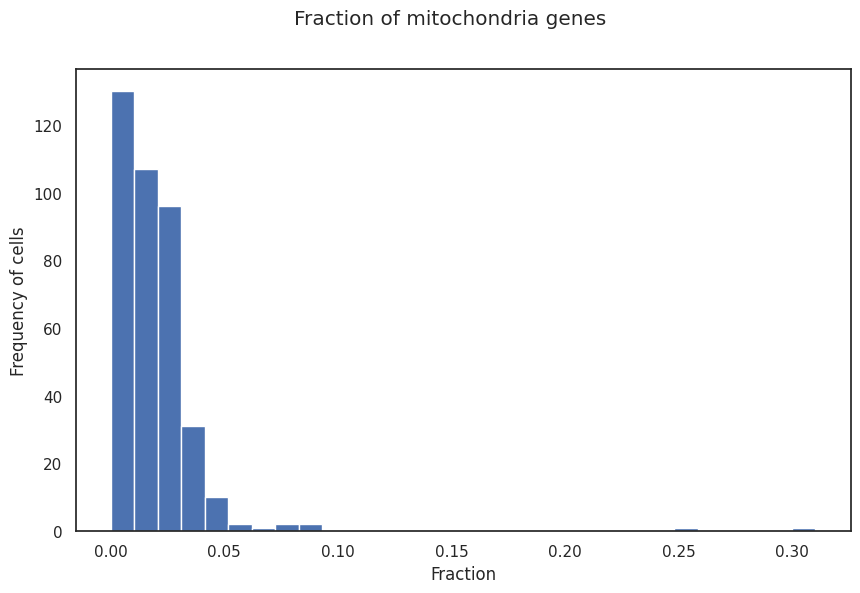

In [ ]:
fig = plt.figure(figsize=(10, 6))
sns.set_style("white")

ax1 = plt.axes()
ax1.hist(mt_density, bins = 30)

# Labels
fig.suptitle("Fraction of mitochondria genes")
ax1.set_xlabel("Fraction")
ax1.set_ylabel("Frequency of cells");

sns.set_theme() # resetting the style plot

We find that there are two strong outliers to the main proportions of mitochondrial genes densities in our dataset. We want to filter those out.

In [ ]:
low_mt_density = mt_density[mt_density <= 0.1]
low_mt_density.sort_values(ascending=False)

output.STAR.4_A3_Norm_S21_Aligned.sortedByCoord.out.bam      0.091158
output.STAR.1_H5_Norm_S341_Aligned.sortedByCoord.out.bam     0.090909
output.STAR.1_G12_Hypo_S318_Aligned.sortedByCoord.out.bam    0.076923
output.STAR.3_C5_Norm_S113_Aligned.sortedByCoord.out.bam     0.074791
output.STAR.2_E4_Norm_S202_Aligned.sortedByCoord.out.bam     0.064007
                                                               ...   
output.STAR.1_E10_Hypo_S220_Aligned.sortedByCoord.out.bam    0.000027
output.STAR.3_E7_Hypo_S229_Aligned.sortedByCoord.out.bam     0.000000
output.STAR.1_D8_Hypo_S170_Aligned.sortedByCoord.out.bam     0.000000
output.STAR.1_H1_Norm_S337_Aligned.sortedByCoord.out.bam     0.000000
output.STAR.2_D8_Hypo_S176_Aligned.sortedByCoord.out.bam     0.000000
Length: 381, dtype: float64

In [ ]:
low_mt_density.size

381

Let's now filter our original dataframe according to this measure.

In [ ]:
df_lowmt = df_unfiltered.T.loc[low_mt_density.index]
df_lowmt.shape

(381, 22934)

## Filtered Data

Now that we filtered our data by duplicates, sparsity, variability and mithocondrial gene proportions, we can create a final dataframe that only contains those data that are kept during all previous precedures.

In [ ]:
common_columns = set(df_dispersed).intersection(set(df_genes_not_sparse), set(df_noDup.T), set(df_dispersed), set(df_lowmt))
common_rows = set(df_dispersed.T).intersection(set(df_genes_not_sparse.T), set(df_noDup), set(df_dispersed.T), set(df_lowmt.T))

df_filt = df_unfiltered.T.loc[common_rows, common_columns]


<ipython-input-78-b7df156c06c2>:4: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df_filt = df_unfiltered.T.loc[common_rows, common_columns]


In [ ]:
df_filt.shape

(381, 4156)

Before proceeding we check the frequency of cells in genes, such that we can verify if specific cells are outliers.

In [ ]:
list(df_filt.T.astype(bool).sum(axis=0).sort_values())

[0,
 1,
 1,
 2,
 3,
 4,
 6,
 7,
 9,
 11,
 12,
 14,
 22,
 29,
 61,
 74,
 115,
 147,
 155,
 155,
 163,
 164,
 178,
 192,
 251,
 262,
 316,
 323,
 336,
 340,
 351,
 352,
 372,
 382,
 384,
 392,
 407,
 410,
 412,
 412,
 417,
 418,
 457,
 461,
 474,
 479,
 480,
 484,
 487,
 496,
 498,
 501,
 506,
 514,
 517,
 518,
 519,
 525,
 525,
 536,
 551,
 551,
 560,
 562,
 565,
 569,
 570,
 581,
 585,
 590,
 592,
 594,
 595,
 595,
 600,
 611,
 616,
 616,
 619,
 622,
 636,
 638,
 641,
 645,
 646,
 647,
 652,
 660,
 662,
 665,
 669,
 670,
 678,
 682,
 683,
 687,
 689,
 692,
 694,
 695,
 696,
 702,
 706,
 709,
 711,
 712,
 714,
 715,
 719,
 719,
 721,
 727,
 728,
 731,
 731,
 731,
 732,
 733,
 736,
 737,
 737,
 739,
 748,
 765,
 765,
 766,
 768,
 777,
 779,
 781,
 786,
 787,
 790,
 794,
 800,
 802,
 803,
 809,
 810,
 811,
 812,
 813,
 815,
 815,
 819,
 820,
 821,
 822,
 823,
 830,
 831,
 833,
 842,
 842,
 848,
 849,
 850,
 853,
 858,
 859,
 859,
 860,
 862,
 867,
 869,
 873,
 876,
 877,
 879,
 883,
 885,

We find one main group of outliers on the left. We filter these cells out.

In [ ]:
col_freqs = df_filt.T.astype(bool).sum(axis=0)

# Create a boolean mask based on the condition
mask = (col_freqs > 100) & (col_freqs < 2000)

# Filter the dataframe based on the mask
df_filtered = df_filt.loc[mask, :]

# Print the filtered dataframe shape
df_filtered.shape

(365, 4156)

### Exploration of filtered data

We now repeat some EDA steps on our new filtered dataset.

In [ ]:
print("Dataframe dimensions:", np.shape(df_filtered))

Dataframe dimensions: (365, 4156)


Our dimension has drastically decreased (from 23396 genes to 3979).

In [ ]:
df_filtered.T.describe()

,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,...,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
count,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,...,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000
mean,12.956930,7.828200,12.083494,10.941771,12.721607,8.291867,16.889317,9.093840,10.719201,9.251444,...,7.089990,24.008422,14.497113,7.975698,7.200192,14.024543,14.937921,12.227141,6.256256,6.971607
std,57.764336,137.572157,62.979411,44.555243,93.329262,40.455175,65.640583,33.342605,50.251371,43.599457,...,52.531392,377.315980,76.987199,77.214890,23.899506,53.818417,63.322288,39.734757,149.658567,91.684496
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,0.000000,1.000000,4.000000,3.000000,4.000000,0.000000,8.000000,0.000000,0.000000,...,0.000000,0.000000,2.250000,0.000000,6.000000,8.000000,5.000000,9.000000,0.000000,0.000000
max,1765.000000,8330.000000,2026.000000,1687.000000,3337.000000,1487.000000,1879.000000,726.000000,1702.000000,1164.000000,...,1347.000000,23415.000000,2757.000000,3251.000000,696.000000,1469.000000,2174.000000,1021.000000,9493.000000,4219.000000


In [ ]:
print("sparsity level:", (df_filtered == 0).sum().sum() / df_filtered.size)

sparsity level: 0.7723502577557452


In [ ]:
df_filtered.describe()

,NFASC,KIF15,GOLGA2P5,MECOM,NAT8L,LTBP1,EPB41L4A,STK36,USP18,COQ10A,...,MSRB3,DHRS11,LINC00511,SIX4,BHMT,ADGRF1,MX1,MFSD13A,ALOX5,DFFBP1
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,...,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.964384,14.682192,2.454795,13.583562,1.158904,30.183562,5.750685,40.257534,7.309589,5.142466,...,0.583562,8.405479,22.810959,15.145205,0.350685,1.542466,5.882192,7.709589,1.695890,0.693151
std,7.753506,28.552301,6.274951,38.796691,6.325160,53.069742,15.407497,58.626350,22.296948,11.568310,...,3.053867,17.089132,60.742565,26.905885,2.124628,8.479223,53.158635,16.663049,15.805066,3.324746
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,14.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,19.000000,0.000000,10.000000,0.000000,44.000000,5.000000,59.000000,6.000000,5.000000,...,0.000000,10.000000,18.000000,20.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000
max,124.000000,214.000000,44.000000,503.000000,87.000000,440.000000,193.000000,426.000000,337.000000,72.000000,...,38.000000,119.000000,667.000000,177.000000,32.000000,79.000000,968.000000,102.000000,269.000000,30.000000


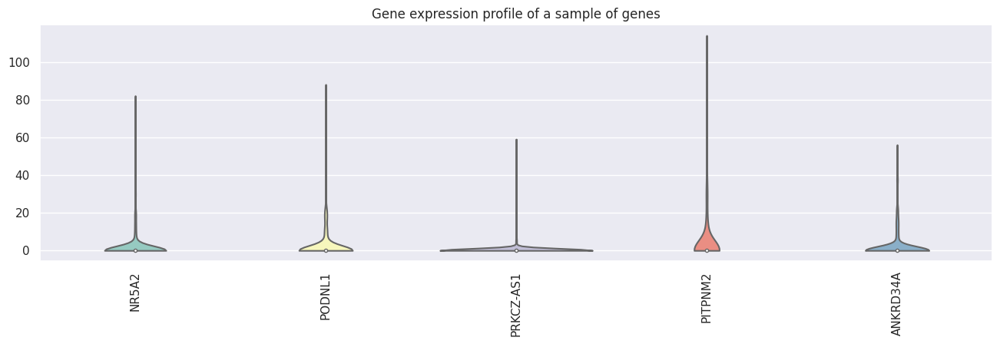

In [ ]:
# Plotting the violin plots of the gene expression for a sample of genes
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_filtered.iloc[:, 20:25],palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Gene expression profile of a sample of genes')
plt.show()

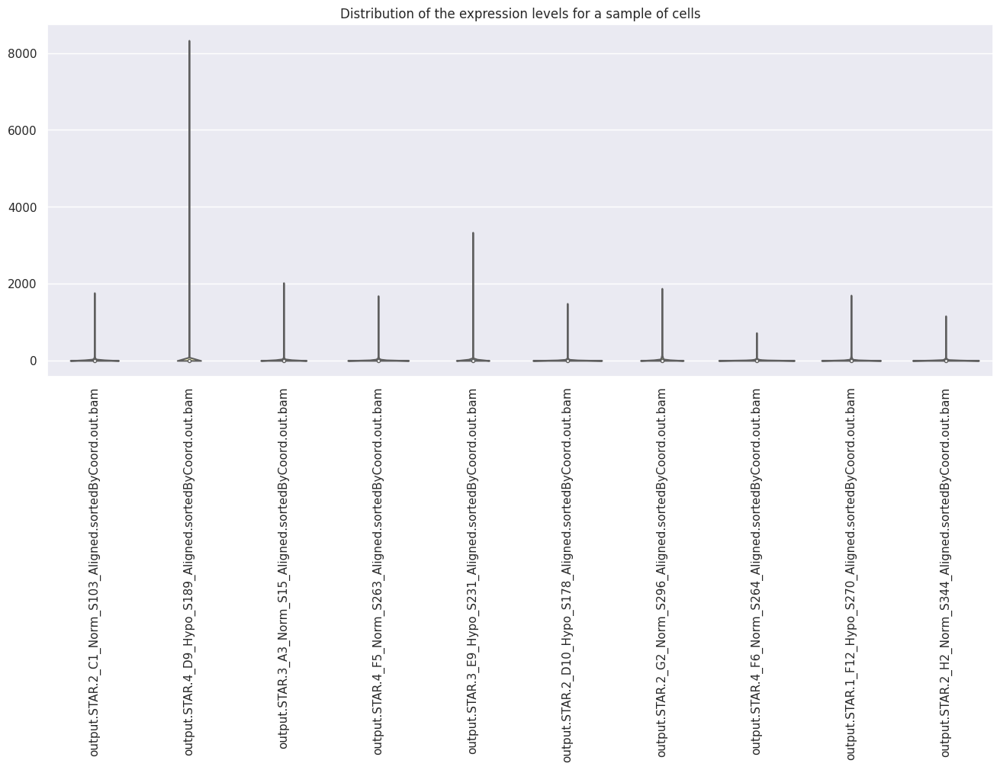

In [ ]:
# Distributions of the expression levels across cells for a sample of cells
plt.figure(figsize=(16, 6))
plot=sns.violinplot(data=df_filtered.iloc[:10,:].T, palette='Set3', cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Distribution of the expression levels for a sample of cells')
plt.show()

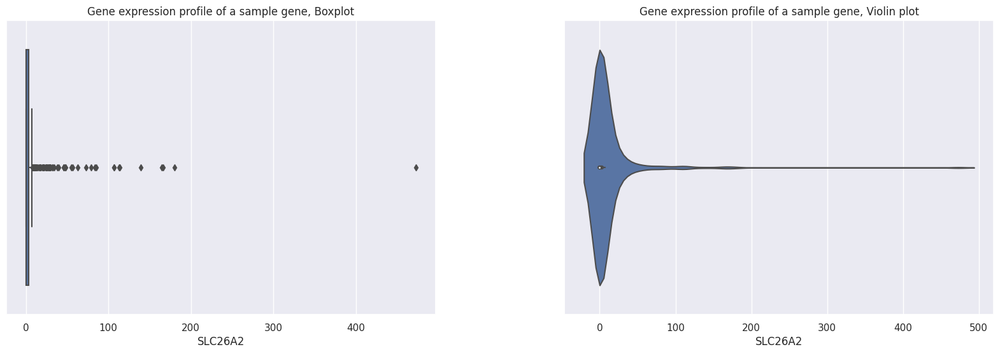

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of gene expression profile of a sample gene
cnames = list(df_filtered.columns)
cnames[5]
sns.boxplot(x=df_filtered.T.loc['SLC26A2', :], ax=ax[0]).set_title('Gene expression profile of a sample gene, Boxplot')

# Violin plot of gene expression of a sample gene
sns.violinplot(x=df_filtered.T.loc['SLC26A2', :], ax=ax[1]).set_title('Gene expression profile of a sample gene, Violin plot')
plt.show()

We calculate the sparsity level of our new dataframe and represent it graphically.

In [ ]:
print("sparsity level:", (df_filtered == 0).sum().sum() / df_filtered.size)
sparsity_levels_genes = (df_filtered==0).sum() / df_filtered.shape[0]
sparsity_levels_genes

sparsity level: 0.7723502577557452


NFASC       0.958904
KIF15       0.600000
GOLGA2P5    0.761644
MECOM       0.586301
NAT8L       0.915068
              ...   
ADGRF1      0.931507
MX1         0.893151
MFSD13A     0.673973
ALOX5       0.947945
DFFBP1      0.928767
Length: 4156, dtype: float64

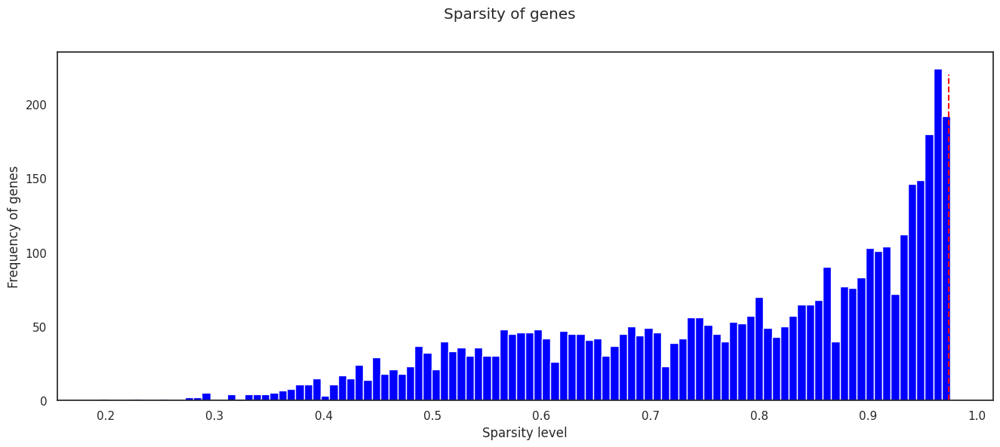

In [ ]:
fig = plt.figure(figsize=(16, 6))
sns.set_style("white")

ax1 = plt.axes()
bars = ax1.hist(sparsity_levels_genes, bins = 100, color = 'blue')

# Labels
fig.suptitle("Sparsity of genes")
ax1.set_xlabel("Sparsity level")
ax1.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9738903394255874

ax1.plot([sparsity_threshold, sparsity_threshold], [0, 220], color='red', linestyle='dashed')

sns.set_theme() # resetting the style plot

One might argue that our filtering didn't work correctly, since there are some genes that appear to have a higher sparsity than our previously established threshold. However, this was to be expected: we filtered out sparse data before applying other filtering methods. During the succeeding filtering methods, we deleted non-zero entries, causing an increase in the overall ratio of null entries (sparsity).

## Normalization


After the data transformation we move on to better understanding if the data are normalized or not.
We start by looking at the overall distribution of the gene expression of the cells.

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

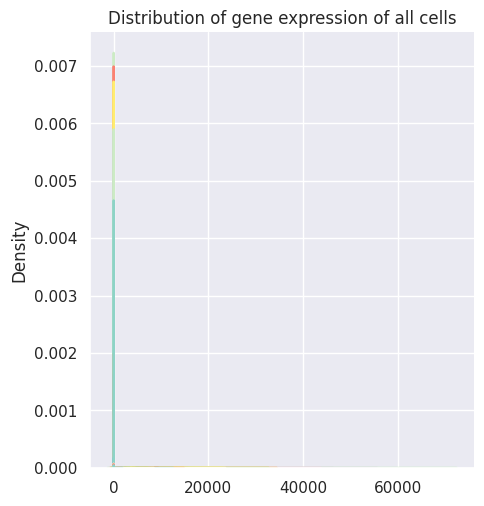

In [ ]:
sns.displot(data=df_filtered.T,palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

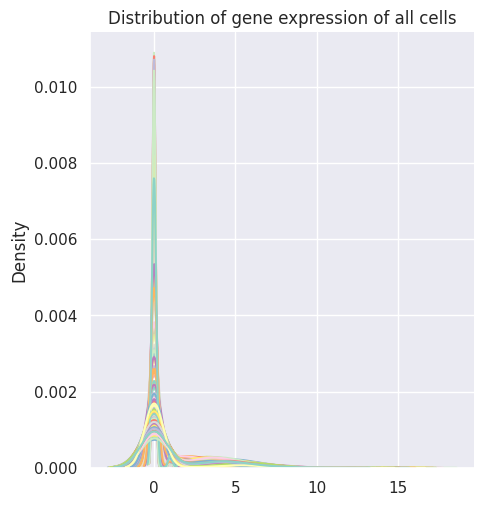

In [ ]:
sns.displot(data=(df_filtered.T+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

It's clear by looking at the graph that the data is not normalized, since the distributions of the gene expressions of the cells are very different and cover a wide range of values, but in a very uneven way across samples. This could be due to differences in the rilevation of the data or other types of outside noise, since we expect the distributions to be similar after having filtered the data.

Next we try different normalization techniques in order to solve this problem. We will combine the normalization with the log transformation, a techinque commonly used when dealing with data spanning across multiple orders of magnitude and whose usefulness will be further explained later.
We try applying the log before and after the normalization, giving respectively more importance to the main body or to the tail of the distribution, in order to find the best approach.
We could avoid this approach, but all we would see would be plots with a big spike at 0 and it wouldn't be possible to visually compare the normaliation techniques.

In [ ]:
df_filtered_log = (df_filtered+1).apply(np.log2)

MAX-MIN NORMALIZATIOM

In [ ]:
df_norm=df_filtered.T.copy()
for x in df_filtered.T.columns:
    df_norm.loc[:,x]=(df_filtered.T.loc[:,x]-df_filtered.T.loc[:,x].min())/(df_filtered.T.loc[:,x].max()-df_filtered.T.loc[:,x].min())

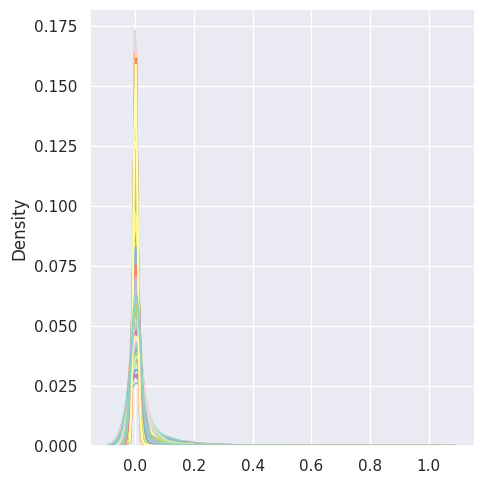

In [ ]:
sns.displot((df_norm+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)

In [ ]:
df_norm_log=df_filtered_log.T.copy()
for x in df_filtered_log.T.columns:
    df_norm_log.loc[:,x]=(df_filtered_log.T.loc[:,x]-df_filtered_log.T.loc[:,x].min())/(df_filtered_log.T.loc[:,x].max()-df_filtered_log.T.loc[:,x].min())

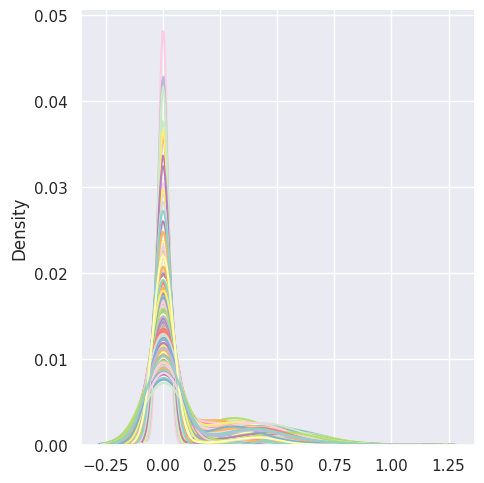

In [ ]:
sns.displot(data=(df_norm_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)

STANDARDIZATION

In [ ]:
df_std=df_filtered.T.copy()
for x in df_filtered.T.columns:
    df_std.loc[:,x]=(df_filtered.T.loc[:,x]-df_filtered.T.loc[:,x].mean())/df_filtered.T.loc[:,x].std()

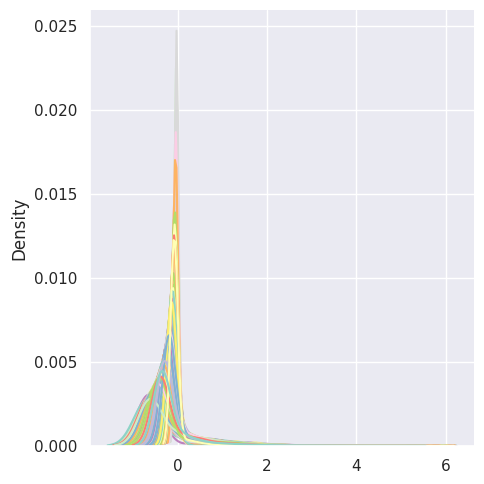

In [ ]:
sns.displot(data=(df_std+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)

In [ ]:
df_std_log=df_filtered_log.T.copy()
for x in df_filtered_log.T.columns:
    df_std_log.loc[:,x]=(df_filtered_log.T.loc[:,x]-df_filtered_log.T.loc[:,x].mean())/df_filtered_log.T.loc[:,x].std()

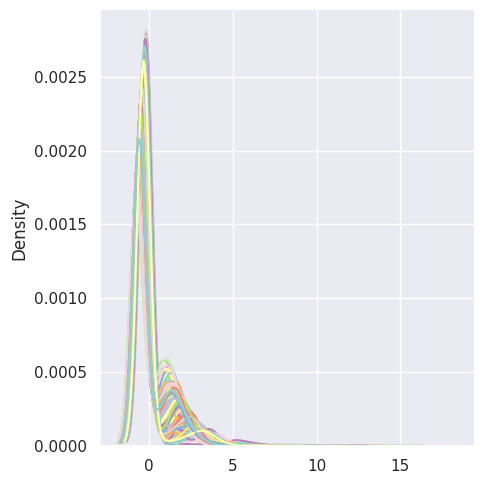

In [ ]:
sns.displot(data=(df_std_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)

COUNTS PER MILLION

In [ ]:
df_cpm=df_filtered.T.copy()
for x in df_filtered.T.columns:
    df_cpm.loc[:,x] = (df_filtered.T.loc[:,x]*1e6)/(df_filtered.T.loc[:,x].sum())

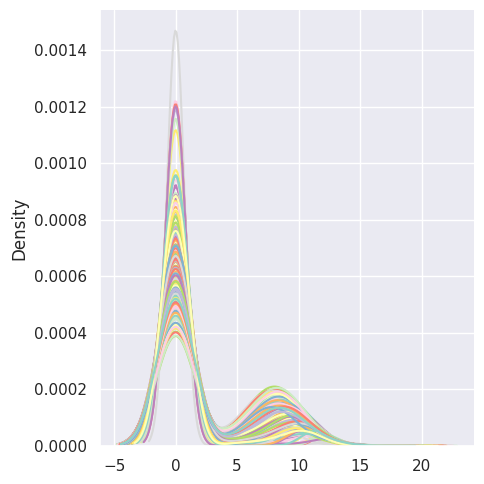

In [ ]:
sns.displot((df_cpm+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)

In [ ]:
df_cpm_log=df_filtered_log.T.copy()
for x in df_filtered_log.T.columns:
    df_cpm_log.loc[:,x] = (df_filtered_log.T.loc[:,x]*1e6)/(df_filtered_log.T.loc[:,x].sum())

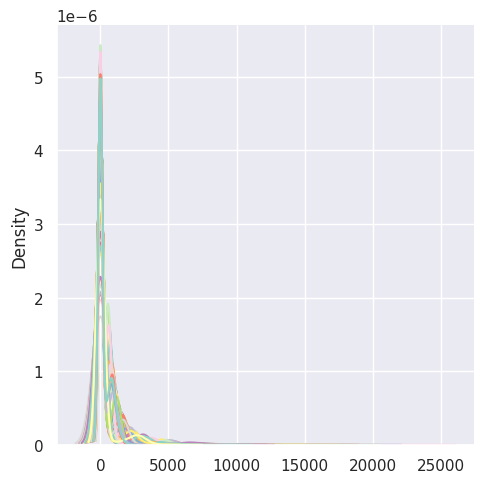

In [ ]:
sns.displot((df_cpm_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)

QUANTILE NORMALIZATION

In [ ]:
def quantile_normalize(df):
    # compute rank
    dic = {}
    for col in df:
        dic.update({col : sorted(df[col])})
    sorted_df = pd.DataFrame(dic)

    # compute average rank values
    rank_mean = sorted_df.mean(axis = 1).tolist()

    # sort by original order
    rank_mean.sort()
    for col in df:
        t = np.searchsorted(np.sort(df[col]), df[col])
        df[col] = [rank_mean[i] for i in t]
    return df

df_normalized = quantile_normalize(df_filtered.T)

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

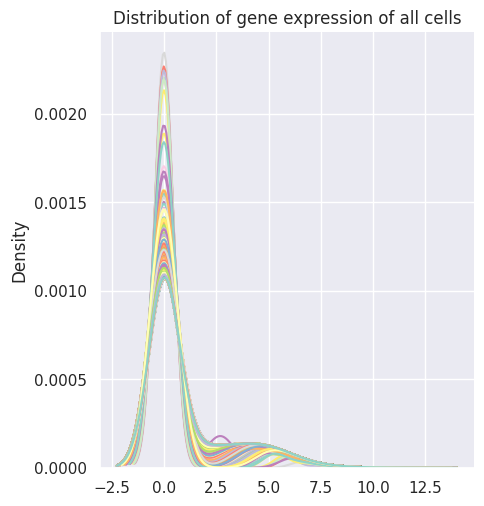

In [ ]:
sns.displot(data=(df_normalized+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

In [ ]:
df_normalized_log = quantile_normalize(df_filtered_log.T)

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

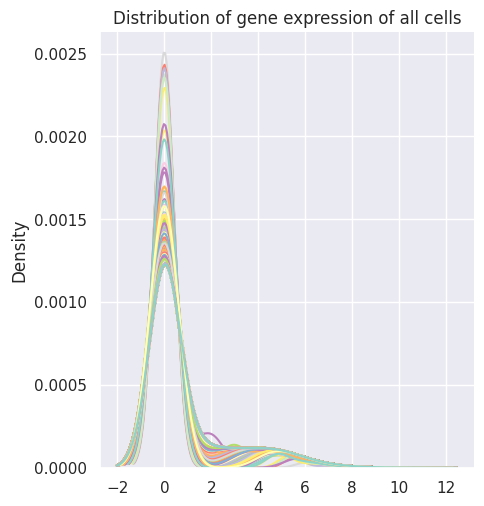

In [ ]:
sns.displot(data=(df_normalized_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

We can clearly see that the best normalization technique is the quantile normalization. It doesn't really matter if we perform the log transform before or after, since due to the nature of the normalization, results should be the same (there are small variations in our case due to the fact that we have many repeated values in the samples, but we will not further investigate this aspect).

In [ ]:
df_normalized.describe()

,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,...,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
count,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,...,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000
mean,10.250793,8.910661,10.221745,10.241926,10.199536,10.195114,10.189060,10.175532,9.879575,10.116844,...,9.385846,9.309848,10.250787,9.727655,10.168432,10.274251,10.267854,10.253524,9.489689,9.977513
std,70.440914,70.482101,70.438933,70.436647,70.452001,70.416988,70.457118,70.228781,70.491601,70.455450,...,70.503796,70.530914,70.448274,70.478929,70.362699,70.451897,70.452306,70.415683,70.474663,70.403867
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.476712,0.000000,1.465753,1.487671,1.695890,1.654795,0.000000,1.350685,0.000000,0.000000,...,0.000000,0.000000,1.476712,0.000000,1.695890,1.605479,1.720548,1.509589,0.000000,0.000000
max,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,...,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247,3448.734247


Since there is no difference between applying it before or after, we will next check the usefulness of the log tranformation on the normalized data.

## Summary statistics and log trasformation


In this part we inspect the summary statistics of the distribution of our data; in particular, we plot the distributions of the skewness and the kurtosis of both the gene expression profiles and the gene expression levels. Skewness is a commonly used measure in descriptive statistics that characterizes the asymmetry of a data distribution, while kurtosis determines the heaviness of the distribution tails.

First, we study the skewness and kurtosis at the cell level.

 Original skewness of cells  32.44598975192906
 Original kurtosis of cells  1435.0107386544094


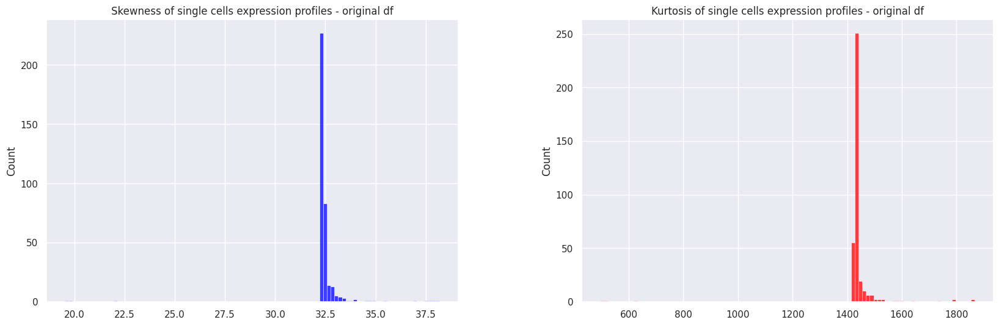

In [ ]:
from scipy.stats import kurtosis, skew
from statistics import mean

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of cells
cnames = list(df_normalized.columns)
colN = df_normalized.shape[1]
skew_cells = []

for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     skew_cells += [skew(v_df_normalized)]   

sns.histplot(skew_cells,bins=100, ax=ax[0], color = 'blue').set_title('Skewness of single cells expression profiles - original df')
print(' Original skewness of cells ', mean(skew_cells)) #skew(skew_cells, bias=False))

# Original Kurtosis of cells
colN = df_normalized.shape[1]

kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     kurt_cells += [kurtosis(v_df_normalized)]   
kurt_cells
sns.histplot(kurt_cells,bins=100,ax=ax[1], color = 'red').set_title('Kurtosis of single cells expression profiles - original df')
print(' Original kurtosis of cells ', mean(kurt_cells))#kurtosis(kurt_cells, bias=False))
plt.show()


Significant skewness and kurtosis clearly indicate that data are not normal; therefore, from the histograms plotted above, we can conclude that the distributions are highly non-normal and skewed with heavy tails. 

If a data set exhibits significant skewness or kurtosis we can apply some type of data transformation to try to make the data more normal. In particular, taking the log of a data set is often useful for data that has high skewness.

The logarithm with base 2 is frequently used to demonstrate that an increase of 1 signifies a double rise in the quantity of gene expression, while a decrease of 1 represents a halving of the feature abundance. As a result, modifications in feature values in either direction are balanced, resulting in gene up-regulation and down-regulation being symmetrical in relation to a control.


 Log2 skewness of cells  2.0784308572336916
 Log2 kurtosis of cells  3.582512869258687


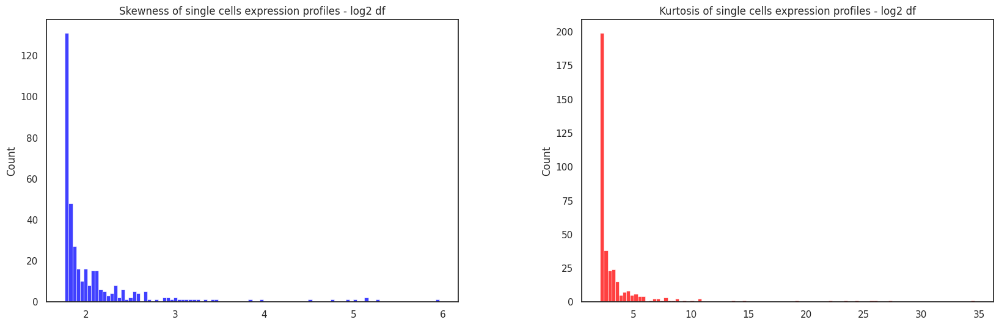

In [ ]:
# Applying the log transformation
df_log2 = df_normalized.apply(lambda x: np.log2(1+x))

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Log2 Skewness of cells
colN = df_log2.shape[1]

log2_skew_cells = []
for i in range(colN) :     
     v_df_normalized = df_log2[cnames[i]]
     log2_skew_cells += [skew(v_df_normalized)]   
log2_skew_cells
sns.histplot(log2_skew_cells,bins=100,ax=ax[0], color = 'blue').set_title('Skewness of single cells expression profiles - log2 df')
print(' Log2 skewness of cells ', mean(log2_skew_cells)) #skew(log2_skew_cells, bias=False))

# Log2 Kurtosis of cells
colN = df_log2.shape[1]

log2_kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_log2[cnames[i]]
     log2_kurt_cells += [kurtosis(v_df_normalized)] 
log2_kurt_cells
sns.histplot(log2_kurt_cells,bins=100,ax=ax[1], color = 'red').set_title('Kurtosis of single cells expression profiles - log2 df')
print(' Log2 kurtosis of cells ', mean(log2_kurt_cells)) #kurtosis(log2_kurt_cells, bias=False))
plt.show()

Now we do the same for the gene expression levels.

 Original skewness of genes  6.199448387313649
 Original kurtosis of genes  58.03648298665504
 Log2 skewness of genes  2.851239462585055
 Log2 kurtosis of genes  11.9937030636463


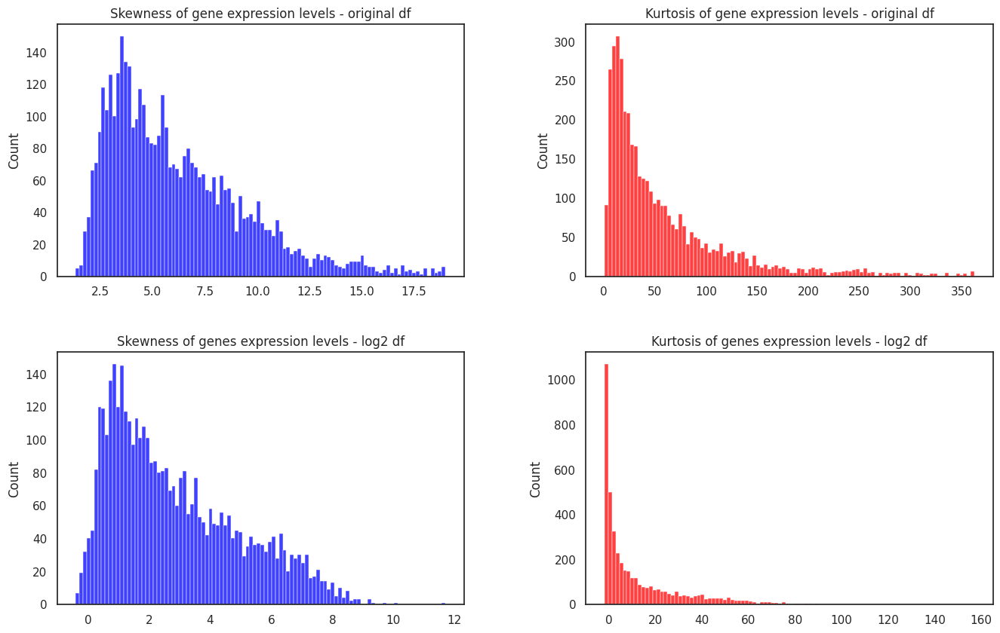

In [ ]:
df_log2 = df_normalized.apply(lambda x: np.log2(1+x))

fig, ax = plt.subplots( 2, 2, figsize = (16,10))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of genes
rowN = df_normalized.shape[0]

skew_genes = []
for i in range(rowN) :     
     skew_genes += [df_normalized.iloc[i,:].skew()]   
skew_genes
sns.histplot(skew_genes,bins=100,ax=ax[0,0], color = 'blue').set_title('Skewness of gene expression levels - original df')
print( " Original skewness of genes ", mean(skew_genes) )

# Original Kurtosis of genes
rowN = df_normalized.shape[0]

kurt_genes = []
for i in range(rowN) :     
     kurt_genes += [df_normalized.iloc[i,:].kurtosis()]   
kurt_genes
sns.histplot(kurt_genes,bins=100,ax=ax[0,1], color = 'red').set_title('Kurtosis of gene expression levels - original df')
print( " Original kurtosis of genes ",  mean(kurt_genes) )

# Log2 Skewness of genes
rowN = df_log2.shape[0]

log2_skew_genes = []
for i in range(rowN) :     
     log2_skew_genes += [df_log2.iloc[i, :].skew()]   
log2_skew_genes
sns.histplot(log2_skew_genes,bins=100,ax=ax[1,0], color = 'blue').set_title('Skewness of genes expression levels - log2 df')
print( " Log2 skewness of genes ", mean(log2_skew_genes) )

# Log2 Kurtosis of genes
rowN = df_log2.shape[0]

log2_kurt_genes = []
for i in range(rowN) :     
     log2_kurt_genes += [df_log2.iloc[i, :].kurtosis()]   
log2_kurt_genes
sns.histplot(log2_kurt_genes,bins=100,ax=ax[1,1], color = 'red').set_title('Kurtosis of genes expression levels - log2 df')
print( " Log2 kurtosis of genes ",  mean(log2_kurt_genes) )
plt.show()


From this analysis we can make a general conclusion. After the log2 transformation, the high skewness and the heavy tails, both present in the distributions at the cell and gene level, are reduced. In fact, the skewnes and kurtosis are both closer to 0, which means that our data is now more symmetric and normalized.

Next we can plot the distributions of some genes and cells after the log2 transformation and compare them to the plots studied in the initial EDA.

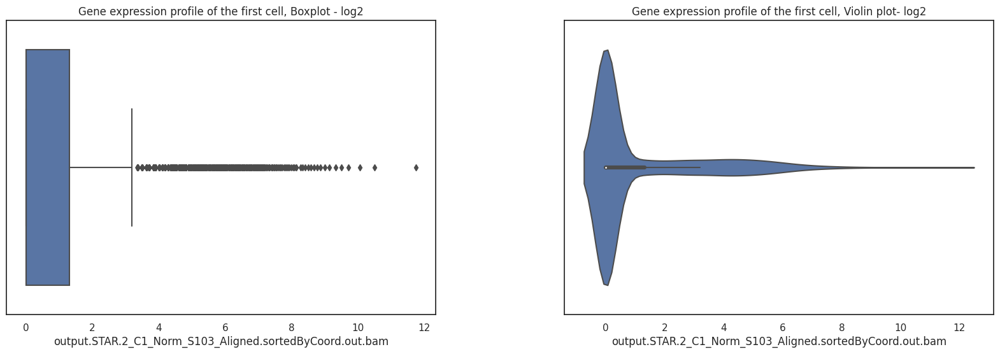

In [ ]:

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of the genes expression profiles of the first cell - log2
sns.boxplot(x=df_log2.iloc[:,0], ax=ax[0]).set_title('Gene expression profile of the first cell, Boxplot - log2')
# Violin plot of the genes expression profiles of the first cell - log2
sns.violinplot(x=df_log2.iloc[:,0], ax=ax[1]).set_title('Gene expression profile of the first cell, Violin plot- log2')
plt.show()

In [ ]:
dfS123_log2 = df_log2.iloc[:,0]
display(dfS123_log2.describe().round(2))

count    4156.00
mean        1.07
std         1.97
min         0.00
25%         0.00
50%         0.00
75%         1.31
max        11.75
Name: output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam, dtype: float64

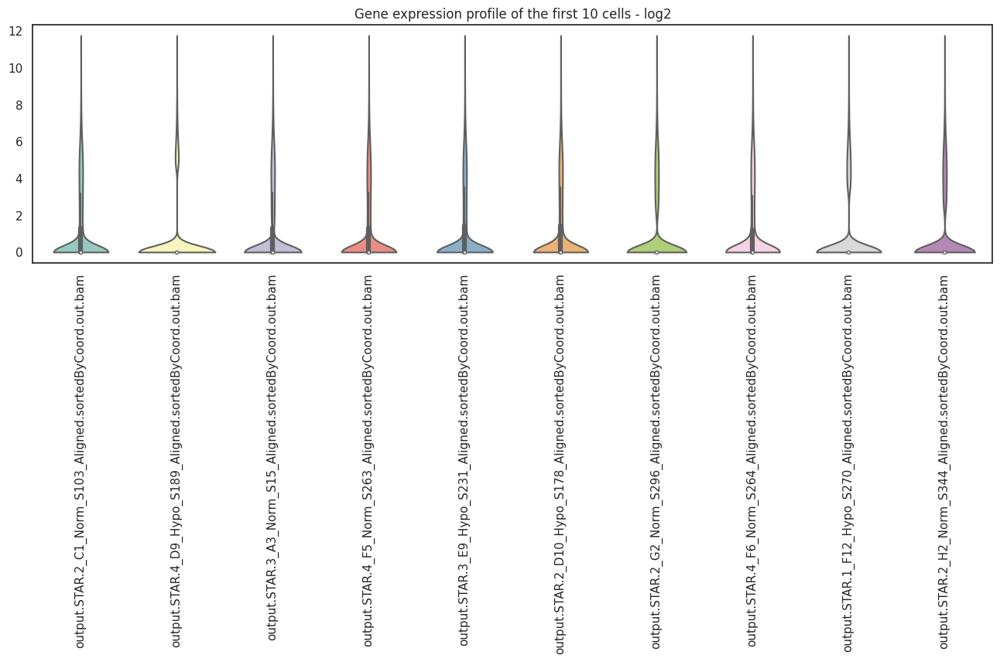

In [ ]:
# Plotting the violin plots of the gene expression for the first 10 single cells - log2
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_log2.iloc[:, :10],palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Gene expression profile of the first 10 cells - log2')
plt.show()

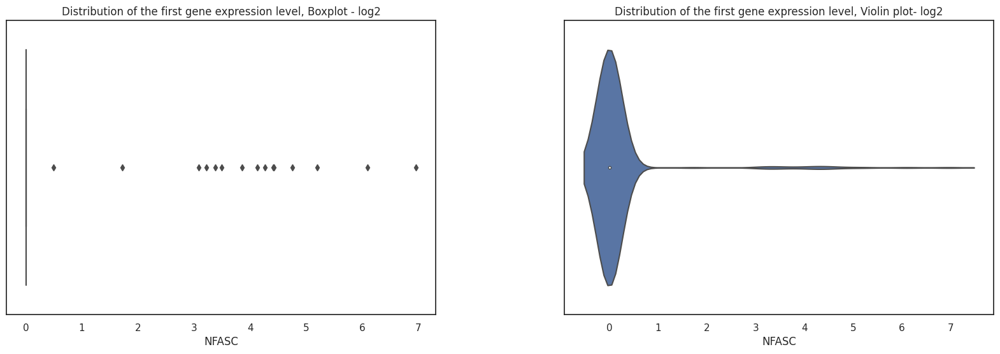

In [ ]:

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of the distribution of the first gene expression level - log2
sns.boxplot(x=df_log2.iloc[0,:], ax=ax[0]).set_title('Distribution of the first gene expression level, Boxplot - log2')

# Violin plot of the distribution of the first gene expression level - log2
sns.violinplot(x=df_log2.iloc[0, :], ax=ax[1]).set_title('Distribution of the first gene expression level, Violin plot- log2')
plt.show()

In [ ]:
dfWASH7P_log2 = df_log2.iloc[0,:]
display(dfWASH7P_log2.describe().round(2))

count    365.00
mean       0.16
std        0.85
min        0.00
25%        0.00
50%        0.00
75%        0.00
max        6.96
Name: NFASC, dtype: float64

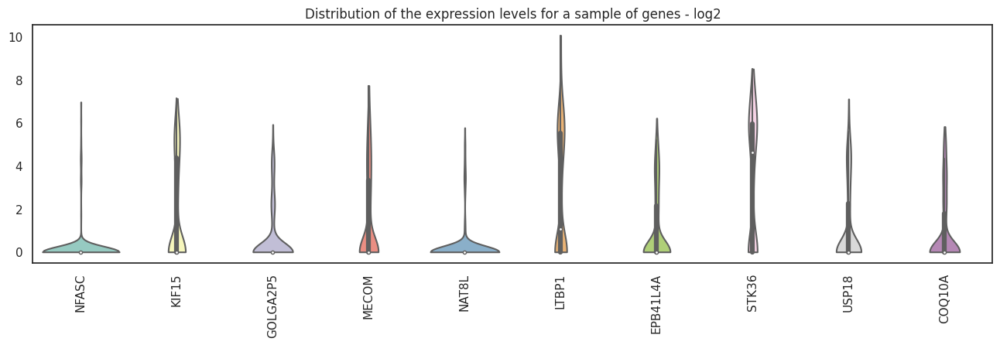

In [ ]:
# Distributions of the expression levels across cells for a sample of genes - log2

plt.figure(figsize=(16, 4))
plot=sns.violinplot(data=df_log2.iloc[:10,:].T, palette='Set3', cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Distribution of the expression levels for a sample of genes - log2')
plt.show()




Now we try the cube root transformation on our dataframe both at the level of cells and genes to see if we can further mitigate the high skewnees and kurtosis.

 Original skewness of cells  32.44598975192906
 Original kurtosis of cells  1435.0107386544094
 Cube skewness of cells  2.679422150221923
 cube kurtosis of cells  10.217350519997936


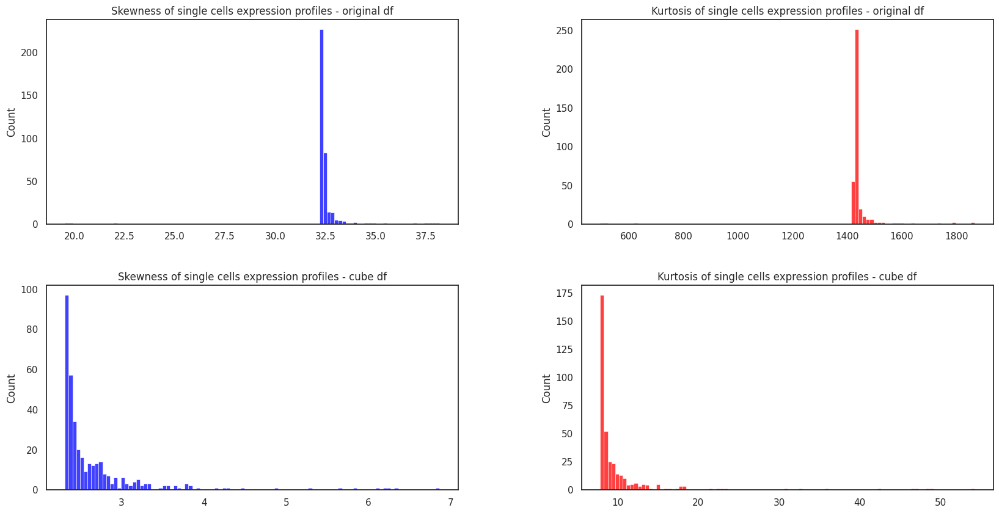

In [ ]:
from scipy.stats import kurtosis, skew

fig, ax = plt.subplots( 2, 2, figsize = (20,10))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of cells
cnames = list(df_normalized.columns)
colN = df_normalized.shape[1]

skew_cells = []
for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     skew_cells += [skew(v_df_normalized)]   
skew_cells
sns.histplot(skew_cells,bins=100, ax=ax[0,0], color = 'blue').set_title('Skewness of single cells expression profiles - original df')
print(' Original skewness of cells ',mean(skew_cells))

# Original Kurtosis of cells
colN = df_normalized.shape[1]

kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     kurt_cells += [kurtosis(v_df_normalized)]   
kurt_cells
sns.histplot(kurt_cells,bins=100,ax=ax[0,1], color = 'red').set_title('Kurtosis of single cells expression profiles - original df')
print(' Original kurtosis of cells ', mean(kurt_cells))


df_cbrt = df_normalized.apply(lambda x: np.cbrt(x))

# Cube Skewness of cells
colN = df_cbrt.shape[1]

cbrt_skew_cells = []
for i in range(colN) :     
     v_df_normalized = df_cbrt[cnames[i]]
     cbrt_skew_cells += [skew(v_df_normalized)]   
cbrt_skew_cells
sns.histplot(cbrt_skew_cells,bins=100,ax=ax[1,0], color = 'blue').set_title('Skewness of single cells expression profiles - cube df')
print(' Cube skewness of cells ', mean(cbrt_skew_cells))

# Cube Kurtosis of cells
colN = df_cbrt.shape[1]

cbrt_kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_cbrt[cnames[i]]
     cbrt_kurt_cells += [kurtosis(v_df_normalized)] 
cbrt_kurt_cells
sns.histplot(cbrt_kurt_cells,bins=100,ax=ax[1,1], color = 'red').set_title('Kurtosis of single cells expression profiles - cube df')
print(' cube kurtosis of cells ', mean(cbrt_kurt_cells))
plt.show()

 Original skewness of genes  6.199448387313649
 Original kurtosis of genes  58.03648298665504
 Cube skewness of genes  2.81778482675772
 Cube kurtosis of genes  11.572631096530447


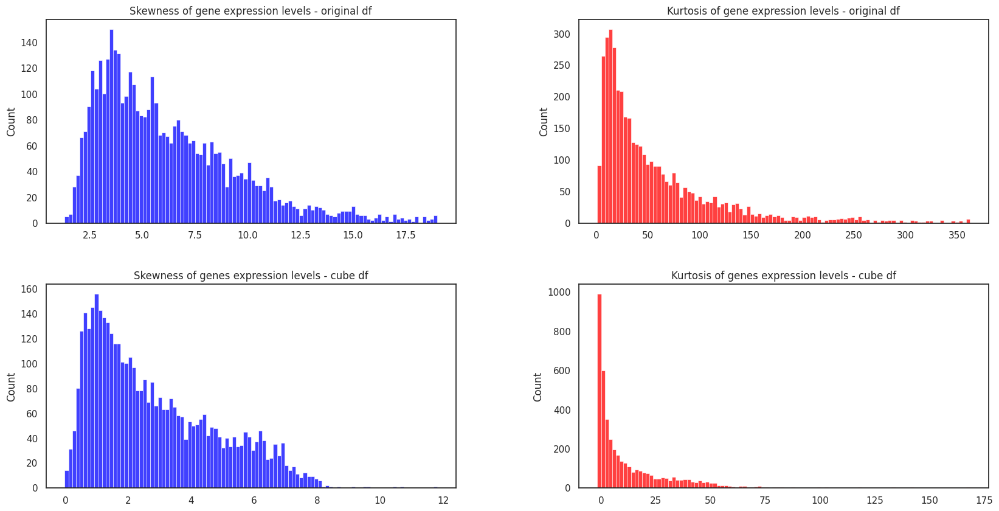

In [ ]:
df_cbrt = df_normalized.apply(lambda x: np.cbrt(x))

fig, ax = plt.subplots( 2, 2, figsize = (20,10))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of genes
rowN = df_normalized.shape[0]

skew_genes = []
for i in range(rowN) :     
     skew_genes += [df_normalized.iloc[i,:].skew()]   
skew_genes
sns.histplot(skew_genes,bins=100,ax=ax[0,0], color = 'blue').set_title('Skewness of gene expression levels - original df')
print( " Original skewness of genes ", mean(skew_genes) )

# Original Kurtosis of genes
rowN = df_normalized.shape[0]

kurt_genes = []
for i in range(rowN) :     
     kurt_genes += [df_normalized.iloc[i,:].kurtosis()]   
kurt_genes
sns.histplot(kurt_genes,bins=100,ax=ax[0,1], color = 'red').set_title('Kurtosis of gene expression levels - original df')
print( " Original kurtosis of genes ",  mean(kurt_genes) )

# Cube Skewness of genes
rowN = df_cbrt.shape[0]

cbrt_skew_genes = []
for i in range(rowN) :     
     cbrt_skew_genes += [df_cbrt.iloc[i, :].skew()]   
cbrt_skew_genes
sns.histplot(cbrt_skew_genes,bins=100,ax=ax[1,0], color = 'blue').set_title('Skewness of genes expression levels - cube df')
print( " Cube skewness of genes ", mean(cbrt_skew_genes) )

# Cube Kurtosis of genes
rowN = df_cbrt.shape[0]

cbrt_kurt_genes = []
for i in range(rowN) :     
     cbrt_kurt_genes += [df_cbrt.iloc[i, :].kurtosis()]   
cbrt_kurt_genes
sns.histplot(cbrt_kurt_genes,bins=100,ax=ax[1,1], color = 'red').set_title('Kurtosis of genes expression levels - cube df')
print( " Cube kurtosis of genes ",  mean(cbrt_kurt_genes) )
plt.show()

We can deduce that, compared to the log-transformation, the cube-trasformation did a worse job at decreasing kurtosis and skewness at the cell level, while it is almost the same at the gene level.

We therefore keep the dataframe with the log transformation applied.

In [ ]:
df_log2

,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,...,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
NFASC,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
KIF15,5.208812,0.0,5.630275,1.659424,6.049834,4.797297,0.0,0.042836,0.000000,4.727697,...,0.0,0.0,5.784016,0.00000,0.000000,4.655979,2.626519,0.000000,0.0,0.000000
GOLGA2P5,0.000000,0.0,0.000000,3.896312,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,4.33687,0.957889,0.000000,0.000000,0.000000,0.0,0.000000
MECOM,3.019141,0.0,1.302029,0.000000,0.000000,0.000000,0.0,4.213827,0.000000,0.000000,...,0.0,0.0,5.067563,0.00000,0.491062,3.223380,5.845456,5.078250,0.0,5.179555
NAT8L,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,1.029344,0.00000,0.000000,0.000000,4.374134,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ADGRF1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,4.670176,0.000000,...,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
MX1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
MFSD13A,3.710438,0.0,0.000000,0.000000,3.117148,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.00000,3.573720,2.438074,4.374134,4.051444,0.0,0.000000
ALOX5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


In [ ]:
df_log2.describe()

,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,...,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
count,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,...,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000
mean,1.070373,0.583880,1.040187,1.072304,1.055187,1.067928,0.991374,1.081185,0.842796,0.967081,...,0.693457,0.666229,1.057558,0.801123,1.075770,1.087849,1.071424,1.090302,0.733154,0.954580
std,1.967271,1.781001,1.976638,1.965779,1.963390,1.958198,1.987331,1.948612,1.954492,1.981655,...,1.870657,1.852809,1.974569,1.932789,1.952733,1.960142,1.970316,1.957870,1.894007,1.966071
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.308426,0.000000,1.302029,1.314796,1.430762,1.408600,0.000000,1.233081,0.000000,0.000000,...,0.000000,0.000000,1.305832,0.000000,1.430762,1.381549,1.443897,1.327451,0.000000,0.000000
max,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,...,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270,11.752270


## Correlation

In [ ]:
df=df_log2.copy()

In [ ]:
df.shape

(4156, 365)

In [ ]:
## separation of hypoxic and normoxic cells

condition_hypo = np.array(['Hypo' in cell for cell in df.columns])
condition_normo = np.array(['Norm' in cell for cell in df.columns])
df_hypo = df[df.columns[condition_hypo]]
df_normo = df[df.columns[condition_normo]]
display(df_hypo, df_normo)

,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,output.STAR.4_F7_Hypo_S283_Aligned.sortedByCoord.out.bam,output.STAR.4_A8_Hypo_S44_Aligned.sortedByCoord.out.bam,output.STAR.1_F11_Hypo_S269_Aligned.sortedByCoord.out.bam,output.STAR.3_C7_Hypo_S133_Aligned.sortedByCoord.out.bam,output.STAR.1_F7_Hypo_S265_Aligned.sortedByCoord.out.bam,...,output.STAR.3_G12_Hypo_S330_Aligned.sortedByCoord.out.bam,output.STAR.3_A7_Hypo_S37_Aligned.sortedByCoord.out.bam,output.STAR.2_G8_Hypo_S320_Aligned.sortedByCoord.out.bam,output.STAR.1_E9_Hypo_S219_Aligned.sortedByCoord.out.bam,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
NFASC,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.0,0.000000
KIF15,0.0,6.049834,4.797297,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.487895,0.000000,0.000000,5.161998,0.0,0.0,5.784016,0.00000,0.0,0.000000
GOLGA2P5,0.0,0.000000,0.000000,0.000000,0.0,4.069919,0.000000,0.000000,0.000000,0.000000,...,0.000000,2.339215,0.000000,0.000000,0.0,0.0,0.000000,4.33687,0.0,0.000000
MECOM,0.0,0.000000,0.000000,0.000000,0.0,1.352433,0.000000,0.000000,4.317177,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,5.067563,0.00000,0.0,5.179555
NAT8L,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.029344,0.00000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ADGRF1,0.0,0.000000,0.000000,4.670176,0.0,0.000000,0.000000,5.010706,0.000000,4.558033,...,1.474089,0.000000,3.802547,0.000000,0.0,0.0,0.000000,0.00000,0.0,0.000000
MX1,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.0,0.000000
MFSD13A,0.0,3.117148,0.000000,0.000000,0.0,0.000000,5.093611,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.0,0.000000
ALOX5,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,4.783299,0.000000,0.000000,...,2.497376,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.0,0.000000


,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,output.STAR.2_D6_Norm_S156_Aligned.sortedByCoord.out.bam,output.STAR.1_H2_Norm_S338_Aligned.sortedByCoord.out.bam,output.STAR.4_C1_Norm_S115_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,...,output.STAR.3_B1_Norm_S61_Aligned.sortedByCoord.out.bam,output.STAR.1_D2_Norm_S146_Aligned.sortedByCoord.out.bam,output.STAR.2_E3_Norm_S201_Aligned.sortedByCoord.out.bam,output.STAR.2_C6_Norm_S108_Aligned.sortedByCoord.out.bam,output.STAR.3_C3_Norm_S111_Aligned.sortedByCoord.out.bam,output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam
NFASC,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
KIF15,5.208812,5.630275,1.659424,0.0,0.042836,4.727697,0.099272,0.00000,6.066089,0.000000,...,4.982103,4.343310,4.856208,0.000000,0.000000,0.000000,0.000000,4.655979,2.626519,0.000000
GOLGA2P5,0.000000,0.000000,3.896312,0.0,0.000000,0.000000,0.266324,0.00000,0.000000,5.328337,...,0.000000,0.000000,1.211055,0.000000,0.000000,0.000000,0.957889,0.000000,0.000000,0.000000
MECOM,3.019141,1.302029,0.000000,0.0,4.213827,0.000000,2.563726,0.00000,2.421938,0.000000,...,5.805165,6.058162,0.000000,4.479592,1.058103,5.161998,0.491062,3.223380,5.845456,5.078250
NAT8L,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.374134,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ADGRF1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MX1,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MFSD13A,3.710438,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,6.35514,3.692207,0.000000,...,3.243135,0.000000,0.000000,5.187820,3.198193,3.644646,3.573720,2.438074,4.374134,4.051444
ALOX5,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


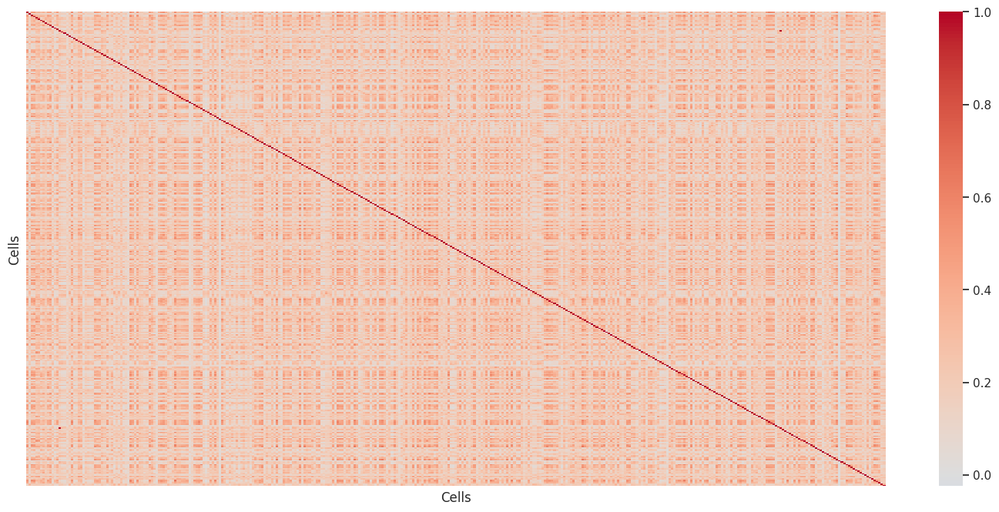

In [ ]:
## general correlation

plt.figure(figsize=(18,8))
c = df.corr()
sns.heatmap(c,cmap='coolwarm', center=0, xticklabels=False, yticklabels=False)
plt.xlabel("Cells")
plt.ylabel("Cells");

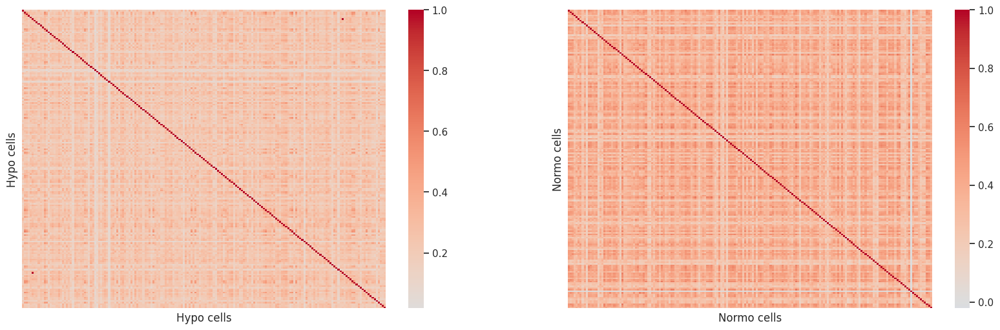

In [ ]:
## correlation normoxic-normoxic and hypoxic-hypoxic

fig, ax = plt.subplots(1, 2, figsize = (20,6))
c1= df_hypo.corr()
c2= df_normo.corr()

sns.heatmap(c1,cmap='coolwarm', center=0, ax = ax[0], xticklabels=False, yticklabels=False)
sns.heatmap(c2,cmap='coolwarm', center=0, ax = ax[1], xticklabels=False, yticklabels=False)
ax[0].set_xlabel("Hypo cells")
ax[0].set_ylabel("Hypo cells")
ax[1].set_xlabel("Normo cells")
ax[1].set_ylabel("Normo cells");

In [ ]:
## correlation whihch includes also hypoxic-normoxic 
## firstly I group the correlations computed previously based on the condition

corr_hypo = pd.DataFrame(c.columns[['Hypo' in cell for cell in df.columns]])
corr_normo = pd.DataFrame(c.columns[['Norm' in cell for cell in df.columns]])
grouped_corr = c.loc[pd.concat([corr_hypo, corr_normo])[0], pd.concat([corr_hypo, corr_normo])[0]]
grouped_corr

,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,output.STAR.4_F7_Hypo_S283_Aligned.sortedByCoord.out.bam,output.STAR.4_A8_Hypo_S44_Aligned.sortedByCoord.out.bam,output.STAR.1_F11_Hypo_S269_Aligned.sortedByCoord.out.bam,output.STAR.3_C7_Hypo_S133_Aligned.sortedByCoord.out.bam,output.STAR.1_F7_Hypo_S265_Aligned.sortedByCoord.out.bam,...,output.STAR.3_B1_Norm_S61_Aligned.sortedByCoord.out.bam,output.STAR.1_D2_Norm_S146_Aligned.sortedByCoord.out.bam,output.STAR.2_E3_Norm_S201_Aligned.sortedByCoord.out.bam,output.STAR.2_C6_Norm_S108_Aligned.sortedByCoord.out.bam,output.STAR.3_C3_Norm_S111_Aligned.sortedByCoord.out.bam,output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam
output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,1.000000,0.174787,0.145059,0.128517,0.255360,0.178793,0.193579,0.175832,0.300333,0.195833,...,0.141778,0.037239,0.053840,0.106289,0.119020,0.095185,0.129974,0.121897,0.102251,0.115578
output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,0.174787,1.000000,0.494742,0.322134,0.281599,0.253746,0.287071,0.216991,0.247265,0.239257,...,0.378820,0.291203,0.325318,0.165194,0.135869,0.177688,0.204267,0.330630,0.256344,0.173045
output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,0.145059,0.494742,1.000000,0.369847,0.247915,0.305721,0.263972,0.236009,0.214633,0.282653,...,0.315908,0.339495,0.367431,0.198101,0.179915,0.213189,0.250168,0.300744,0.281717,0.264445
output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,0.128517,0.322134,0.369847,1.000000,0.175043,0.225682,0.169707,0.212701,0.203033,0.179901,...,0.233160,0.235579,0.249312,0.181591,0.151706,0.176815,0.229980,0.204550,0.204144,0.249106
output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,0.255360,0.281599,0.247915,0.175043,1.000000,0.246794,0.238195,0.267662,0.238058,0.276094,...,0.084137,0.095399,0.131125,0.097877,0.115112,0.104287,0.171753,0.083155,0.066484,0.066429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,0.095185,0.177688,0.213189,0.176815,0.104287,0.208506,0.178702,0.152750,0.111866,0.127173,...,0.270594,0.315747,0.315322,0.320033,0.316709,1.000000,0.417975,0.268511,0.287972,0.346886
output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,0.129974,0.204267,0.250168,0.229980,0.171753,0.273605,0.225569,0.206171,0.161278,0.182575,...,0.228250,0.286878,0.343599,0.297643,0.299101,0.417975,1.000000,0.239335,0.251464,0.323817
output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,0.121897,0.330630,0.300744,0.204550,0.083155,0.126632,0.062150,0.059026,0.205315,0.058364,...,0.571244,0.420935,0.409719,0.365258,0.221769,0.268511,0.239335,1.000000,0.522446,0.381319
output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,0.102251,0.256344,0.281717,0.204144,0.066484,0.108978,0.086717,0.060635,0.138941,0.073706,...,0.452835,0.429625,0.419883,0.364422,0.235836,0.287972,0.251464,0.522446,1.000000,0.394358


Text(0.5, 1.0, 'Correlation Matrix')

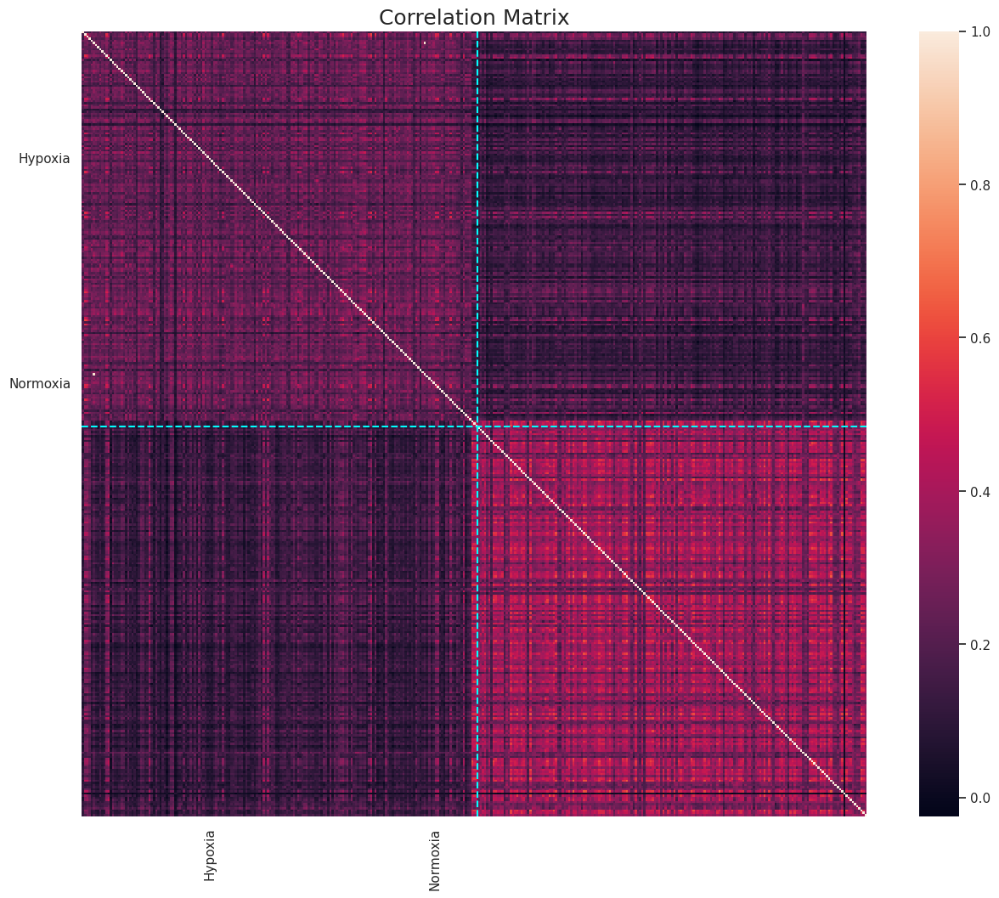

In [ ]:
## correlation matrix

f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(grouped_corr, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([0,df.shape[1]], [df_normo.shape[1],df_normo.shape[1]], color='cyan', 
              linestyle='dashed')
plt.plot([df_normo.shape[1],df_normo.shape[1]], [0,df.shape[1]], color='cyan', 
              linestyle='dashed')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.title("Correlation Matrix", fontsize=18)

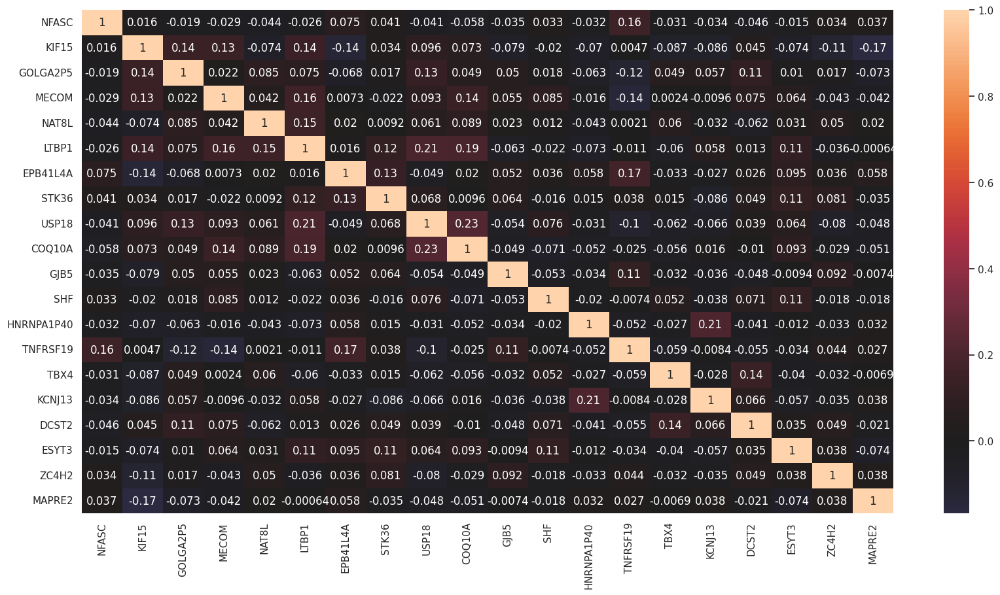

In [ ]:
## correlation between some of the genes plotted

plt.figure(figsize=(20,10))
c = df.transpose().iloc[:,:20].corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c, center=0, annot=True);

In [ ]:
## trying to define an analytic correlation based on the prevalence of some genes in normoxic or hypoxic cells

hypo_sum = np.zeros(len(df.transpose().columns))
normo_sum = np.zeros(len(df.transpose().columns))
for i in range(len(df.transpose().columns)):
    hypo_sum[i] = df_hypo.loc[df_hypo.transpose().columns[i]].sum()*121/233
    normo_sum[i] = df_normo.loc[df_normo.transpose().columns[i]].sum()*112/233
ratio_hypo = hypo_sum/(hypo_sum+normo_sum)
ratio_normo = normo_sum/(hypo_sum+normo_sum)
df_corr = pd.DataFrame({"Ratio_hypo":ratio_hypo, "Ratio_normo":ratio_normo}, index=df.transpose().columns)
df_corr

,Ratio_hypo,Ratio_normo
NFASC,0.700025,0.299975
KIF15,0.308326,0.691674
GOLGA2P5,0.169710,0.830290
MECOM,0.358946,0.641054
NAT8L,0.497290,0.502710
...,...,...
ADGRF1,0.921955,0.078045
MX1,0.229779,0.770221
MFSD13A,0.202535,0.797465
ALOX5,0.876254,0.123746


<Axes: >

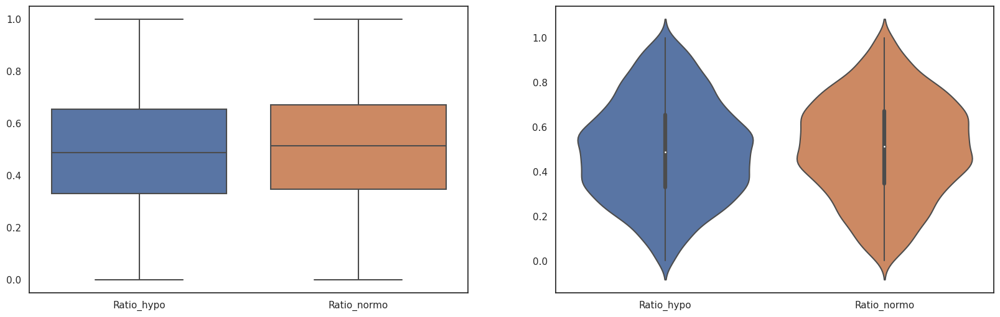

In [ ]:
## idk if this is useful, era carino

fig,ax = plt.subplots(1, 2, figsize = (20,6))
sns.boxplot(df_corr, ax=ax[0])
sns.violinplot(df_corr, ax=ax[1])

In [ ]:
## 50 most correlated genes to hypoxic or normoxic condition based on the last-computed metric

genes_hypo = df_corr.sort_values(by='Ratio_normo').iloc[:50,:]
genes_normo = df_corr.sort_values(by='Ratio_hypo').iloc[:50,:]
display(genes_normo,genes_hypo)

,Ratio_hypo,Ratio_normo
HOXB13,0.000000,1.000000
THRSP,0.000000,1.000000
EMX1,0.000000,1.000000
IGHE,0.000000,1.000000
ADGRG5,0.000000,1.000000
AOX1,0.000000,1.000000
LINC02028,0.000000,1.000000
ACP7,0.000000,1.000000
MAGEC3,0.000000,1.000000
TMEM169,0.000000,1.000000


,Ratio_hypo,Ratio_normo
C1orf116,1.000000,0.000000
CAVIN2,1.000000,0.000000
RYR2,1.000000,0.000000
SPRR1A,1.000000,0.000000
TRBV30,1.000000,0.000000
LINC01732,1.000000,0.000000
CDH16,1.000000,0.000000
SPRR1B,1.000000,0.000000
UMODL1,1.000000,0.000000
CAVIN2-AS1,0.999416,0.000584


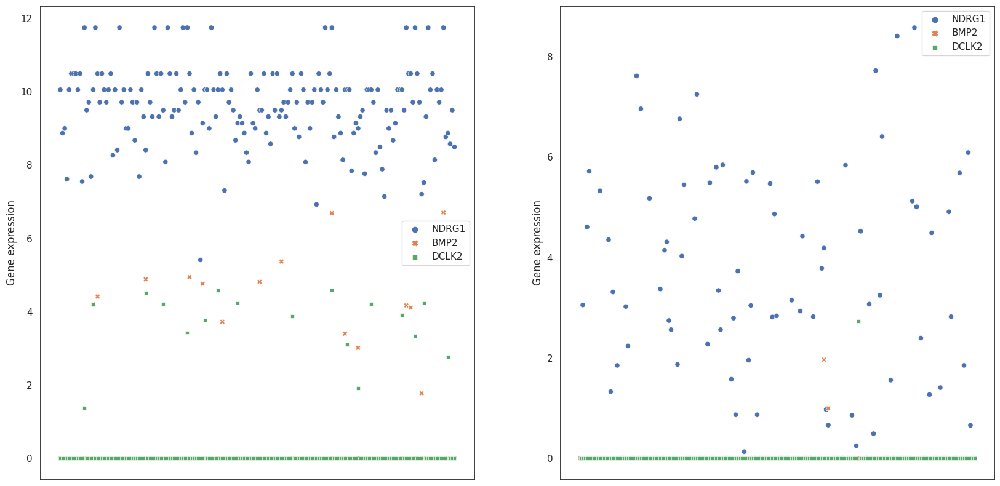

In [ ]:
## choosing one of these genes which show a strong "imbalance" and comparing the behaviour in normoxic and hypoxic cells, we can see, indeed, the difference in its expression

fig,ax = plt.subplots(1, 2, figsize = (20,10))
sns.scatterplot(df_hypo.T[['NDRG1','BMP2','DCLK2']], ax=ax[0]).set(xticklabels=[])
sns.scatterplot(df_normo.T[['NDRG1','BMP2','DCLK2']], ax=ax[1]).set(xticklabels=[])
ax[0].set_ylabel('Gene expression')
ax[1].set_ylabel('Gene expression');

In [ ]:
## actually computing the correlation with 'condition' as a categorical variable

cond = pd.DataFrame(['Hypo' in cell for cell in df.columns])
cond.index = df.columns
cond.columns = ['Hypo_condition']
data_cond = pd.concat([df.transpose(), cond], axis = 1)
corr_genes = data_cond.corr()

In [ ]:
## ordering values, in order to see the ones that are more correlated with Hypoxia

most_correlated = pd.Series.sort_values((corr_genes["Hypo_condition"]), ascending=False)
most_correlated

Hypo_condition    1.000000
NDRG1             0.913846
HK2               0.856557
PFKFB4            0.828368
RIMKLA            0.772246
                    ...   
IFITM1           -0.732984
ELOVL2           -0.733162
ASF1B            -0.735517
PYCR3            -0.742046
SFXN2            -0.768186
Name: Hypo_condition, Length: 4157, dtype: float64

In [ ]:
df_grouped = pd.concat([df_hypo, df_normo], axis = 1)
df_grouped_corr = df_grouped.loc[most_correlated[1:15].index]
df_grouped_corr

,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,output.STAR.4_F7_Hypo_S283_Aligned.sortedByCoord.out.bam,output.STAR.4_A8_Hypo_S44_Aligned.sortedByCoord.out.bam,output.STAR.1_F11_Hypo_S269_Aligned.sortedByCoord.out.bam,output.STAR.3_C7_Hypo_S133_Aligned.sortedByCoord.out.bam,output.STAR.1_F7_Hypo_S265_Aligned.sortedByCoord.out.bam,...,output.STAR.3_B1_Norm_S61_Aligned.sortedByCoord.out.bam,output.STAR.1_D2_Norm_S146_Aligned.sortedByCoord.out.bam,output.STAR.2_E3_Norm_S201_Aligned.sortedByCoord.out.bam,output.STAR.2_C6_Norm_S108_Aligned.sortedByCoord.out.bam,output.STAR.3_C3_Norm_S111_Aligned.sortedByCoord.out.bam,output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam
NDRG1,10.059115,8.875011,9.001836,7.619582,10.059115,10.498683,10.498683,10.498683,10.059115,10.498683,...,0.00000,0.000000,5.685541,0.000000,1.851287,0.000000,6.090598,0.655665,0.000000,0.000000
HK2,10.498683,8.497923,8.770901,5.777402,11.752270,10.059115,11.752270,9.144365,8.035428,9.501406,...,0.00000,1.842497,7.355912,4.682235,0.000000,0.000000,1.430762,3.611722,0.736175,0.000000
PFKFB4,9.501406,8.677155,7.208866,10.059115,9.001836,8.579486,7.805660,8.497923,8.412248,8.677155,...,0.00000,0.000000,5.699451,5.872829,0.000000,0.000000,6.485559,0.000000,0.000000,2.690371
RIMKLA,8.770901,6.963157,7.253767,6.192421,5.865458,7.059822,7.847465,6.451550,6.420785,7.330917,...,0.87411,0.000000,6.420785,4.108696,0.000000,0.000000,2.745635,0.000000,0.000000,3.284693
EGLN3,6.980226,7.355912,5.083505,7.983040,7.725196,9.501406,10.059115,7.983040,8.579486,7.330917,...,0.41306,0.000000,6.594892,0.000000,0.000000,5.203029,5.661144,1.575710,0.000000,3.416025
MIR210HG,0.000000,4.521326,6.073973,5.158350,5.317970,7.123569,6.410135,5.010706,4.191935,4.558033,...,0.00000,0.000000,0.000000,0.000000,3.959923,0.000000,1.790886,0.000000,0.000000,0.000000
CYP1A1,11.752270,7.039986,7.587122,10.498683,8.497923,0.000000,6.440625,11.752270,11.752270,10.059115,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
IGFBP3,0.000000,6.474400,6.333835,5.062131,8.269223,5.880229,7.935201,9.718690,0.000000,5.405153,...,0.00000,0.000000,0.000000,0.000000,0.000000,3.929635,0.000000,0.000000,0.000000,2.874110
TGFBI,0.000000,5.605403,5.506882,6.485559,8.579486,8.875011,8.412248,7.847465,7.330917,5.922485,...,0.00000,0.000000,6.304631,0.000000,0.000000,0.000000,5.951133,0.000000,0.000000,5.187820
SPRY1,4.528880,4.842497,6.410135,3.874379,5.389020,5.219354,4.619461,5.758543,3.650324,0.000000,...,0.00000,3.432959,2.843598,0.000000,0.000000,0.000000,0.327451,0.000000,0.000000,0.000000


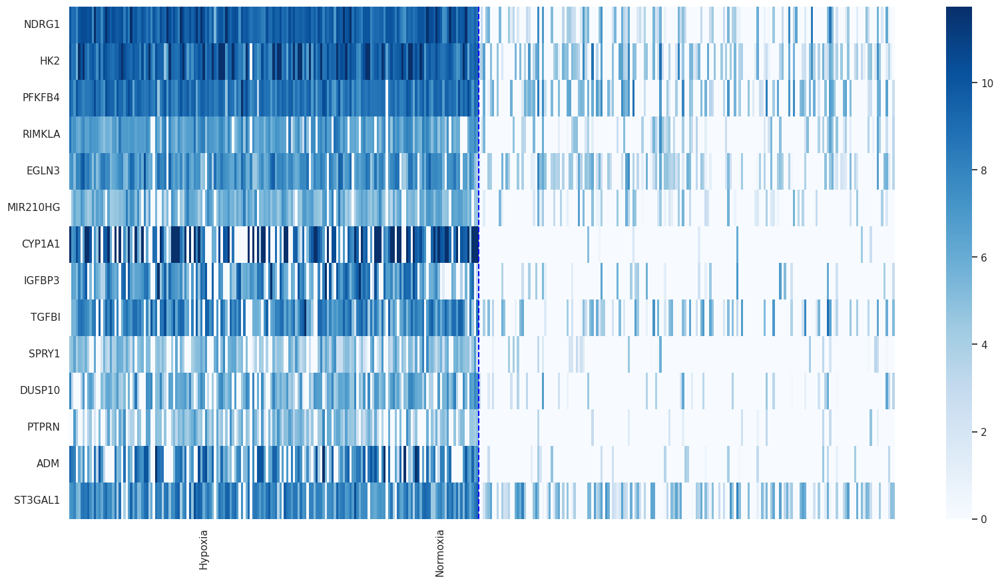

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_grouped.loc[most_correlated[1:15].index], cmap='Blues')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([df_hypo.shape[1],df_hypo.shape[1]], [0,14], color='Blue', 
              linestyle='dashed');

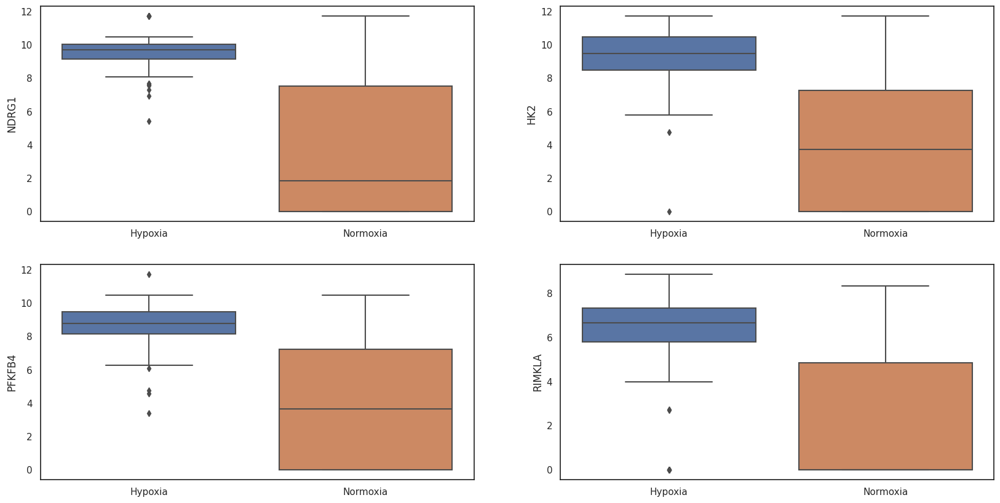

In [ ]:
fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped_corr.iloc[k,:121], df_grouped_corr.iloc[k,121:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(df_grouped_corr.index[k]) 
       k+=1

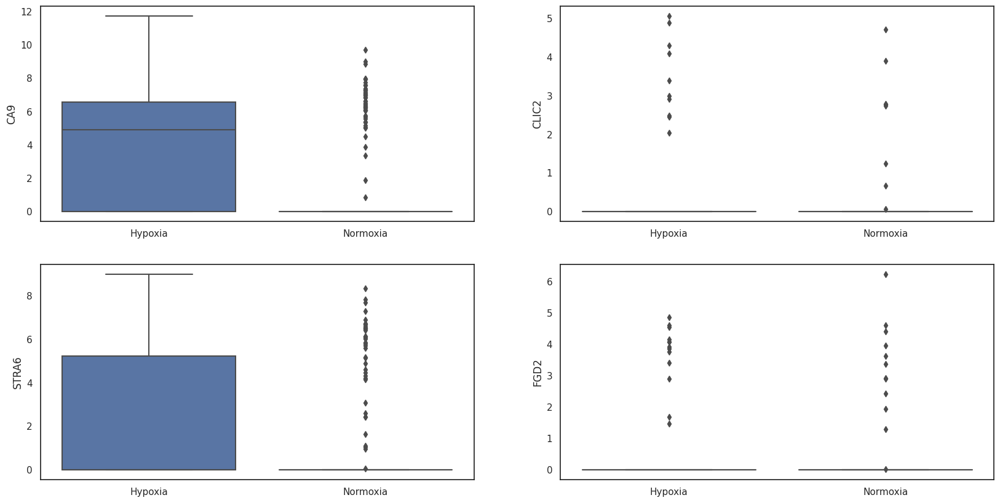

In [ ]:
## same thing but with my method
## hypo

fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped.loc[genes_hypo.index[38+k]][:116], df_grouped.loc[genes_hypo.index[38+k]][116:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(genes_hypo.index[38+k])
       k+=1 

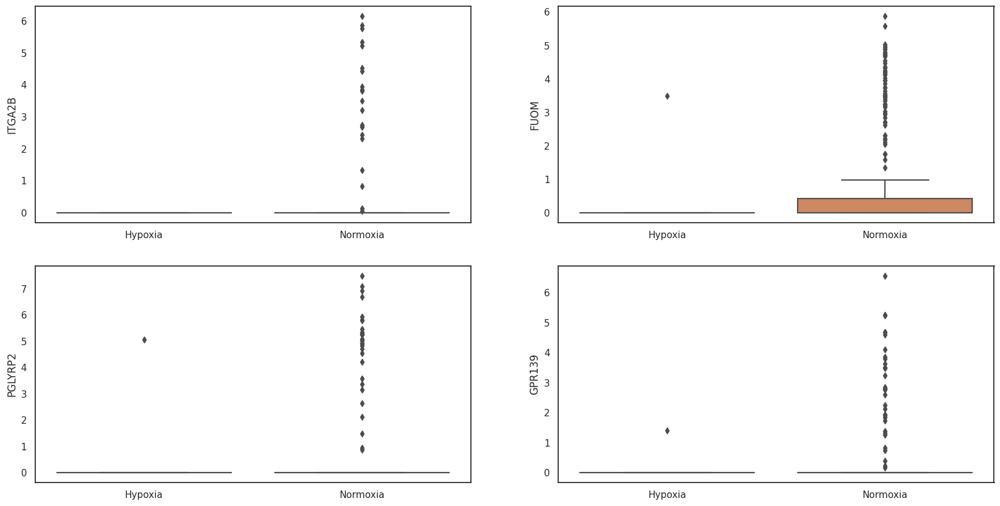

In [ ]:
## same thing but with my method
## normo

fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped.loc[genes_normo.index[45+k]][:116], df_grouped.loc[genes_normo.index[45+k]][116:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(genes_normo.index[45+k])
       k+=1

## Another viewpoint - Grouping genes by name

In [ ]:
def check(start):
    return pd.Series((x.startswith(start) for x in df.index), index=pd.Series(df.index))

gene_types=set()
for x in df.index:
    ind = next((i for i, c in enumerate(x) if (c.isdigit() or c=='-')), len(x))
    gene_types.add(x[0:ind])

df_gene_types=pd.DataFrame(columns=df.columns)
for s in gene_types:
    df_gene_types.loc[s]=df.loc[check(s)].sum()
df_gene_types

,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,...,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
FSTL,0.000000,6.608323,0.000000,4.823498,0.000000,2.631963,0.000000,5.260609,0.00000,0.000000,...,0.0,0.000000,0.000000,6.183367,6.218930,0.000000,0.000000,4.542004,0.000000,6.355140
NFASC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SYN,12.237829,11.486846,8.030564,17.852125,5.015847,2.501857,7.200009,16.326502,0.00000,14.498937,...,0.0,0.000000,3.642524,0.000000,5.813982,11.200433,13.132848,14.622357,5.020116,9.414565
PROCA,2.450420,0.000000,2.724860,0.000000,0.000000,0.527166,2.482601,0.000000,0.00000,0.000000,...,0.0,0.000000,2.503662,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MECOM,3.019141,0.000000,1.302029,0.000000,0.000000,0.000000,0.000000,4.213827,0.00000,0.000000,...,0.0,0.000000,5.067563,0.000000,0.491062,3.223380,5.845456,5.078250,0.000000,5.179555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IGFLR,5.240523,0.000000,5.228661,5.057866,0.000000,0.000000,0.000000,0.000000,0.00000,3.671262,...,0.0,0.000000,1.029344,0.000000,3.198193,2.953814,5.477642,4.415655,0.000000,0.000000
LNCOC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.015236,0.000000,0.000000
BHMT,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.293185
SPRR,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
condition_hypo = np.array(['Hypo' in cell for cell in df_gene_types.columns])
condition_normo = np.array(['Norm' in cell for cell in df_gene_types.columns])
df_gene_types_hypo = df_gene_types[df_gene_types.columns[condition_hypo]]
df_gene_types_normo = df_gene_types[df_gene_types.columns[condition_normo]]
display(df_gene_types_hypo,df_gene_types_normo)

,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,output.STAR.4_F7_Hypo_S283_Aligned.sortedByCoord.out.bam,output.STAR.4_A8_Hypo_S44_Aligned.sortedByCoord.out.bam,output.STAR.1_F11_Hypo_S269_Aligned.sortedByCoord.out.bam,output.STAR.3_C7_Hypo_S133_Aligned.sortedByCoord.out.bam,output.STAR.1_F7_Hypo_S265_Aligned.sortedByCoord.out.bam,...,output.STAR.3_G12_Hypo_S330_Aligned.sortedByCoord.out.bam,output.STAR.3_A7_Hypo_S37_Aligned.sortedByCoord.out.bam,output.STAR.2_G8_Hypo_S320_Aligned.sortedByCoord.out.bam,output.STAR.1_E9_Hypo_S219_Aligned.sortedByCoord.out.bam,output.STAR.2_G11_Hypo_S323_Aligned.sortedByCoord.out.bam,output.STAR.2_C7_Hypo_S127_Aligned.sortedByCoord.out.bam,output.STAR.3_F7_Hypo_S277_Aligned.sortedByCoord.out.bam,output.STAR.4_F12_Hypo_S288_Aligned.sortedByCoord.out.bam,output.STAR.4_D7_Hypo_S187_Aligned.sortedByCoord.out.bam,output.STAR.2_G12_Hypo_S324_Aligned.sortedByCoord.out.bam
FSTL,6.608323,0.000000,2.631963,0.00000,0.000000,0.000000,0.000000,0.000000,5.223909,0.000000,...,3.369744,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,6.183367,0.000000,6.355140
NFASC,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
SYN,11.486846,5.015847,2.501857,0.00000,11.181025,2.886991,3.965753,5.539626,0.000000,5.405153,...,4.183911,13.316272,17.054566,5.420554,0.0,0.000000,3.642524,0.000000,5.020116,9.414565
PROCA,0.000000,0.000000,0.527166,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.224649,0.000000,3.808484,0.0,0.000000,2.503662,0.000000,0.000000,0.000000
MECOM,0.000000,0.000000,0.000000,0.00000,0.000000,1.352433,0.000000,0.000000,4.317177,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,5.067563,0.000000,0.000000,5.179555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IGFLR,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.029344,0.000000,0.000000,0.000000
LNCOC,0.000000,0.000000,0.000000,0.00000,0.000000,1.731421,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
BHMT,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.474089,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,2.293185
SPRR,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


,output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam,output.STAR.3_A3_Norm_S15_Aligned.sortedByCoord.out.bam,output.STAR.4_F5_Norm_S263_Aligned.sortedByCoord.out.bam,output.STAR.2_G2_Norm_S296_Aligned.sortedByCoord.out.bam,output.STAR.4_F6_Norm_S264_Aligned.sortedByCoord.out.bam,output.STAR.2_H2_Norm_S344_Aligned.sortedByCoord.out.bam,output.STAR.2_D6_Norm_S156_Aligned.sortedByCoord.out.bam,output.STAR.1_H2_Norm_S338_Aligned.sortedByCoord.out.bam,output.STAR.4_C1_Norm_S115_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,...,output.STAR.3_B1_Norm_S61_Aligned.sortedByCoord.out.bam,output.STAR.1_D2_Norm_S146_Aligned.sortedByCoord.out.bam,output.STAR.2_E3_Norm_S201_Aligned.sortedByCoord.out.bam,output.STAR.2_C6_Norm_S108_Aligned.sortedByCoord.out.bam,output.STAR.3_C3_Norm_S111_Aligned.sortedByCoord.out.bam,output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam
FSTL,0.000000,0.000000,4.823498,0.000000,5.260609,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,2.917375,1.755627,0.000000,4.902140,6.218930,0.000000,0.000000,4.542004
NFASC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SYN,12.237829,8.030564,17.852125,7.200009,16.326502,14.498937,11.024842,7.166077,7.072384,5.328337,...,10.015145,0.000000,5.335092,19.221097,16.723146,6.489592,5.813982,11.200433,13.132848,14.622357
PROCA,2.450420,2.724860,0.000000,2.482601,0.000000,0.000000,0.000000,0.000000,0.000000,4.691442,...,0.413060,1.842497,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MECOM,3.019141,1.302029,0.000000,0.000000,4.213827,0.000000,2.563726,0.000000,2.421938,0.000000,...,5.805165,6.058162,0.000000,4.479592,1.058103,5.161998,0.491062,3.223380,5.845456,5.078250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IGFLR,5.240523,5.228661,5.057866,0.000000,0.000000,3.671262,5.062131,0.000000,2.880565,0.000000,...,0.000000,4.710288,5.020116,5.078250,3.254362,0.000000,3.198193,2.953814,5.477642,4.415655
LNCOC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.731421,0.000000,0.000000,0.903989,1.338434,4.632746,0.000000,0.000000,0.000000,3.015236
BHMT,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SPRR,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
plt.figure(figsize=(18,8))
c = df_gene_types.corr()
corr_hypo = pd.DataFrame(c.columns[['Hypo' in cell for cell in df_gene_types.columns]])
corr_normo = pd.DataFrame(c.columns[['Norm' in cell for cell in df_gene_types.columns]])
grouped_corr = c.loc[pd.concat([corr_hypo, corr_normo])[0], pd.concat([corr_hypo, corr_normo])[0]]
grouped_corr

,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,output.STAR.4_F7_Hypo_S283_Aligned.sortedByCoord.out.bam,output.STAR.4_A8_Hypo_S44_Aligned.sortedByCoord.out.bam,output.STAR.1_F11_Hypo_S269_Aligned.sortedByCoord.out.bam,output.STAR.3_C7_Hypo_S133_Aligned.sortedByCoord.out.bam,output.STAR.1_F7_Hypo_S265_Aligned.sortedByCoord.out.bam,...,output.STAR.3_B1_Norm_S61_Aligned.sortedByCoord.out.bam,output.STAR.1_D2_Norm_S146_Aligned.sortedByCoord.out.bam,output.STAR.2_E3_Norm_S201_Aligned.sortedByCoord.out.bam,output.STAR.2_C6_Norm_S108_Aligned.sortedByCoord.out.bam,output.STAR.3_C3_Norm_S111_Aligned.sortedByCoord.out.bam,output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam
output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,1.000000,0.949673,0.953316,0.918933,0.942576,0.960056,0.961576,0.942448,0.950282,0.945244,...,0.955560,0.940881,0.941325,0.958421,0.957966,0.952664,0.965444,0.955148,0.950464,0.957482
output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,0.949673,1.000000,0.982004,0.965352,0.956037,0.966733,0.965174,0.969271,0.971483,0.945457,...,0.977358,0.972389,0.970130,0.966201,0.961369,0.957220,0.966390,0.975273,0.973525,0.966825
output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,0.953316,0.982004,1.000000,0.968757,0.955225,0.973639,0.964935,0.968879,0.970640,0.959047,...,0.974853,0.976729,0.978703,0.972004,0.972960,0.972951,0.975740,0.979042,0.977022,0.975952
output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,0.918933,0.965352,0.968757,1.000000,0.946670,0.952662,0.940319,0.965660,0.965688,0.936115,...,0.954135,0.955473,0.966728,0.957069,0.957186,0.949704,0.948329,0.953208,0.961245,0.958084
output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,0.942576,0.956037,0.955225,0.946670,1.000000,0.960188,0.954965,0.960046,0.963797,0.934585,...,0.943490,0.936426,0.954103,0.957085,0.956429,0.940904,0.951817,0.955847,0.959550,0.951197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,0.952664,0.957220,0.972951,0.949704,0.940904,0.971100,0.960371,0.958954,0.957965,0.953453,...,0.967610,0.964087,0.969314,0.977894,0.978582,1.000000,0.983342,0.972549,0.968967,0.981655
output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,0.965444,0.966390,0.975740,0.948329,0.951817,0.979106,0.972627,0.966924,0.967204,0.964915,...,0.971976,0.968827,0.972119,0.982292,0.981909,0.983342,1.000000,0.975181,0.975102,0.985804
output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,0.955148,0.975273,0.979042,0.953208,0.955847,0.970408,0.956639,0.962404,0.963650,0.950428,...,0.985669,0.981617,0.982735,0.979915,0.974081,0.972549,0.975181,1.000000,0.987392,0.978208
output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,0.950464,0.973525,0.977022,0.961245,0.959550,0.974295,0.958551,0.967791,0.968228,0.955725,...,0.980799,0.979341,0.986062,0.982507,0.978126,0.968967,0.975102,0.987392,1.000000,0.981089


<Figure size 1800x800 with 0 Axes>

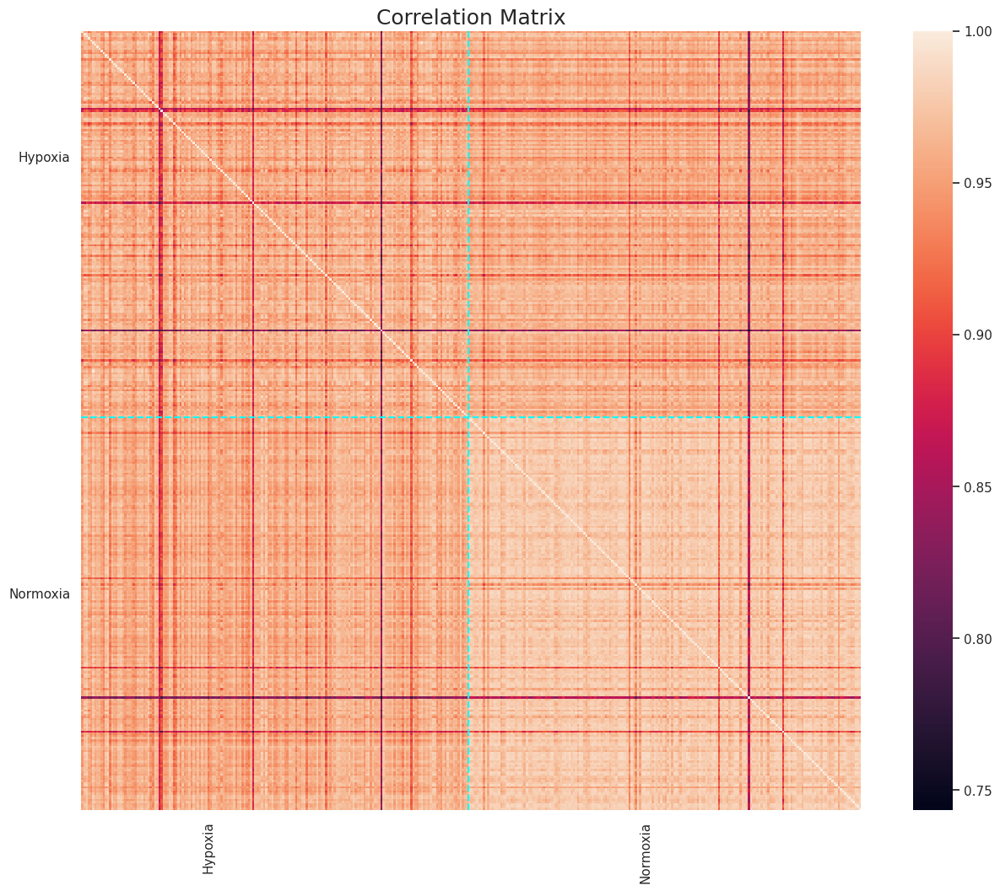

In [ ]:
f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(grouped_corr, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([59.5, 264], ["Hypoxia", "Normoxia"])
plt.plot([0,df_gene_types.shape[1]], [df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], color='cyan', 
              linestyle='dashed')
plt.plot([df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], [0,df_gene_types.shape[1]], color='cyan', 
              linestyle='dashed')
plt.xticks([59.5, 264], ["Hypoxia", "Normoxia"])
plt.title("Correlation Matrix", fontsize=18);

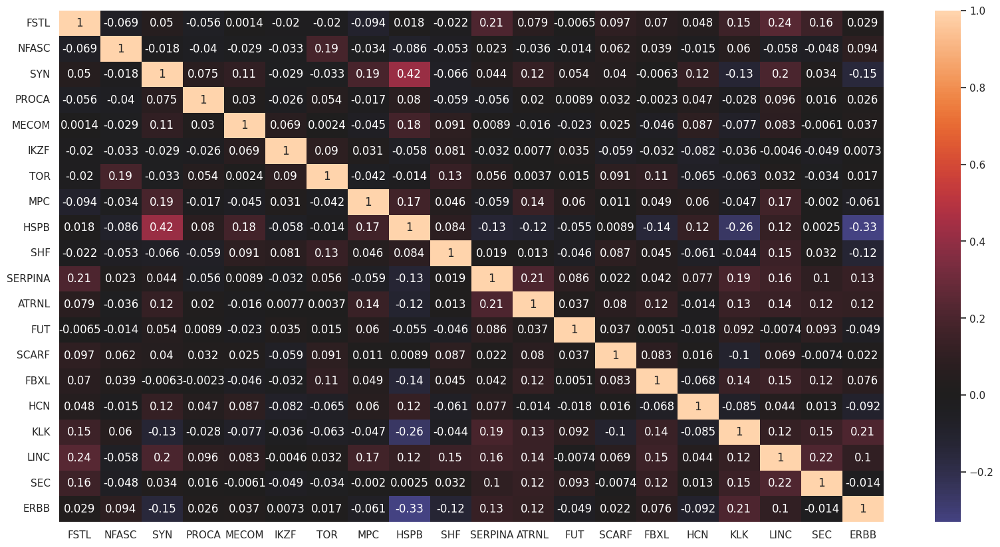

In [ ]:
plt.figure(figsize=(20,10))
c = df_gene_types.transpose().iloc[:,:20].corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c, center=0, annot=True);

In [ ]:
cond = pd.DataFrame(['Hypo' in cell for cell in df_gene_types.columns])
cond.index = df_gene_types.columns
cond.columns = ['Hypo_condition']
data_cond = pd.concat([df_gene_types.transpose(), cond], axis = 1)
corr_genes = data_cond.corr()

In [ ]:
most_correlated = pd.Series.sort_values((corr_genes["Hypo_condition"]), ascending=False)
most_correlated

Hypo_condition    1.000000
HK                0.856557
RIMKLA            0.772246
PFKFB             0.719125
PGM               0.719064
                    ...   
MC               -0.728967
ASF              -0.735517
PYCR             -0.742046
ELOVL            -0.784290
RAMP             -0.794753
Name: Hypo_condition, Length: 2049, dtype: float64

In [ ]:
df_grouped = pd.concat([df_gene_types_hypo, df_gene_types_normo], axis = 1)
df_grouped_corr = df_grouped.loc[most_correlated[1:15].index]
df_grouped_corr

,output.STAR.4_D9_Hypo_S189_Aligned.sortedByCoord.out.bam,output.STAR.3_E9_Hypo_S231_Aligned.sortedByCoord.out.bam,output.STAR.2_D10_Hypo_S178_Aligned.sortedByCoord.out.bam,output.STAR.1_F12_Hypo_S270_Aligned.sortedByCoord.out.bam,output.STAR.3_D9_Hypo_S183_Aligned.sortedByCoord.out.bam,output.STAR.4_F7_Hypo_S283_Aligned.sortedByCoord.out.bam,output.STAR.4_A8_Hypo_S44_Aligned.sortedByCoord.out.bam,output.STAR.1_F11_Hypo_S269_Aligned.sortedByCoord.out.bam,output.STAR.3_C7_Hypo_S133_Aligned.sortedByCoord.out.bam,output.STAR.1_F7_Hypo_S265_Aligned.sortedByCoord.out.bam,...,output.STAR.3_B1_Norm_S61_Aligned.sortedByCoord.out.bam,output.STAR.1_D2_Norm_S146_Aligned.sortedByCoord.out.bam,output.STAR.2_E3_Norm_S201_Aligned.sortedByCoord.out.bam,output.STAR.2_C6_Norm_S108_Aligned.sortedByCoord.out.bam,output.STAR.3_C3_Norm_S111_Aligned.sortedByCoord.out.bam,output.STAR.2_G5_Norm_S299_Aligned.sortedByCoord.out.bam,output.STAR.3_H1_Norm_S349_Aligned.sortedByCoord.out.bam,output.STAR.3_C1_Norm_S109_Aligned.sortedByCoord.out.bam,output.STAR.1_H6_Norm_S342_Aligned.sortedByCoord.out.bam,output.STAR.2_D1_Norm_S151_Aligned.sortedByCoord.out.bam
HK,10.498683,8.497923,8.770901,5.777402,11.752270,10.059115,11.752270,9.144365,8.035428,9.501406,...,0.000000,1.842497,7.355912,4.682235,0.000000,0.000000,1.430762,3.611722,0.736175,0.000000
RIMKLA,8.770901,6.963157,7.253767,6.192421,5.865458,7.059822,7.847465,6.451550,6.420785,7.330917,...,0.874110,0.000000,6.420785,4.108696,0.000000,0.000000,2.745635,0.000000,0.000000,3.284693
PFKFB,9.501406,11.310060,8.617466,10.059115,9.001836,12.191209,11.228704,8.497923,8.412248,13.235188,...,4.886189,0.000000,8.819941,8.172565,2.880565,0.665667,9.879946,0.000000,0.000000,3.538368
PGM,12.461639,11.682200,9.496063,8.497923,15.300339,10.036452,4.975836,12.197333,12.931261,14.191707,...,9.196039,3.432959,5.777402,3.692207,5.798860,1.314796,7.882229,7.186264,0.000000,2.471954
EGLN,11.509105,7.355912,7.480145,7.983040,7.725196,9.501406,10.059115,7.983040,8.579486,7.330917,...,0.413060,0.000000,6.594892,0.000000,0.000000,5.203029,6.858475,1.575710,0.000000,3.597760
IGFBP,5.744530,11.913783,10.208215,16.814401,8.269223,15.228011,17.272513,9.718690,7.621004,10.810306,...,0.731421,2.745635,0.000000,6.435453,9.227838,8.814541,0.327451,3.742295,1.749167,2.874110
TGFBI,0.000000,5.605403,5.506882,6.485559,8.579486,8.875011,8.412248,7.847465,7.330917,5.922485,...,0.000000,0.000000,6.304631,0.000000,0.000000,0.000000,5.951133,0.000000,0.000000,5.187820
LOX,4.986349,7.870005,6.033936,9.501406,7.101634,9.569525,0.000000,13.718920,6.706886,7.554778,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.924959,0.000000,0.000000,5.145082
MACC,4.947551,5.672968,3.874379,0.000000,6.264732,1.731421,5.389020,4.135031,4.476399,5.405153,...,0.000000,0.000000,0.000000,1.384580,0.000000,0.000000,0.695262,0.000000,1.749167,0.000000
ADM,9.323514,8.412248,11.458268,0.000000,10.838784,7.948592,7.619582,0.000000,6.649340,4.558033,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.223380,0.000000,0.000000


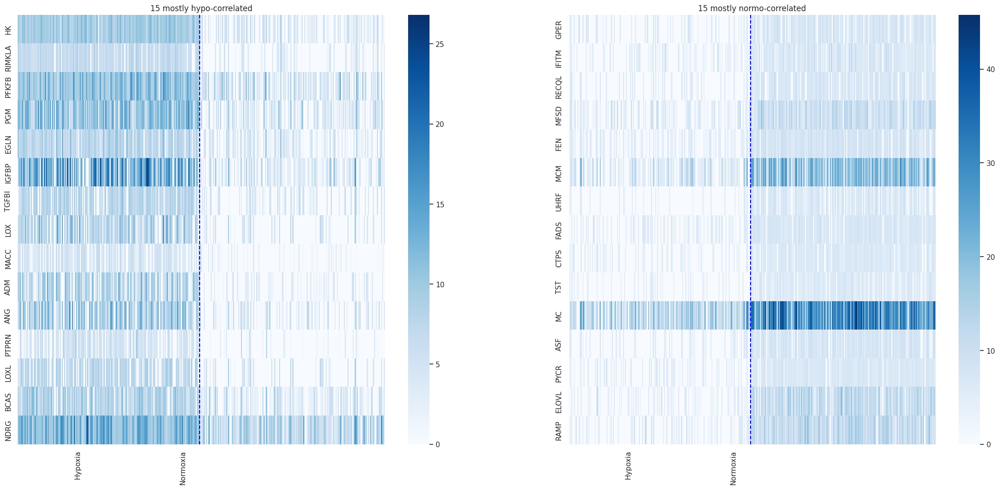

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(28,12))
#plt.figure(figsize=(20,10))
sns.heatmap(df_grouped.loc[most_correlated[1:16].index], cmap='Blues',ax=ax[0])
sns.heatmap(df_grouped.loc[most_correlated[-15:].index], cmap='Blues',ax=ax[1])
ax[0].set_xticks([59.5, 164], ["Hypoxia", "Normoxia"])
ax[1].set_xticks([59.5, 164], ["Hypoxia", "Normoxia"])
ax[0].plot([df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], [0,15], color='Blue', 
              linestyle='dashed')
ax[1].plot([df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], [0,15], color='Blue', 
              linestyle='dashed')
ax[0].set_title('15 mostly hypo-correlated')
ax[1].set_title('15 mostly normo-correlated');

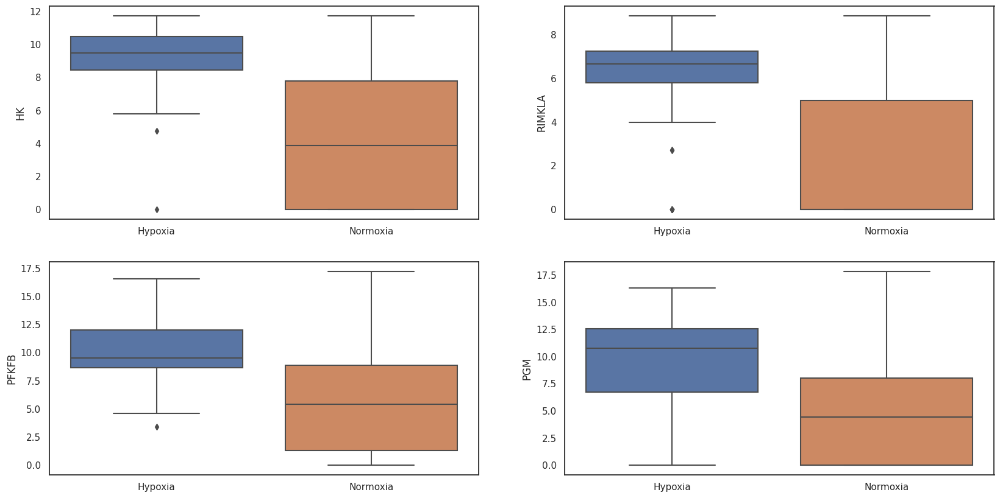

In [ ]:
fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped_corr.iloc[k,:116], df_grouped_corr.iloc[k,116:]], ax = ax[i][j]) #116 is the shape (numb of hypoxic cells), so change it when changing the dataframe
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(df_grouped_corr.index[k]) 
       k+=1

# Unsupervised Learning

In this section we will adopt unsupervised learning methods to further explore our data and find underlying patterns. 

### PCA

PCA (Principal Component Analysis) is a statistical procedure that uses orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables known as principal components. The number of principal components is less than or equal to the number of original variables. 

We begin by rescaling our data in order to evaluate features on similar scales.

In [ ]:
from sklearn.preprocessing import StandardScaler
x = StandardScaler(with_mean=False).fit_transform(df_mcf_smart_train.T.apply(lambda x: np.log2(1+x)))

We apply PCA on our dataset.

Text(0, 0.5, 'Variance explained')

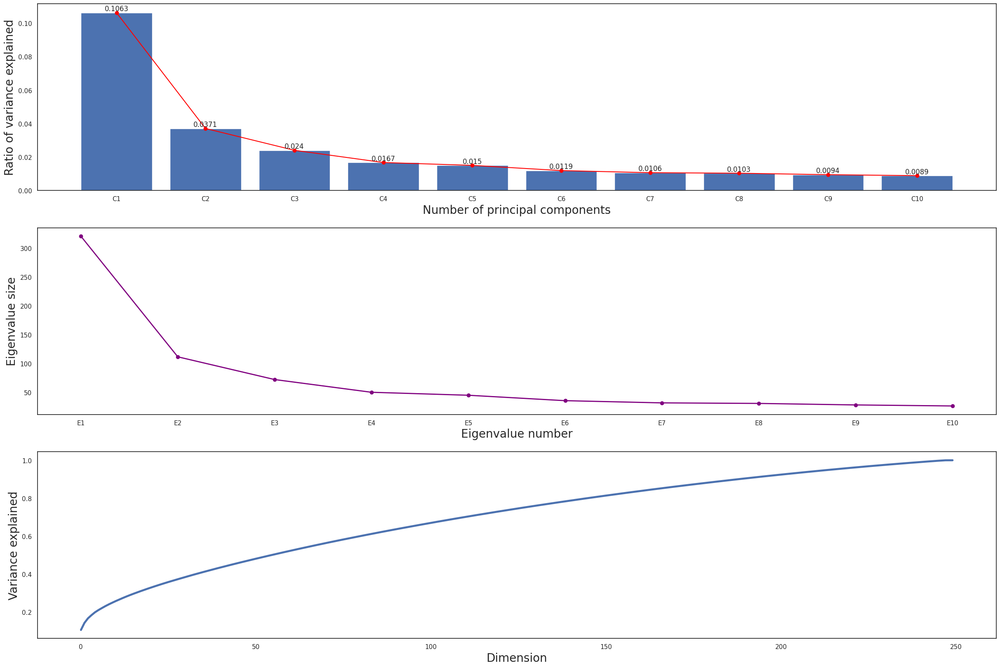

In [ ]:
from sklearn.decomposition import PCA

pca = PCA()
reduced = pca.fit_transform(x)
var_ratio = pca.explained_variance_ratio_
var_ratio_first = pca.explained_variance_ratio_[0:10]
lab0 = [f"C{i+1}" for i in range(10)]
fig,ax= plt.subplots(3,1,figsize=(30,20))

ax[0].bar(lab0,var_ratio_first)
rects = ax[0].patches
labels = var_ratio_first.round(4) 
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax[0].text(rect.get_x() + rect.get_width() / 2, height+0.0001, label,
            ha='center', va='bottom')
ax[0].plot([(rect.get_x() + rect.get_width() / 2) for rect in rects],var_ratio_first, color='Red', marker='o')
ax[0].set_xlabel('Number of principal components',fontsize=20)
ax[0].set_ylabel('Ratio of variance explained',fontsize=20)

lab1 = [f"E{i+1}" for i in range(10)]
ax[1].plot(lab1,pca.explained_variance_[0:10], marker='o',linewidth = 2,color='Purple')
ax[1].set_xlabel("Eigenvalue number",fontsize=20)
ax[1].set_ylabel("Eigenvalue size",fontsize=20)

cumulative = np.cumsum(var_ratio)
ax[2].plot(cumulative, linewidth = 3.5)
ax[2].set_xlabel('Dimension',fontsize=20)
ax[2].set_ylabel('Variance explained',fontsize=20)

We see that the first few components represent most of the variance of our dataset.

In [ ]:
pca = PCA(n_components=0.95)
red = pca.fit_transform(x)
red.shape

(250, 215)

Let's check the reconstruction mean square error of our PCA.

In [ ]:
from sklearn.metrics import mean_squared_error as mse
mse(pca.inverse_transform(red), x)

0.04988596732616943

In [ ]:
df_pca = pd.DataFrame(red, index=df_mcf_smart_train.columns, columns=[f'C{i+1}'for i in range(red.shape[1])])
df_pca

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C206,C207,C208,C209,C210,C211,C212,C213,C214,C215
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,-15.710434,16.179073,-2.263915,7.774555,-5.534131,-3.536737,0.170578,2.168164,-1.950439,0.836618,...,-0.643586,-2.984677,1.810721,-4.669063,2.502357,-0.348485,-0.763315,-2.882541,1.387289,-0.207850
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,-18.983359,-5.473194,7.203289,-0.089489,6.589804,-7.108833,-3.529300,2.144825,-3.148470,-0.083229,...,-2.913559,-0.616099,0.382135,0.208147,4.439216,2.192125,-4.609924,2.078082,-6.630333,-3.648201
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,-21.586720,6.120333,6.762018,6.174048,-1.515609,3.874230,2.204022,0.497137,-3.317775,-0.102960,...,3.468686,-4.147656,-0.644520,-2.453051,1.355747,2.914893,-0.437784,-1.290140,2.502462,-6.260681
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,-17.452256,-7.039992,6.295200,-5.119553,5.665692,-5.201047,-2.061717,-0.184849,4.389004,0.203124,...,6.103490,5.389288,1.435329,2.089046,6.716430,-0.713273,-4.268438,3.504273,-4.580596,-3.165122
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,10.021237,-10.142292,-3.607099,0.971443,0.155845,-4.404010,2.533807,2.276717,-9.768236,-1.960110,...,-3.343895,0.935558,-1.707635,1.216034,-0.334017,-1.174543,-0.595598,1.786563,-2.794170,0.830165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,-12.389450,13.130980,-11.502812,-3.322754,-11.130915,-4.170237,-0.067579,-2.716094,-0.934773,3.010714,...,2.241371,-2.475669,1.621110,-0.787880,0.354521,2.351066,-0.019653,0.119624,-0.754107,-0.031542
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,-5.385930,0.403705,-6.632844,19.545385,6.544120,0.562801,-0.287973,3.635208,-1.717454,0.778348,...,0.856416,0.569235,1.179001,1.473204,-0.943682,0.024896,-3.034407,0.662864,1.443625,-0.719632
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,22.759930,17.672995,-0.867634,-6.817852,-1.602483,-5.648065,0.353619,-2.580238,9.271918,-9.249382,...,-2.565160,-2.398034,3.026567,-3.723884,-0.905971,-2.863125,0.172377,0.387128,-0.315764,0.446981
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,19.452730,-1.769954,5.205248,3.857214,-6.730030,1.235064,-1.069662,0.940838,-0.298645,-3.648170,...,-4.141187,0.108781,-2.562324,-1.050681,0.967301,-0.941940,1.392552,-4.140058,-6.611750,-0.230135


We split our genes into hypoxic and normoxic.

In [ ]:
condition_hypo = np.array(['Hypo' in cell for cell in df_mcf_smart_train.columns])
condition_normo = np.array(['Norm' in cell for cell in df_mcf_smart_train.columns])

We want to visually check the separation of our data classes in the first two components of the PCA.

Text(0, 0.5, 'PC2')

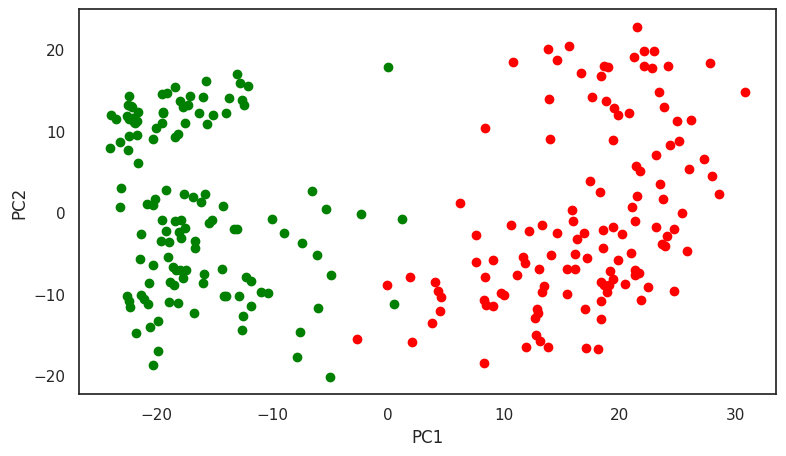

In [ ]:
#scatter for the first 2 components

hypo2 = df_pca[condition_hypo].iloc[:,:2]
normo2 = df_pca[condition_normo].iloc[:,:2]

fig,ax = plt.subplots(figsize=(9,5))
ax.scatter(hypo2.iloc[:, 0], hypo2.iloc[:, 1], color='red')
ax.scatter(normo2.iloc[:, 0], normo2.iloc[:, 1], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

Repeat the graph, but in the three main components.

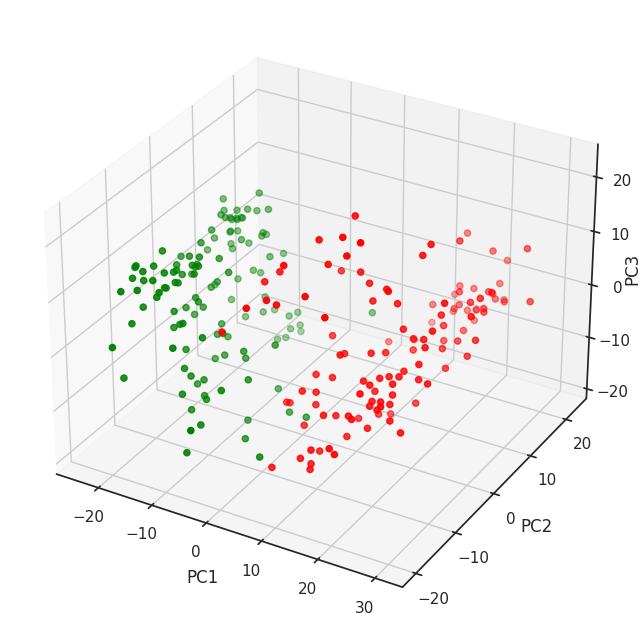

In [ ]:
#scatter of the first 3 components

hypo3 = df_pca[condition_hypo].iloc[:,:3]
normo3 = df_pca[condition_normo].iloc[:,:3]

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(hypo3.iloc[:, 0], hypo3.iloc[:, 1], hypo3.iloc[:, 2], color='red')
ax.scatter(normo3.iloc[:, 0], normo3.iloc[:, 1], normo3.iloc[:, 2], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3',rotation=90)
ax.zaxis.labelpad=-3

### Other forms of dimensionality reduction

#### t-SNE

The first one we decided to try is t-SNE. In simple terms, PCA works on retaining only global variance, and thus retaining local variance was the motivation behind t-SNE.
t-SNE is a nonlinear dimensionality reduction technique that is well suited for embedding high dimension data into lower dimensional data (2D or 3D) for data visualization.

STEPS: 

1. t-SNE constructs a probability distribution on pairs in higher dimensions such that similar objects are assigned a higher probability and dissimilar objects are assigned lower probability.

2. Then, t-SNE replicates the same probability distribution on lower dimensions iteratively till the Kullback-Leibler divergence is minimized.

In [ ]:
# t-SNE 2 components

from sklearn.manifold import TSNE
pca = PCA(n_components=2)
red = pca.fit_transform(x)
def tsne_pca_rs(c,r):
    tsne = TSNE(n_components=c, init='random', random_state = r)
    red_tsne = tsne.fit_transform(red)
    df_tsne = pd.DataFrame(red_tsne, index=df_mcf_smart_train.columns, columns=[f'T{i+1}'for i in range(c)])
    return df_tsne

Since our dataset, as we could see during PCA, is not regularly separable, our results change a lot based on which random state we give to the function. So, we decided to iteratively compute a score (which we defined as the silhouette score when trying to group the point found by t-SNE in two clusters with KMeans algorithm) on different random states, and then find the best random state, i.e. the one that maximizes that score.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# computing the best random state to initialize tsne

silhouette_scores = []
for i in range(20,50):
    df_tsne = tsne_pca_rs(2,i)
    k_kmeans = KMeans(n_clusters=2, n_init=100, random_state=42).fit(df_tsne)
    silhouette_scores.append(silhouette_score(x, k_kmeans.labels_))
    best_ind_2 = silhouette_scores.index(max(silhouette_scores))
print(max(silhouette_scores), "Random state:", best_ind_2)

0.08991260899731238 Random state: 0


Text(0, 0.5, 't-SNE2')

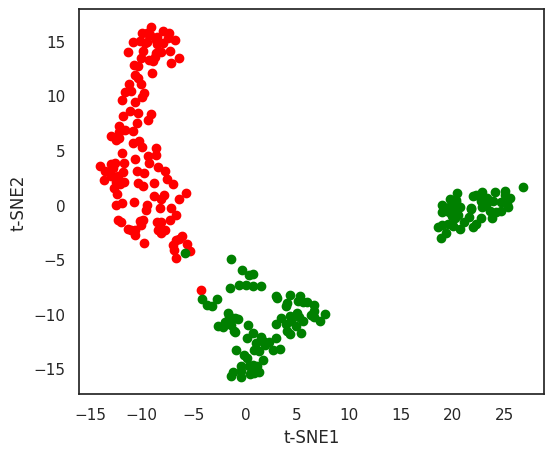

In [ ]:
fig,ax = plt.subplots(figsize=(6,5))

#plotting tsne with the best random state found

df_tsne = tsne_pca_rs(2,20+best_ind_2)
hypo2 = df_tsne[condition_hypo].iloc[:,:2]
normo2 = df_tsne[condition_normo].iloc[:,:2]
ax.scatter(hypo2.iloc[:, 0], hypo2.iloc[:, 1], color='red')
ax.scatter(normo2.iloc[:, 0], normo2.iloc[:, 1], color='green')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')

In [ ]:
#same in 3 dimensions

silhouette_scores = []
for i in range(20,50):
    df_tsne = tsne_pca_rs(3,i)
    k_kmeans = KMeans(n_clusters=2, n_init=100, random_state=42).fit(df_tsne)
    silhouette_scores.append(silhouette_score(x, k_kmeans.labels_))
    best_ind_3 = silhouette_scores.index(max(silhouette_scores))
print(max(silhouette_scores), "Random state:", best_ind_3)


0.09011946163291483 Random state: 2


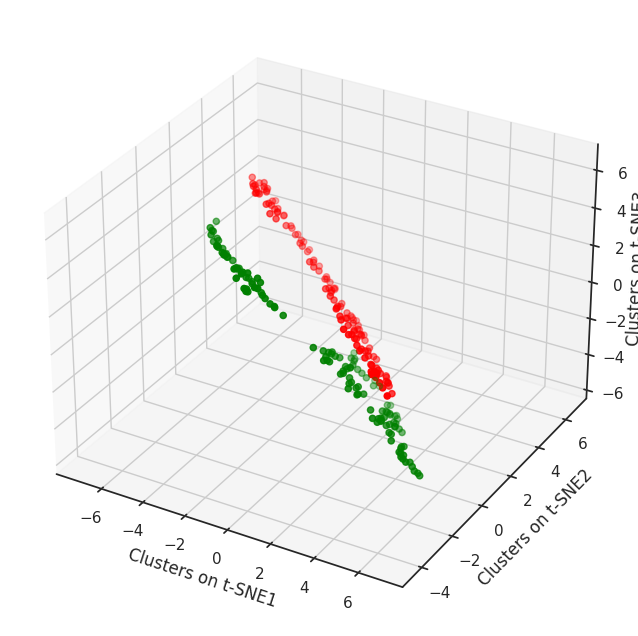

In [ ]:
silhouette_scores = []
df_tsne = tsne_pca_rs(3,20+best_ind_3)
k_kmeans = KMeans(n_clusters=2, n_init=100, random_state=42)
k_kmeans_fitted = k_kmeans.fit(df_tsne)
silhouette_scores.append(silhouette_score(x, k_kmeans_fitted.labels_))

fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,1,1,projection='3d')
ax.scatter(df_tsne[k_kmeans.fit_predict(df_tsne)==0].iloc[:, 0], df_tsne[k_kmeans.fit_predict(df_tsne)==0].iloc[:, 1], df_tsne[k_kmeans.fit_predict(df_tsne)==0].iloc[:, 2], color='red')
ax.scatter(df_tsne[k_kmeans.fit_predict(df_tsne)==1].iloc[:, 0], df_tsne[k_kmeans.fit_predict(df_tsne)==1].iloc[:, 1], df_tsne[k_kmeans.fit_predict(df_tsne)==1].iloc[:, 2], color='green')
ax.set_xlabel('Clusters on t-SNE1')
ax.set_ylabel('Clusters on t-SNE2')
ax.set_zlabel('Clusters on t-SNE3',rotation=90)
ax.zaxis.labelpad=-0.7

####UMAP

As a last method we tried UMAP. UMAP, at its core, works very similarly to t-SNE - both use graph layout algorithms to arrange data in low-dimensional space. In the simplest sense, UMAP constructs a high dimensional graph representation of the data then optimizes a low-dimensional graph to be as structurally similar as possible.

In [ ]:
#umap dimensionality reduction
import umap.umap_ as umap

um = umap.UMAP(n_components = 2)
red_um = um.fit_transform(x)

In [ ]:
df_umap = pd.DataFrame(red_um, index=df_mcf_smart_train.columns, columns=[f'C{i+1}'for i in range(red_um.shape[1])])
df_umap

,C1,C2
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,9.918871,-0.888446
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,10.082991,1.585268
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,9.200510,0.290979
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,10.610578,1.709627
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,-0.325141,7.554082
...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,10.271327,-0.684029
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,9.131677,0.809270
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,-1.356525,10.819200
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,0.275953,8.595159


Text(0, 0.5, 'Umap-C2')

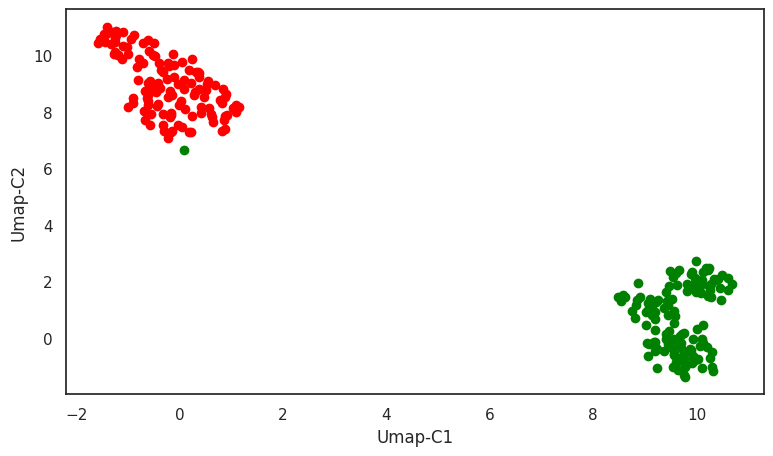

In [ ]:
hypo_um = df_umap[condition_hypo].iloc[:,:2]
normo_um = df_umap[condition_normo].iloc[:,:2]

fig,ax = plt.subplots(figsize=(9,5))
ax.scatter(hypo_um.iloc[:, 0], hypo_um.iloc[:, 1], color='red')
ax.scatter(normo_um.iloc[:, 0], normo_um.iloc[:, 1], color='green')
ax.set_xlabel('Umap-C1')
ax.set_ylabel('Umap-C2')

In [ ]:
# umap 3 components

um = umap.UMAP(n_components = 3)
red_um = um.fit_transform(x)

In [ ]:
df_umap = pd.DataFrame(red_um, index=df_mcf_smart_train.columns, columns=[f'C{i+1}'for i in range(red_um.shape[1])])
df_umap

,C1,C2,C3
output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam,15.681368,6.077061,8.296384
output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam,13.541980,5.257627,7.363635
output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam,14.790542,6.321147,7.556730
output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam,13.300100,5.138447,7.488436
output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam,1.854835,12.084463,3.339305
...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,15.372872,5.389337,8.158098
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,14.368980,6.620132,7.254992
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,1.188241,10.182283,0.781214
output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,1.666274,11.876131,2.309743


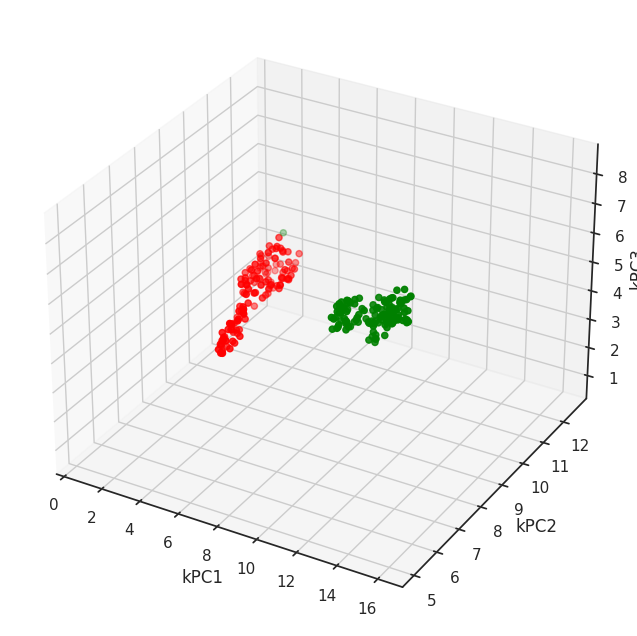

In [ ]:
hypo_um = df_umap[condition_hypo].iloc[:,:3]
normo_um = df_umap[condition_normo].iloc[:,:3]

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(hypo_um.iloc[:, 0], hypo_um.iloc[:, 1], hypo_um.iloc[:, 2], color='red')
ax.scatter(normo_um.iloc[:, 0], normo_um.iloc[:, 1], normo_um.iloc[:, 2], color='green')
ax.set_xlabel('kPC1')
ax.set_ylabel('kPC2')
ax.set_zlabel('kPC3',rotation=90)
ax.zaxis.labelpad=-0.7

### Agglomerative clustering

Now we try agglomerative clustering to better visualize the data. We plot the cells profiles across genes using the log-transformed and PCA-reduced train data which is better for identifying important patterns. First, we visualize the results using dendograms (ward, complete, average, and single linkage methods).

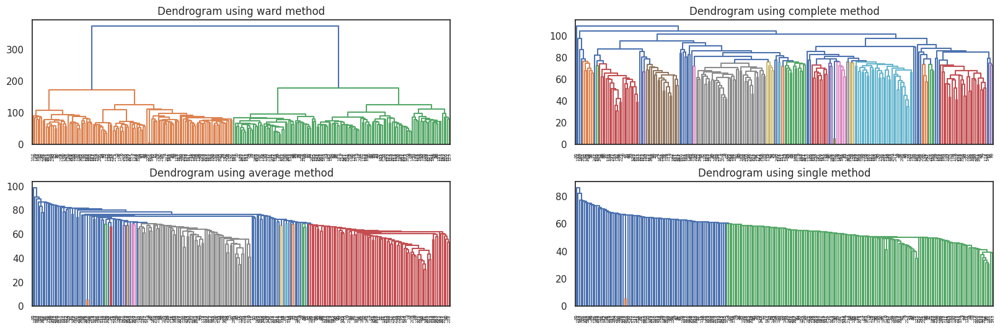

In [ ]:

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc

sys.setrecursionlimit(10000)

fig, ax = plt.subplots( 2, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

models = ["ward","complete","average","single"]

for i, model in enumerate(models):
    row = i // 2
    col = i % 2
    ax[row][col].set_title(f"Dendrogram using {model} method")
    clusters = shc.linkage(df_pca, method=model, metric="euclidean")
    shc.dendrogram(Z=clusters, ax=ax[row][col])


The single and average linkage clustering don't show any clear clusters, they just merged the cells together one by one. Instead, complete and ward linkage found some visible clusters. Especially those found by ward seem particularly clean.                                                                      Single and average linkage methods are more sensitive to noise and outliers which could lead to a chaining effect. Moreover, these methods can struggle with clusters of different shapes (non-convex) and densities, while complete and ward linkage methods are better suited for handling such cases. 

The number of clusters can be roughly deduced from the first dendogram plotted above but we want to precisely determine the optimal number of clusters for a given dataset in order to achieve the best clustering results. To do so we use the elbow method and silhouette method.

The elbow method involves plotting the explained variation (within-cluster sum of squares) as a function of the number of clusters. As the number of clusters increases, the explained variation typically decreases. The optimal number of clusters is chosen at the point where the rate of decrease sharply rises. The idea is to find a balance between minimizing the within-cluster sum of squares and not overfitting the data with too many clusters.

The within cluster sum of squares for 1 clusters is 712585.52
The within cluster sum of squares for 2 clusters is 640922.53
The within cluster sum of squares for 3 clusters is 624684.76
The within cluster sum of squares for 4 clusters is 616764.02
The within cluster sum of squares for 5 clusters is 601032.35
The within cluster sum of squares for 6 clusters is 598172.14
The within cluster sum of squares for 7 clusters is 588745.91
The within cluster sum of squares for 8 clusters is 584426.47
The within cluster sum of squares for 9 clusters is 582981.67
The within cluster sum of squares for 10 clusters is 583655.42


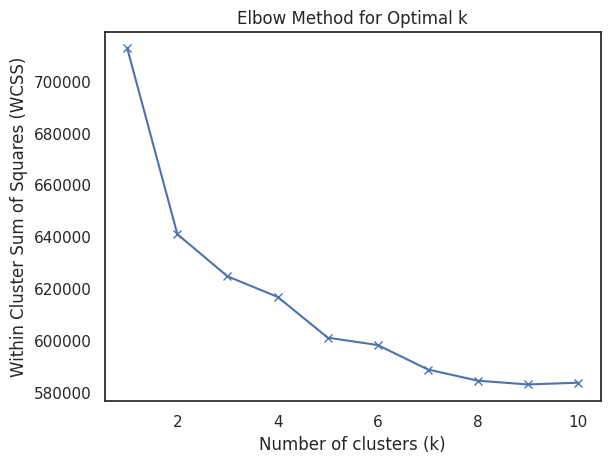

In [ ]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture

wcss = {} 
for i in range(1,11):
  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10 ).fit(df_pca)
  #Sum of squared distances of samples to their closest cluster center.
  wcss[i] = (kmeans.inertia_)
  print(f'The within cluster sum of squares for {i} clusters is {wcss[i]:.2f}')

plt.plot(list(wcss.keys()), list(wcss.values()), 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal k')
plt.show()

From the visualization, we can see that the biggest decrease in within cluster sum of squares happens at 2 clusters, and there is a relatively large decrease from 2 to 3 clusters. 

As described before, the silhouette method is a technique used in cluster analysis to assess the quality of clustering results, specifically how well the data points within a cluster are grouped and separated from other clusters. It is a measure of cohesion and separation that provides a single score, the silhouette coefficient, to evaluate the clustering performance. A high positive silhouette score indicates that the data point is well-matched to its own cluster and poorly matched to neighboring clusters, suggesting a good clustering. 


The silhouette score for 2 clusters is 0.096
The silhouette score for 3 clusters is 0.076
The silhouette score for 4 clusters is 0.029
The silhouette score for 5 clusters is 0.032
The silhouette score for 6 clusters is 0.017
The silhouette score for 7 clusters is 0.015
The silhouette score for 8 clusters is 0.025
The silhouette score for 9 clusters is 0.020
The silhouette score for 10 clusters is 0.006


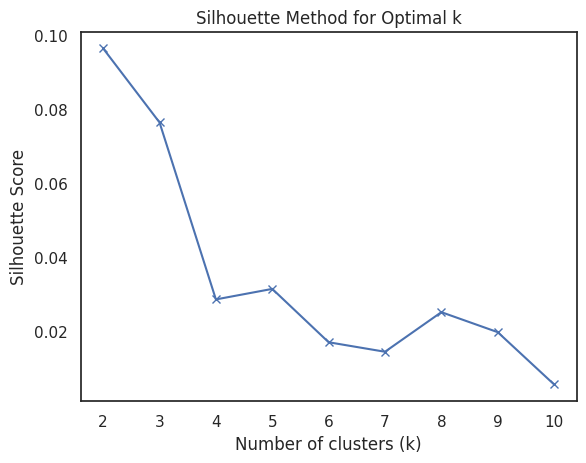

In [ ]:
s_score = {} 

for i in range(2, 11):
    # Fit kmeans clustering model for each cluster number
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10).fit(df_pca)

    classes = kmeans.predict(df_pca)
    # Calculate Silhouette score
    s_score[i] = (silhouette_score(df_pca, classes)) 
    print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}')

plt.plot(list(s_score.keys()), list(s_score.values()), 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal k')
plt.show()


From the visualization, we can see that the model with 2 clusters has the highest value of Silhouette score, and the model with 3 clusters has the 2nd highest value, so we get the consistent result that there are 2 or 3 clusters.

Next, using the optimal number of clusters found before, we show the clusters using agglomerative clustering, k means and spectral clustering both in 2D and 3D.

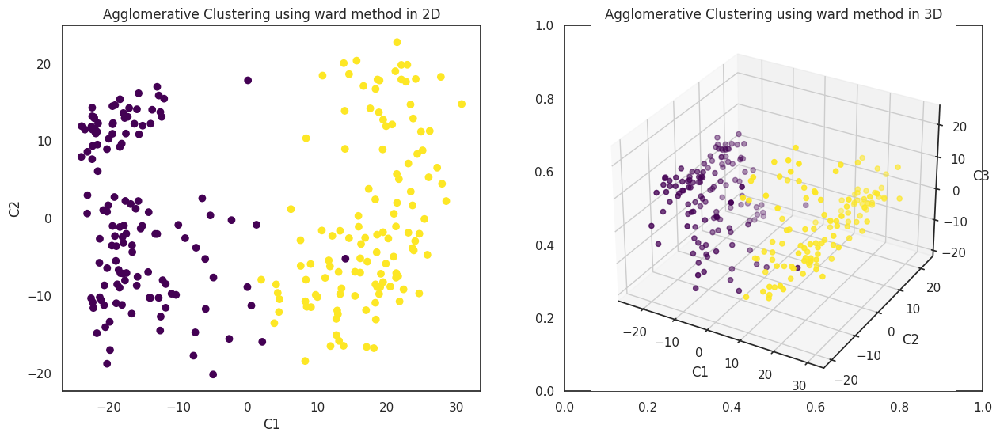

In [ ]:

from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters 
n_clusters = 2

# Choose the linkage method based on the dendrogram
linkage_method = "ward"

# Initialize and fit the Agglomerative Clustering model
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(df_pca)

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title(f'Agglomerative Clustering using {linkage_method} method in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title(f'Agglomerative Clustering using {linkage_method} method in 3D')

plt.show()


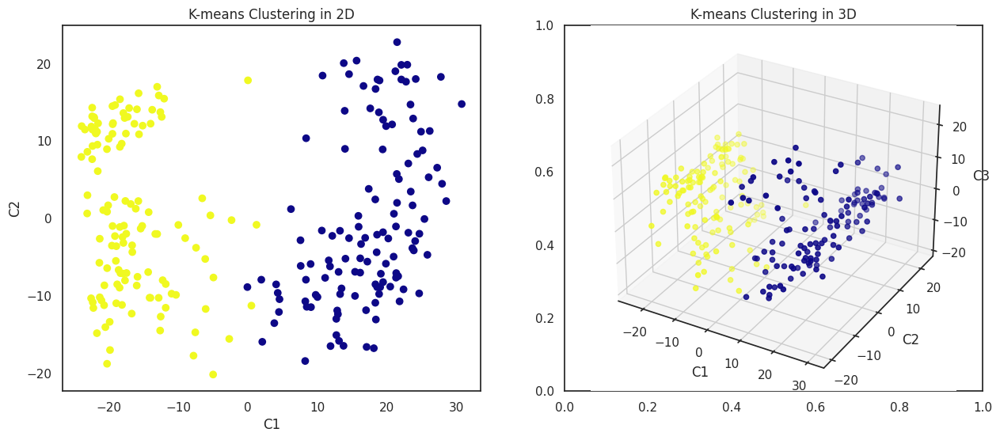

In [ ]:

from sklearn.cluster import KMeans

from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters 
n_clusters = 2

# Initialize and fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title('K-means Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('K-means Clustering in 3D')

plt.show()


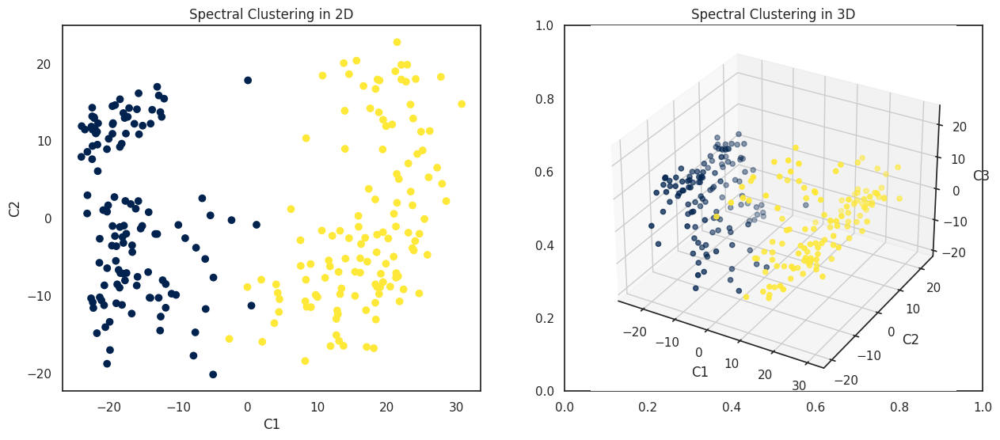

In [ ]:

from sklearn.cluster import SpectralClustering
from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters
n_clusters = 2

# Initialize and fit the Spectral Clustering model
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca)

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title('Spectral Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('Spectral Clustering in 3D')

plt.show()


The clustering of the cells profiles across genes is approximately the same using all the three methods used above therefore we can deduce that these are accurate plots to achieve the best clustering results.

Now we will use the correlation-based distance to cluster the data. This distance is commonly used in gene expression data analysis because it provides a measure of the similarity between gene expression patterns across different samples. To do so we consider the train dataframe without transposing it, therefore considering the gene expressions across cells. First we log-transform the data and decrease the dimension of the cells using PCA as we did before.

In [ ]:
from sklearn.preprocessing import StandardScaler

x = StandardScaler(with_mean=False).fit_transform(df_mcf_smart_train.apply(lambda x: np.log2(1+x)))
pca = PCA(n_components=0.95)
red = pca.fit_transform(x)
red.shape


(3000, 153)

In [ ]:
df_pca_corr = pd.DataFrame(red, index=df_mcf_smart_train.T.columns, columns=[f'C{i}' for i in range(153)])
df_pca_corr

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C143,C144,C145,C146,C147,C148,C149,C150,C151,C152
CYP1B1,35.286560,15.340115,-5.810700,5.090120,-1.843803,3.333802,5.551929,0.425637,-0.934824,1.153662,...,0.107891,-0.451271,0.646830,0.567559,-0.203026,0.097025,0.328575,-0.215385,-0.096300,0.370472
CYP1B1-AS1,29.427301,14.901258,-5.365583,4.758536,-1.734846,3.016952,5.148658,0.337095,-0.756137,1.324313,...,0.292567,-0.567465,0.626987,0.403551,-0.033288,0.050454,0.372366,-0.266902,-0.066796,0.377512
CYP1A1,5.994419,16.951108,-5.515493,4.536069,-2.225793,0.700408,1.745945,-5.128402,4.734440,1.309278,...,0.927295,-0.417873,-0.354579,0.995464,0.820289,-0.226124,0.522292,0.326527,-0.513165,-0.345353
NDRG1,17.677353,20.470678,1.751501,2.652604,-2.583503,0.421096,-0.773873,-2.563307,-0.438804,-0.645561,...,0.767020,-0.771395,-0.272321,1.410904,0.391434,-0.219278,-0.271449,-0.390973,-0.093278,-0.012142
DDIT4,32.387172,15.972149,1.010484,-0.276106,-1.370010,1.865960,-1.145865,-0.234209,1.311943,-2.113242,...,-0.157945,-0.285522,-0.379019,0.534676,0.032366,-0.541859,-0.647499,0.158211,0.690888,0.345026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GRIK5,-10.410188,0.696460,0.052642,-0.117292,-0.307027,0.113962,-0.012732,-0.086483,-0.240610,0.057393,...,-0.204729,0.123850,0.120337,0.081558,0.070262,-0.059109,0.020162,0.220589,-0.186599,0.208632
SLC25A27,-10.533358,0.599722,-0.185083,-0.004441,-0.060229,0.279665,-0.094580,0.144394,-0.251283,-0.385239,...,0.078078,0.027243,0.032795,0.104086,-0.032025,0.171282,-0.013792,-0.045957,-0.130305,-0.004031
DENND5A,11.495314,5.613233,1.636321,0.627939,-0.863810,-0.523880,0.069123,2.956649,0.909677,-0.123118,...,1.036643,-0.721571,0.866264,-0.335171,-0.840312,-0.291973,0.032547,0.302956,0.971801,-0.472062
CDK5R1,-7.930032,-1.219240,0.082187,-0.094589,0.575226,0.178141,0.004475,0.052450,-1.242715,-0.103209,...,-0.207504,-0.478442,0.065302,-0.008302,0.610469,0.375850,-0.387906,0.352967,-0.446645,-0.034548


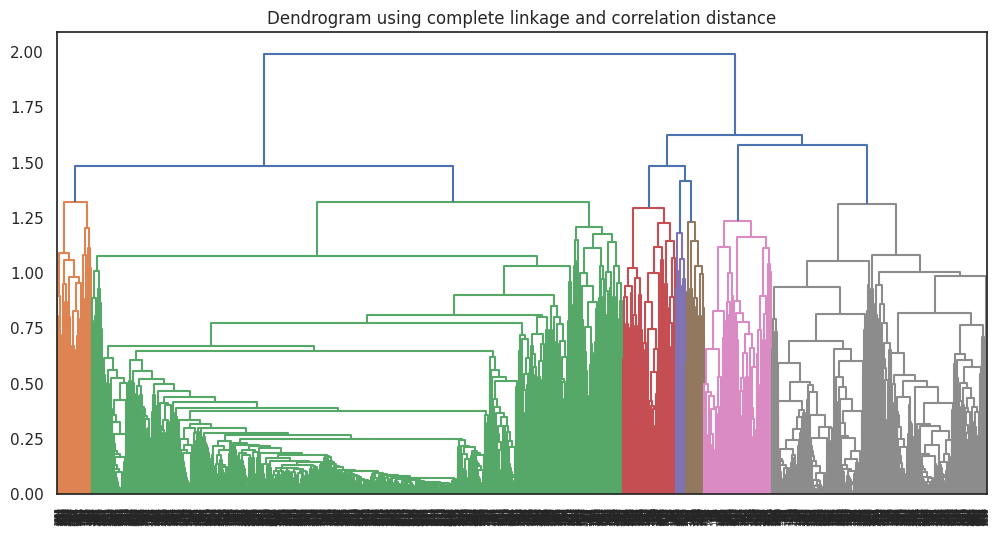

In [ ]:

import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import pdist
sys.setrecursionlimit(10000)

plt.figure(figsize=(12, 6))
# Calculate the distance matrix using the correlation as distance measure
corr_distance_matrix = pdist(df_pca_corr, metric='correlation')

# Compute the linkage matrix using the precomputed distance matrix and the average linkage method
clusters = shc.linkage(corr_distance_matrix, method='complete', metric='precomputed')

# Plot the dendrogram
plt.title("Dendrogram using complete linkage and correlation distance")
shc.dendrogram(Z=clusters) 
plt.show()

This approach is used for analyzing gene expression data, as it captures the similarity between gene expression patterns across different samples. The hierarchical clustering shown above reveals relationships between the samples based on these patterns. This method found some visible clusters. 

Next, we apply the same techniques as before to find the optimal number of clusters.

The within cluster sum of squares for 1 clusters is 712849.06
The within cluster sum of squares for 2 clusters is 345578.98
The within cluster sum of squares for 3 clusters is 277694.83
The within cluster sum of squares for 4 clusters is 254760.38
The within cluster sum of squares for 5 clusters is 238880.20
The within cluster sum of squares for 6 clusters is 227999.61
The within cluster sum of squares for 7 clusters is 220138.93
The within cluster sum of squares for 8 clusters is 213806.27
The within cluster sum of squares for 9 clusters is 208618.03
The within cluster sum of squares for 10 clusters is 204531.29


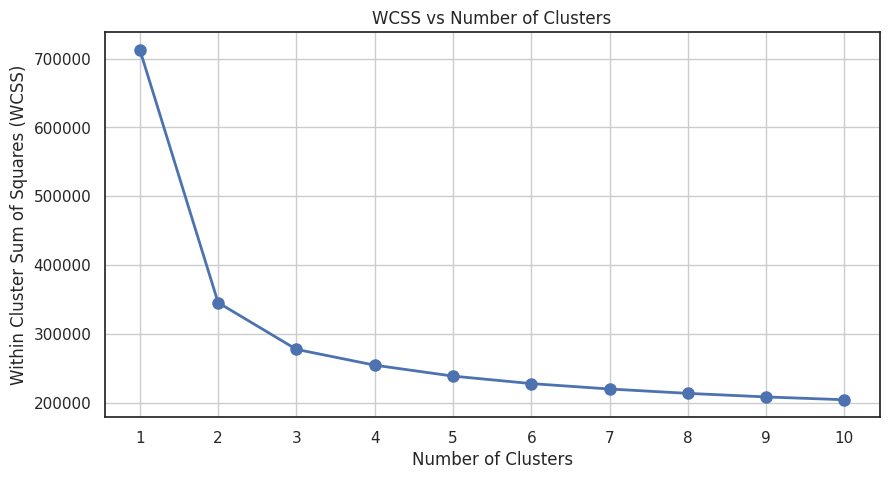

In [ ]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score


wcss = {} 
for i in range(1,11):

  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)
  #Sum of squared distances of samples to their closest cluster center.
  wcss[i] = (kmeans.inertia_)
  print(f'The within cluster sum of squares for {i} clusters is {wcss[i]:.2f}')

x = list(wcss.keys())
y = list(wcss.values())

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='o', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares (WCSS)')
plt.title('WCSS vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()



We can see that the biggest decrease in within cluster sum of squares happens at 2 clusters so we choose 2 as our number of clusters. 

The silhouette score for 2 clusters is 0.513
The silhouette score for 3 clusters is 0.432
The silhouette score for 4 clusters is 0.430
The silhouette score for 5 clusters is 0.350
The silhouette score for 6 clusters is 0.369
The silhouette score for 7 clusters is 0.284
The silhouette score for 8 clusters is 0.275
The silhouette score for 9 clusters is 0.261
The silhouette score for 10 clusters is 0.257


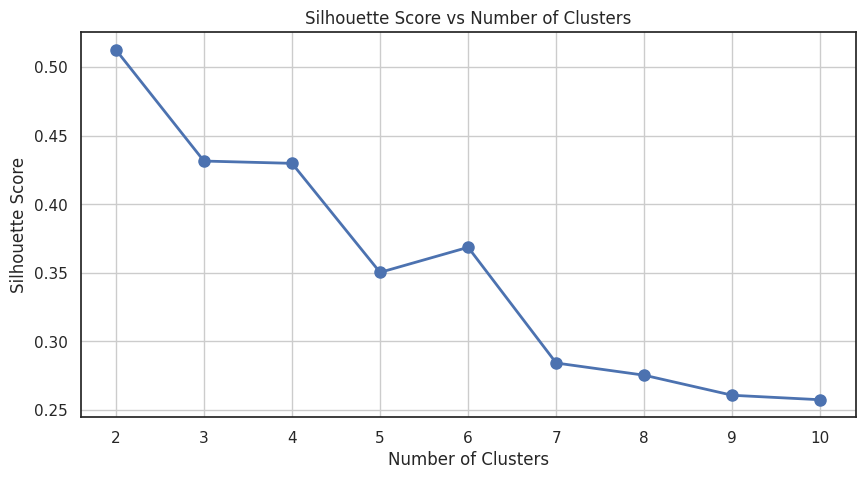

In [ ]:

s_score = {} 

for i in range(2,11): # Note that the minimum number of clusters is 2
  # Fit kmeans clustering model for each cluster number
  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)

  classes = kmeans.predict(df_pca_corr)
 
  s_score[i] = (silhouette_score(df_pca_corr, classes)) 

  print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}') 

x = list(s_score.keys())
y = list(s_score.values())

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='o', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()


As before, we can see that the model with 2 clusters has the highest value of Silhouette score, and the model with 3 clusters has the 2nd highest value, so we get the consistent result that there are 2 or 3 clusters.


Now we actually use these results and cluster the data.

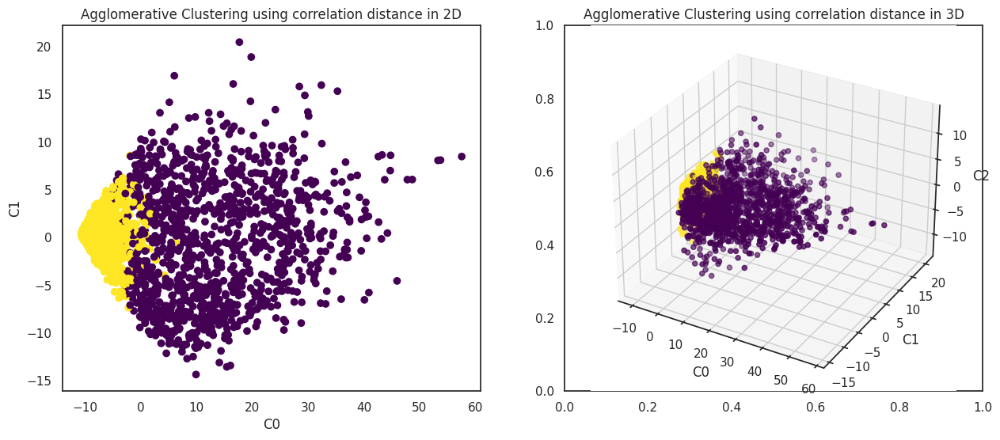

In [ ]:

from sklearn.cluster import AgglomerativeClustering

from scipy.spatial.distance import pdist, squareform


# Choose the optimal number of clusters 
n_clusters = 2

# Choose the linkage method based on the dendrogram
linkage_method = "complete"
corr_distance_matrix = pdist(df_pca_corr, metric='correlation')
square_corr_distance_matrix = squareform(corr_distance_matrix)

# Initialize and fit the Agglomerative Clustering model
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(square_corr_distance_matrix)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title(f'Agglomerative Clustering using correlation distance in 2D')


# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title(f'Agglomerative Clustering using correlation distance in 3D')
plt.show()



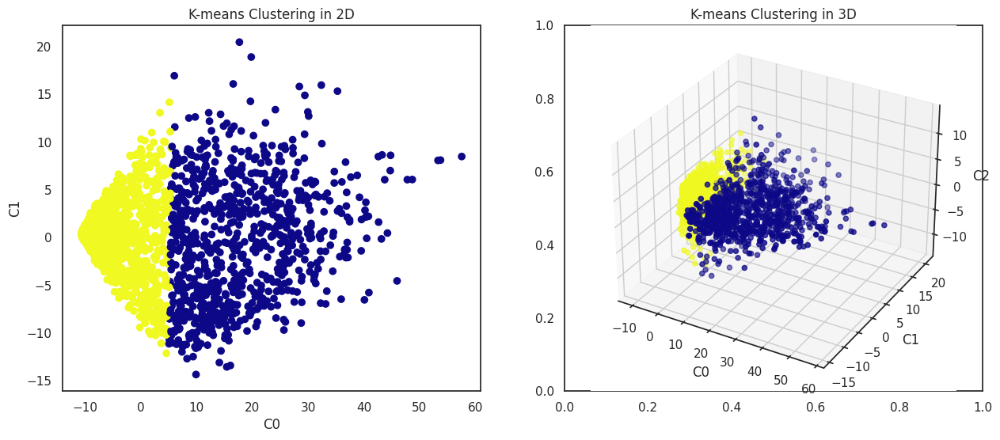

In [ ]:

from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters 
n_clusters = 2

# Initialize and fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca_corr)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('K-means Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('K-means Clustering in 3D')

plt.show()


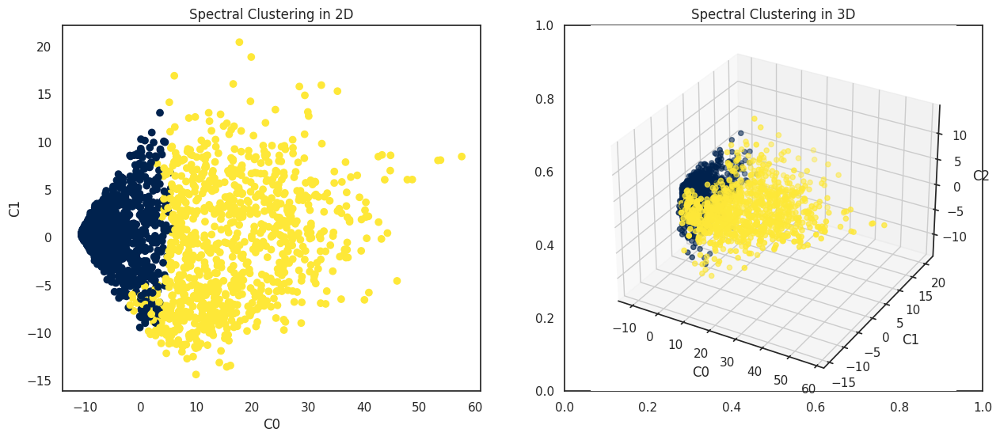

In [ ]:

from sklearn.cluster import SpectralClustering

from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters
n_clusters = 2

# Initialize and fit the Spectral Clustering model
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca_corr)

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('Spectral Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('Spectral Clustering in 3D')

plt.show()


The clustering of the gene expression across cells using correlation-based distance to cluster the data is approximately the same using all the three methods described before; therefore we can deduce that these are accurate plots to achieve the best clustering results.

#### Heatmap visualization

We now use agglomerative clustering to cluster genes and cells and reorder them in a way that data points that are the most similar to each other are grouped together.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

df = df_mcf_smart_train.transpose()

cluster_cells = AgglomerativeClustering().fit(df)
cluster_genes =  AgglomerativeClustering().fit(df.T)

def order(children):
    n_samples = children.shape[0] + 1
    order = []

    stack = [children[-1]]

    while stack:
        root = stack.pop()

        if root[1] >= n_samples:
            stack.append(children[root[1]-n_samples])
        else:
            order.append(root[1])
        
        if root[0] >= n_samples:
            stack.append(children[root[0]-n_samples])
        else:
            order.append(root[0])

    return order

ordered_cells = order(cluster_cells.children_)
ordered_genes =  order(cluster_genes.children_)
ordered_df = df.iloc[ordered_cells, ordered_genes]

In order to make a better visualization, we apply a normalization technique known as "feature scaling". We divide each value in our dataframe by the maximum value in its column, which effectively scales the values to fall within the range of [0,1]. This is especially useful to place data on a similar scale and easily visualize it and interpret it.

In [ ]:
# Feature scaling
norm = ordered_df.div(ordered_df.max(axis=0), axis=1)
len(norm.index)

250

We proceed by showing the heatmap relative to gene expressions in cells.

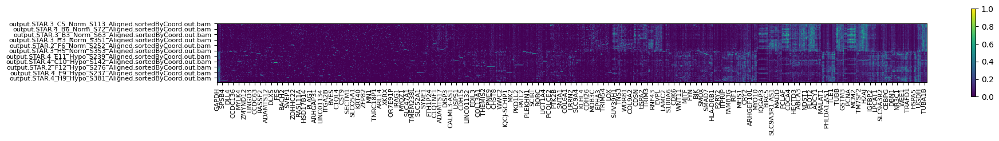

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.loc[norm.index, norm.columns]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 23), subset.index[::23], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 23), subset.columns[::23], rotation=90, fontsize=8)

plt.colorbar(shrink=0.1)

plt.show()


From the plot we can gather that a big part of genes at the end of the map show high gene expression. To better visualize this group we can reduce the size of the map focusing on those genes.

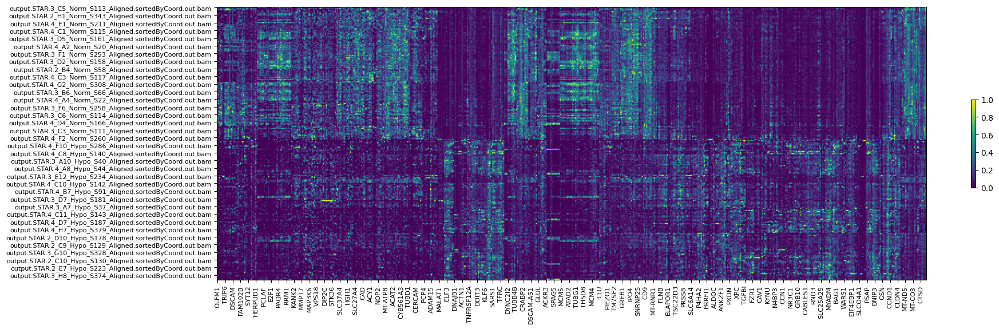

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.iloc[:,2350:]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 7), subset.index[::7], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 7), subset.columns[::7], rotation=90, fontsize=8)

plt.colorbar(shrink=0.1)

plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
X = df_mcf_smart_train.T
y = np.array([int('Hypo' in name) for name in X.index])

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)


We create a validation set: a portion of the data used to evaluate the performance of a model during training. It is typically used to tune the hyperparameters of the model (e.g., learning rate, regularization strength, etc.) to improve its performance on unseen data.

During training, the model is trained on the training set, and its performance is evaluated on the validation set. The model's parameters are then adjusted based on the validation set performance. This process is repeated until the model's performance on the validation set is satisfactory.

We create an array of entries of boolean values to determine wheter a cell belongs to the 'Hypo' class. This will be used for labelling our data.

# Supervised Learning

## Useful functions

Two useful functions for cross-validation and evaluation in the case of full dataset or dataset reduced with PCA. (We expect the full model to overfit).

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

'''
Comment to understand this function:

est: untrained model you are using (ex. KNN, SVC etc.)
params: parameters you want to train the model on
x_train, y_train are there just in case we want to use different datasets
random = True (default) uses RandomizedSearch
random = False uses GridSearch
'''

def cross_val(est, params, x_train, y_train, random=True, scoring='neg_log_loss'):
    if random:
        clf = RandomizedSearchCV(est, params,scoring=scoring,random_state=0,n_iter=50,cv=5,n_jobs=-1)
    else:
        clf = GridSearchCV(est, params,scoring=scoring,verbose=0,n_jobs=-1)
    clf.fit(x_train, y_train)
    best_score = clf.best_score_
    best_params = clf.best_params_
    print(best_score)
    print(best_params)
    return clf.best_estimator_

In [ ]:
from sklearn.base import clone
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss, classification_report, confusion_matrix, precision_recall_curve, average_precision_score, auc, roc_curve
from sklearn.metrics import RocCurveDisplay as RCD

'''
Comment to understand this function:

model: best model returned from cross val (which contains the model with the best parameters found)
x_train, y_train, x_test, y_test are there just in case we want to use different datasets
'''

def evaluation(model,x_train,y_train,x_test,y_test):
    best=clone(model)
    best.fit(x_train,y_train)
    y_pred = best.predict(x_test)

    #scores
    y_class_prob = best.predict_proba(x_test)

    acc = accuracy_score(y_test,y_pred)
    print('Accuracy score:', acc)
    lss = log_loss(y_test,y_class_prob)
    print('Log loss:', lss)
    roc_auc = roc_auc_score(y_test,y_class_prob[:,1])
    print('Roc-auc score:',roc_auc)
    f_1 = classification_report(y_test, y_pred, output_dict=True)['macro avg']['f1-score']
    print('Average f1-score:',f_1)
    print(classification_report(y_test, y_pred))

    fig,ax = plt.subplots(1,2,figsize=(18,5))

    #fpr-tpr

    RCD.from_estimator(best, x_test, y_test,ax=ax[0])
    ax[0].set_title('ROC curve')

    # confusion matrix

    matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(matrix, annot=True, fmt="d",ax=ax[1])
    ax[1].set_title('Confusion Matrix')
    ax[1].set_xlabel('Predicted')
    ax[1].set_ylabel('True')
    
    return acc,lss,roc_auc,f_1

In [ ]:
def cross_val_genes(est, params, x_train, y_train, random=True,scoring='neg_log_loss', tot_genes=100):
    if random:
        clf = RandomizedSearchCV(est, params,scoring=scoring,random_state=0,n_iter=50,cv=5,n_jobs=-1)
    else:
        clf = GridSearchCV(est, params,scoring=scoring,verbose=0,n_jobs=-1)

    best_score = -np.inf
    best_number = 0
    best_clf = None

    for i in range(10,tot_genes+1,15):
        red_x_train =  x_train[important_genes[:i]]
        clf.fit(red_x_train, y_train)
        score = clf.best_score_
        if score>best_score:
            best_score = score
            best_number = i
            best_clf = clf.best_estimator_
            
    genes_selected = important_genes[:best_number]
    best_params = best_clf.get_params()
    print('Score:',best_score)
    print('Parameters:',best_params)
    print('Genes selected:',genes_selected)
    return best_clf, genes_selected

In [ ]:
def evaluation_genes(model,genes,x_train,y_train,x_test,y_test):
    x_train_red = x_train[genes]
    x_test_red = x_test[genes]
    best=clone(model)
    best.fit(x_train_red,y_train)
    y_pred = best.predict(x_test_red)

    #scores
    y_class_prob = best.predict_proba(x_test_red)

    acc = accuracy_score(y_test,y_pred)
    print('Accuracy score:', acc)
    lss = log_loss(y_test,y_class_prob)
    print('Log loss:', lss)
    roc_auc = roc_auc_score(y_test,y_class_prob[:,1])
    print('Roc-auc score:',roc_auc)
    f_1 = classification_report(y_test, y_pred, output_dict=True)['macro avg']['f1-score']
    print('Average f1-score:',f_1)
    print(classification_report(y_test, y_pred))

    fig,ax = plt.subplots(1,2,figsize=(18,5))

    #fpr-tpr

    RCD.from_estimator(best, x_test_red, y_test,ax=ax[0])
    ax[0].set_title('ROC curve')

    # confusion matrix

    matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(matrix, annot=True, fmt="d",ax=ax[1])
    ax[1].set_title('Confusion Matrix')
    ax[1].set_xlabel('Predicted')
    ax[1].set_ylabel('True')
    
    return acc,lss,roc_auc,f_1

In [ ]:
# generating a learning curve to visualize bias and variance

from sklearn.model_selection import learning_curve

def plot_learning_curve(model,scoring='accuracy'):
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5, scoring=scoring, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), verbose=0)
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)

    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, test_mean, label='Cross-validation score')

    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#DDDDDD")
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#DDDDDD")

    plt.title('Learning Curve')
    plt.xlabel('Training Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

Functions to find the average performance among different splits of test and train data given the small nature of our dataset.

In [ ]:
def short_evaluation(model,x_train,y_train,x_test,y_test):
    best=clone(model)
    best.fit(x_train,y_train)
    y_pred = best.predict(x_test)

    #scores
    y_class_prob = best.predict_proba(x_test)

    acc = accuracy_score(y_test,y_pred)
    lss = log_loss(y_test,y_class_prob)
    roc_auc = roc_auc_score(y_test,y_class_prob[:,1])
    f_1 = classification_report(y_test, y_pred, output_dict=True)['macro avg']['f1-score']

    return acc,lss,roc_auc,f_1

def average_performance(model, data, labels, n):
    acc, lss, roc_auc, f_1 = [], [], [], []
    values = [random.randint(0,10000) for j in range(n)]
    for i in values:
        xtrain, xtest, ytrain, ytest = train_test_split(data, labels, test_size=0.25, random_state=i)
        ev = short_evaluation(model, xtrain, ytrain, xtest, ytest)
        acc.append(ev[0])
        lss.append(ev[1])
        roc_auc.append(ev[2])
        f_1.append(ev[3])
    print('Maximum and minimum accuracy:', max(acc), ' ', min(acc))
    print('Average Accuracy score:', np.mean(acc))
    print('Average Log loss:',np.mean(lss))
    print('Average Roc-auc score:', np.mean(roc_auc))
    print('Average f1-score:', np.mean(f_1))
    return min(acc), max(acc), np.mean(acc), np.mean(lss), np.mean(roc_auc), np.mean(f_1)

## Train-test split

# Feature importance with Random forests

Random Forests is a robust machine learning algorithm that is primarily used for classification and regression tasks. It operates by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. This process effectively creates a 'forest' of different decision models which work together to create an aggregate prediction.

One of the main strengths of Random Forests is its ability to perform feature selection. Each individual tree in the Random Forest is trained on a random subset of the features, and the importance of each feature can be evaluated by measuring how much the tree nodes that use that feature reduce impurity across all trees in the forest. Therefore, Random Forests are good for feature selection because they provide an in-built mechanism to determine feature importance.

Random Forests have several advantages. They are very flexible and can handle both categorical and numerical data, as well as missing data. They are also less likely to overfit than single decision trees because they average the results over many trees. Furthermore, they are quite robust to the inclusion of irrelevant or redundant features because of their feature selection capabilities.

However, Random Forests also have some disadvantages. They can be computationally intensive and require more resources and time to train and predict, especially with large datasets or a large number of trees. They are also considered a black-box model with complex structures, making them harder to interpret compared to simpler models like linear regression or single decision trees. Additionally, although they are less likely to overfit than single decision trees, they can still overfit if the number of trees is not set correctly.







Before running a random forest algorithm on our data to find the features relative importance, we compute cross-validation to select the most optimal hyperparameters for the random forest.

WARNING: Very time-consuming code ahead - skip if not necessary

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

# Define the parameter values that should be searched
n_estimators = [100, 500, 1000, 5000, 10000]
max_features = ['sqrt']
max_samples = [0.5, 0.6, 0.7, 0.8]
bootstrap = [True]
max_depth = [None, 250, 500, 750]
criterion = ['gini', 'entropy', 'log_loss']
min_samples_split = [2, 3, 4, 5]
min_samples_leaf = [1, 2, 3, 4]
bootstrap = [True]

param_distributions = dict(n_estimators=n_estimators, max_samples=max_samples, bootstrap=bootstrap, 
                  max_features=max_features, max_depth=max_depth, criterion=criterion, 
                  min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

# Instantiate the grid
et = ExtraTreesClassifier(n_jobs=-1)
random_search = RandomizedSearchCV(et, param_distributions=param_distributions, n_iter=50, cv=3, random_state=42, n_jobs=-1)

# Fit the grid with data
random_search.fit(X_train, y_train)

# View the complete results
print(random_search.cv_results_)

# Print the best score and parameters
print("Best score: ", random_search.best_score_)
print("Best parameters: ", random_search.best_params_)


{'mean_fit_time': array([ 1.26865617,  2.25156379, 11.85911075, 11.88467574, 22.90154982,
        1.16973448,  2.16885551,  0.39399894,  1.30070909, 12.11243955,
        2.61387483,  0.38205187,  0.34328008,  0.32242195,  2.58898894,
       24.13449677,  1.36256552, 24.2931637 ,  2.27564152,  1.25912539,
       24.1237313 , 12.45314074,  1.50791979,  0.44287578,  2.78571717,
        0.53036276, 23.92380412, 13.021408  ,  2.39183219,  1.3844463 ,
        1.25183193, 12.08472482,  0.43196321,  1.46153267, 23.22482149,
        1.40915799, 12.38265872, 11.9231507 ,  1.28963025, 23.21319548,
        1.33532111, 12.09134539, 24.11388246, 23.35403403, 22.68915153,
        0.39850895, 22.04105679,  2.38905621,  2.54219198,  1.27787066]), 'std_fit_time': array([0.1053959 , 0.08387317, 0.24544927, 0.11868054, 0.54670849,
       0.0110721 , 0.10582471, 0.05639986, 0.06090098, 0.10555173,
       0.06768881, 0.0591234 , 0.05077378, 0.03974809, 0.07204507,
       0.66557617, 0.06301737, 0.74781964, 

We can now run our random forests classifier with the newly found parameters.

In [ ]:
# Get the best parameters
best_params = random_search.best_params_

# Create a new classifier with these parameters
et_clf_best = ExtraTreesClassifier(n_estimators=best_params['n_estimators'], 
                                   max_samples=best_params['max_samples'], 
                                   bootstrap=best_params['bootstrap'],
                                   max_features=best_params['max_features'],
                                   criterion=best_params['criterion'],
                                   min_samples_split=best_params['min_samples_split'],
                                   min_samples_leaf=best_params['min_samples_leaf'],
                                   max_depth=best_params['max_depth'],
                                   n_jobs=-1)

# Fit the classifier to the training data
et_clf_best.fit(X_train, y_train)


ExtraTreesClassifier(bootstrap=True, max_depth=500, max_samples=0.6,
                     min_samples_leaf=2, min_samples_split=3, n_estimators=500,
                     n_jobs=-1)

We plot the relative importance of all features in order to have a look at its distribution

Text(0.5, 1.0, 'Feature Importance using Extra Trees')

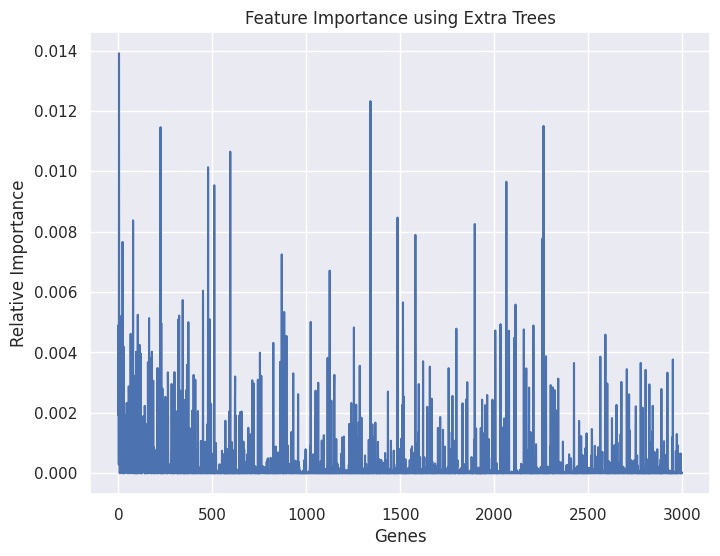

In [ ]:
# Plotting the results of Feature Importance
fig = plt.figure(figsize=(8, 6))
plt.plot(et_clf_best.feature_importances_)
plt.ylabel('Relative Importance')
plt.xlabel('Genes')
plt.title('Feature Importance using Extra Trees')

We want to find the names of the top 10 genes by importance.

In [ ]:
# Get feature importances
importances = et_clf_best.feature_importances_

# Create a pandas DataFrame from the importances
importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values('importance', ascending=False)

# Get the sorted feature names
important_genes = importance_df['feature'].tolist()

# Print the top 10 features
print('Top 15 genes:', important_genes[:15])


Top 15 genes: ['NDRG1', 'PFKP', 'MTATP6P1', 'PGK1', 'PDK1', 'FAM162A', 'PSME2', 'DHCR7', 'GAPDH', 'ENO2', 'MT-ATP8', 'FDPS', 'TUBD1', 'BNIP3', 'ARPC1B']


# Random Forest

Random Forest is a powerful classification tool that uses ensemble learning to generate multiple decision trees, averaging their results to improve prediction accuracy and control overfitting. 

## FULL

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=0)

In [ ]:
rf_param = {   
    'n_estimators': [100, 500, 1000, 5000, 10000],          
    'max_features': ['sqrt'], 
    'max_samples': [0.5, 0.6, 0.7, 0.8],
    'max_depth' : [None, 250, 500, 750],               
    'criterion' :['gini', 'entropy', 'log_loss'],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4],
    'bootstrap': [True]
    }

-0.0881761494937229
{'n_estimators': 5000, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_samples': 0.8, 'max_features': 'sqrt', 'max_depth': None, 'criterion': 'gini', 'bootstrap': True}
Accuracy score: 1.0
Log loss: 0.07833693451395182
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



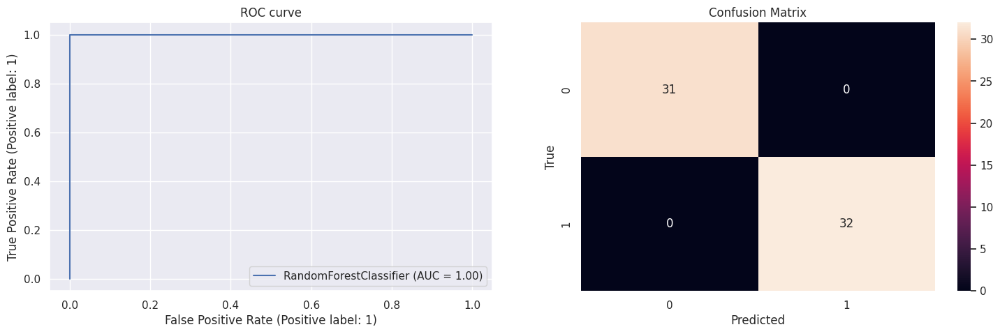

In [ ]:
rf_best = cross_val(rf, rf_param, X_train, y_train, random=True)
rf_eval = evaluation(rf_best, X_train, y_train, X_test, y_test)

In [ ]:
rf_avg = average_performance(rf_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9968253968253968
Average Log loss: 0.07922322867223155
Average Roc-auc score: 1.0
Average f1-score: 0.9966410733799362


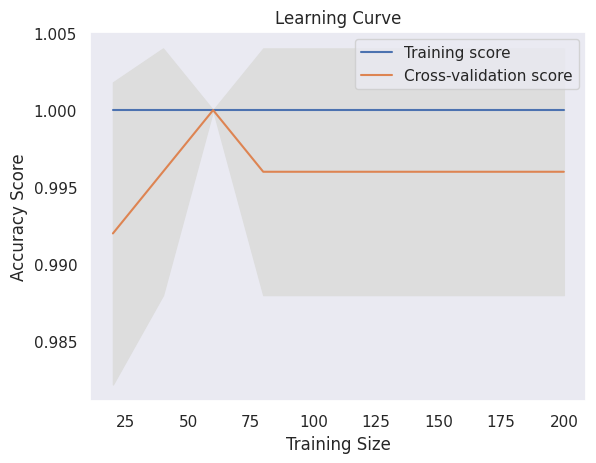

In [ ]:
plot_learning_curve(rf_best)

## PCA

A pipeline in sklearn is a means to streamline the workflow by chaining multiple processing steps (like scaling, PCA, model fitting) together, ensuring that procedures are executed in the correct order. It simplifies code and helps in reproducibility, but its linear sequence may not suit all types of workflows and large pipelines can be computationally intensive.

Here, we adopt a pipeline to execute scaling, PCA and random forest on our training set.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

rf_pipe = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),
    ('pca', PCA()),
    ('rf', RandomForestClassifier(random_state=0))])

In [ ]:
rf_pipe_param = {
    'pca__n_components': [n for n in range(10,109, 3)],   
    'rf__n_estimators': [100, 500, 1000, 5000, 10000],          
    'rf__max_features': ['sqrt'], 
    'rf__max_samples': [0.5, 0.6, 0.7, 0.8],
    'rf__max_depth' : [None, 250, 500, 750],               
    'rf__criterion' :['gini', 'entropy', 'log_loss'],
    'rf__min_samples_split': [2, 3, 4, 5],
    'rf__min_samples_leaf': [1, 2, 3, 4],
    'rf__bootstrap': [True]
    }

-0.10528342995039017
{'rf__n_estimators': 500, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 1, 'rf__max_samples': 0.8, 'rf__max_features': 'sqrt', 'rf__max_depth': 750, 'rf__criterion': 'entropy', 'rf__bootstrap': True, 'pca__n_components': 10}
Accuracy score: 1.0
Log loss: 0.07180754530484888
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



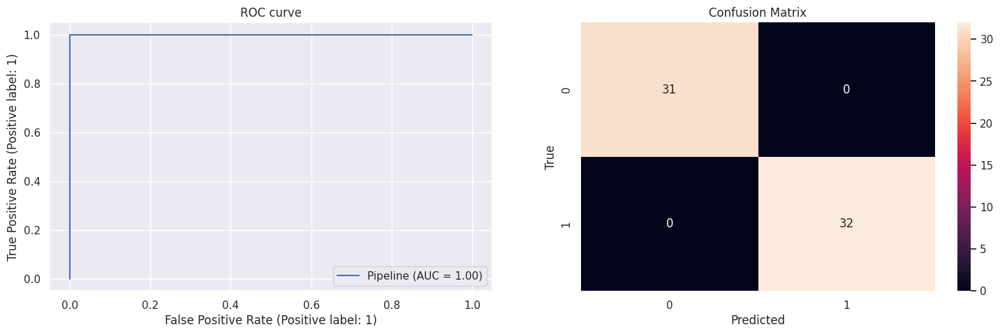

In [ ]:
rf_pipe_best = cross_val(rf_pipe, rf_pipe_param, X_train, y_train, random=True)
rf_pipe_eval = evaluation(rf_pipe_best, X_train, y_train, X_test, y_test)

In [ ]:
rf_pipe_avg = average_performance(rf_pipe_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9523809523809523
Average Accuracy score: 0.9841269841269842
Average Log loss: 0.08459664377503326
Average Roc-auc score: 0.9994910302830811
Average f1-score: 0.984025182604689


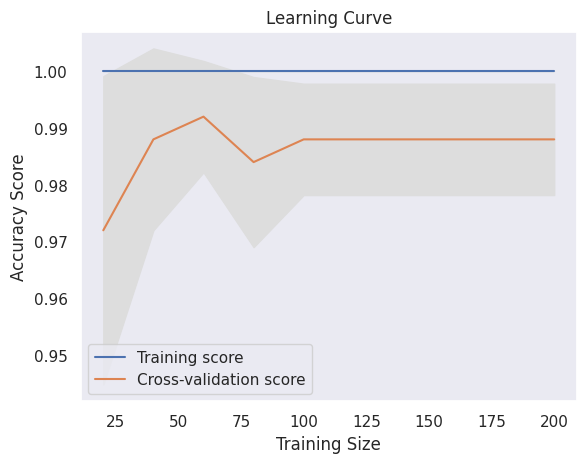

In [ ]:
plot_learning_curve(rf_pipe_best)

## Important genes

Score: -0.047008756509866335
Parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': 0.8, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 3, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 5000, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
Genes selected: ['NDRG1', 'PFKP', 'MTATP6P1', 'PGK1', 'PDK1', 'FAM162A', 'PSME2', 'DHCR7', 'GAPDH', 'ENO2', 'MT-ATP8', 'FDPS', 'TUBD1', 'BNIP3', 'ARPC1B', 'CTPS1', 'P4HA1', 'FADS1', 'HNRNPA2B1', 'PGP', 'IFITM2', 'MT-CYB', 'IRF2BP2', 'VEGFA', 'GPI']
Accuracy score: 1.0
Log loss: 0.036705620843785244
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro a

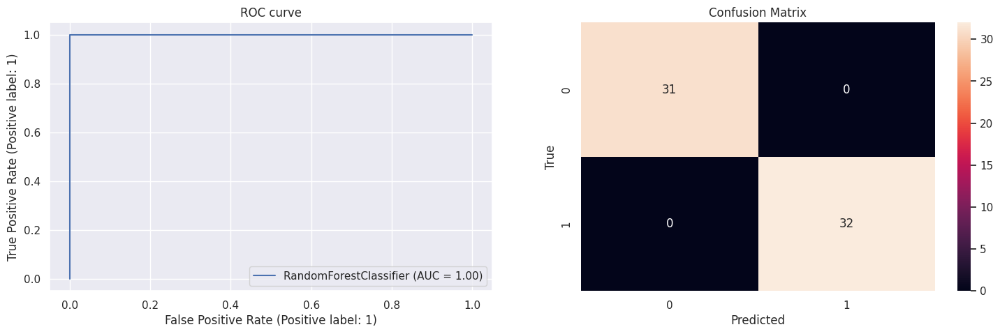

In [ ]:
rf_genes_best, rf_genes = cross_val_genes(rf, rf_param, X_train, y_train, random=True)
rf_genes_eval = evaluation_genes(rf_genes_best,rf_genes, X_train, y_train, X_test, y_test)

In [ ]:
rf_genes_avg = average_performance(rf_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9936507936507937
Average Log loss: 0.08674649493699717
Average Roc-auc score: 1.0
Average f1-score: 0.9936137094885554


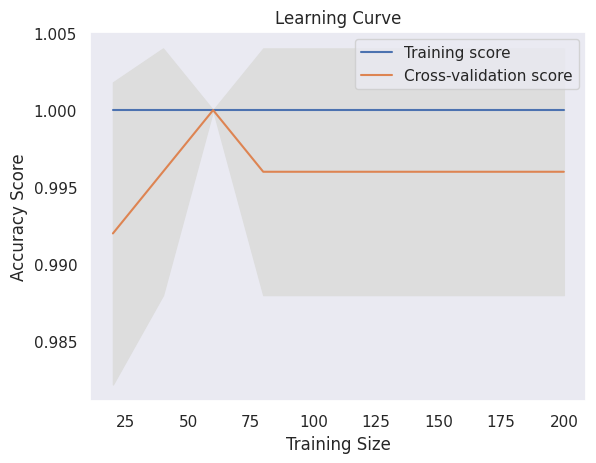

In [ ]:
plot_learning_curve(rf_genes_best)

# Logistic Regression

 This section uses logistic regression as a classifier. The parameters are tuned via RandomizedSearchCV, which is a more efficient method for hyperparameter optimization compared to GridSearchCV, especially when the parameter space is large.

In [ ]:
from sklearn.linear_model import LogisticRegression

## FULL

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
-0.0006552728746523701
{'penalty': 'l1', 'fit_intercept': False, 'C': 10}
Accuracy score: 1.0
Log loss: 0.0022682994124166
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



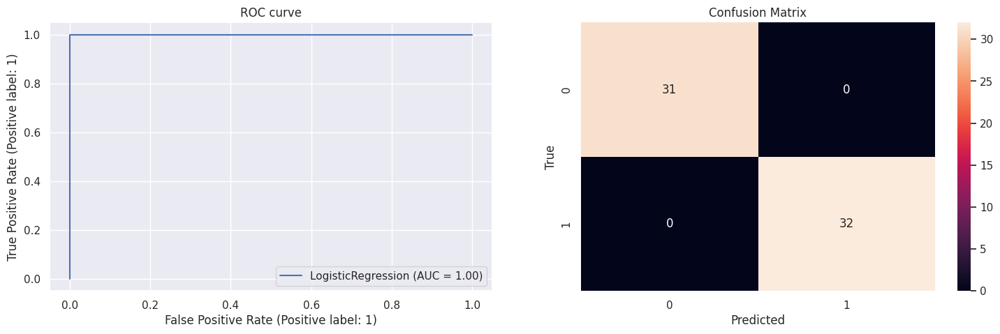

In [ ]:
lr = LogisticRegression(max_iter=10000,solver='liblinear',random_state=0)

lr_param = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l1', 'l2'], 
    'fit_intercept': [True, False]
}

lr_best = cross_val(lr, lr_param, X_train, y_train, random=True)
lr_eval = evaluation(lr_best, X_train, y_train, X_test, y_test)

In [ ]:
lr_avg = average_performance(lr_best, X, y, 100)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9996825396825397
Average Log loss: 0.0015855223948960976
Average Roc-auc score: 1.0
Average f1-score: 0.9996810867749083


The observations indicate a satisfactory outcome. The model has an average accuracy of 99%, a remarkably good level, complemented by a minimal log loss. The performance of the model is further corroborated by the results of cross-validation.

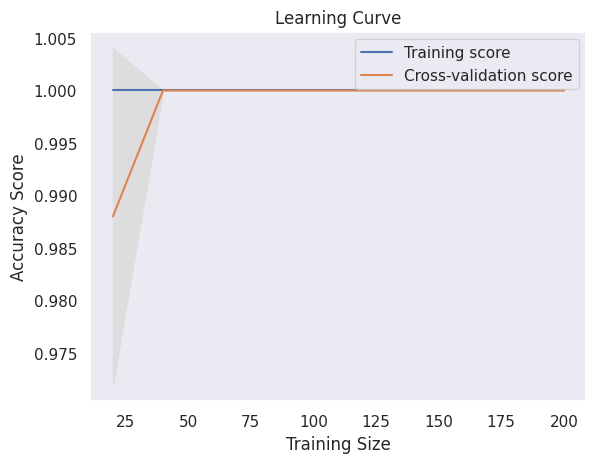

In [ ]:
plot_learning_curve(lr_best)

Unfortunately, the graph depicted above indicates a tendency towards minimal overfitting within the data, signifying a suboptimal generalization of the model when encountering new data.

## PCA

Here, a pipeline is used to first standardize the data, perform PCA for dimensionality reduction, and then apply logistic regression. Again, the parameters are optimized with a random search.

-0.0022559800351787448
{'pca__n_components': 27, 'classifier__penalty': 'l2', 'classifier__C': 1000}
Accuracy score: 1.0
Log loss: 0.0014359689818866327
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



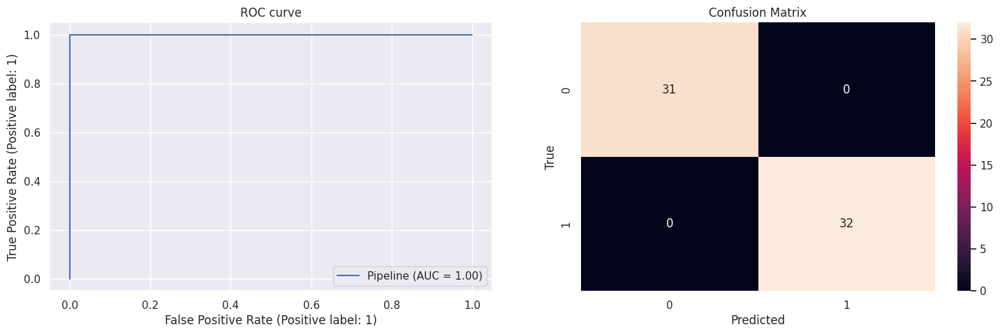

In [ ]:
# random search
lr_pipe = Pipeline([
    ('scaler', StandardScaler(with_mean = False)),
    ('pca', PCA()),
    ('classifier', LogisticRegression(solver='liblinear', max_iter=10000,random_state=0))
])

lr_pipe_param = { 
    'pca__n_components': [n for n in range(10,109)],
    'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'classifier__penalty': ['l1', 'l2']
}

lr_pipe_best = cross_val(lr_pipe, lr_pipe_param, X_train, y_train, random=True)
lr_pipe_eval = evaluation(lr_pipe_best, X_train, y_train, X_test, y_test)

In [ ]:
lr_pipe_avg = average_performance(lr_pipe_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9984126984126984
Average Log loss: 0.00297277401411755
Average Roc-auc score: 1.0
Average f1-score: 0.9984110970996216


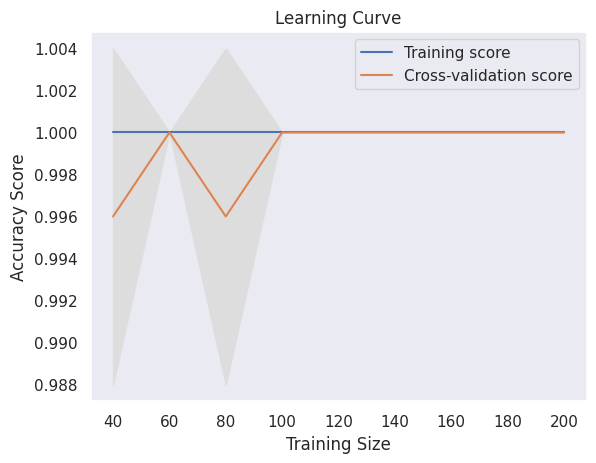

In [ ]:
plot_learning_curve(lr_pipe_best) 

The application of Logistic Regression in conjunction with Principal Component Analysis for dimensionality reduction did not yield satisfactory results for our dataset. Upon examination of the learning curve, it was evident that the model was underfitting the data. This unsatisfactory performance could potentially be due to the limited size of our dataset.

## Important genes

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


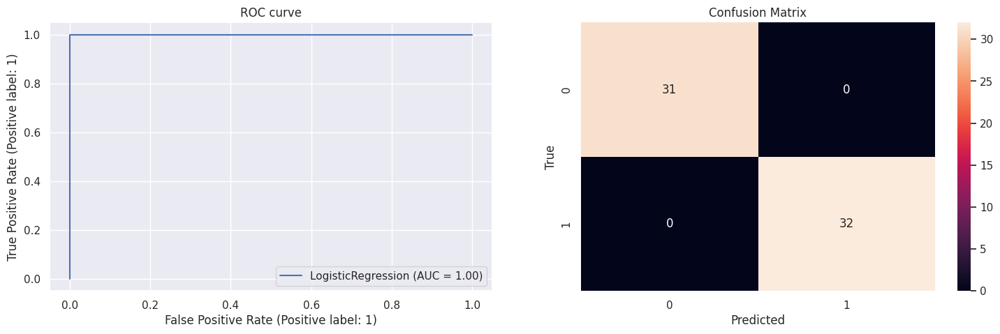

In [ ]:
lr_genes_best, lr_genes = cross_val_genes(lr, lr_param, X_train, y_train, random=True)
lr_genes_eval = evaluation_genes(lr_genes_best,lr_genes, X_train, y_train, X_test, y_test)

In [ ]:
lr_genes_avg = average_performance(lr_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9682539682539683
Average Accuracy score: 0.9873015873015873
Average Log loss: 0.04512522990020455
Average Roc-auc score: 0.9991871729141314
Average f1-score: 0.9872262737165078


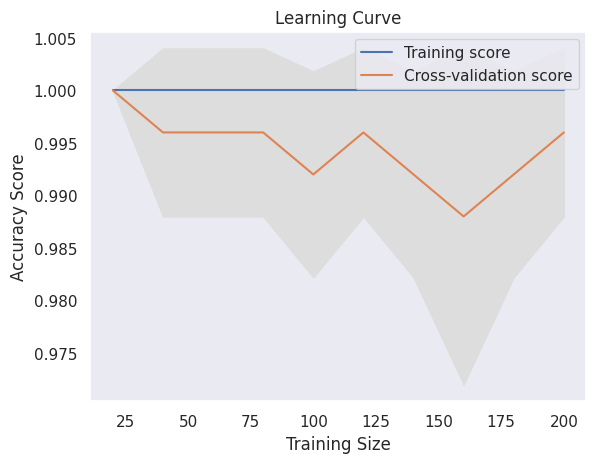

In [ ]:
plot_learning_curve(lr_genes_best)

# KNN

## FULL

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

## FULL

-0.0015566249365748634
{'weights': 'distance', 'p': 1, 'n_neighbors': 4, 'metric': 'minkowski', 'leaf_size': 39, 'algorithm': 'ball_tree'}
Accuracy score: 0.9841269841269841
Log loss: 0.02201485474557119
Roc-auc score: 1.0
Average f1-score: 0.9841269841269841
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        31
           1       1.00      0.97      0.98        32

    accuracy                           0.98        63
   macro avg       0.98      0.98      0.98        63
weighted avg       0.98      0.98      0.98        63



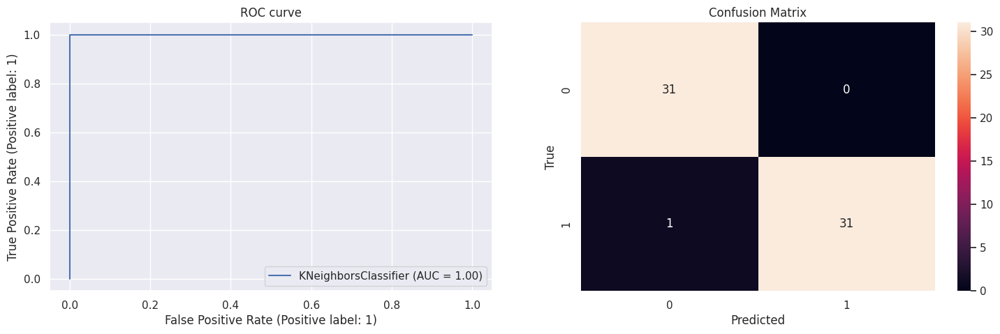

In [ ]:
knn = KNeighborsClassifier(n_jobs=-1)
knn_param = {
    'n_neighbors': list(range(1, 31)),
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': list(range(1,51)),
    'p': [1,2],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
}

knn_best = cross_val(knn, knn_param, X_train, y_train, random=True)
knn_eval = evaluation(knn_best, X_train, y_train, X_test, y_test)

In [ ]:
knn_avg = average_performance(knn_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9904761904761905
Average Log loss: 0.3311234324301007
Average Roc-auc score: 0.9903949721780606
Average f1-score: 0.9903064506482897


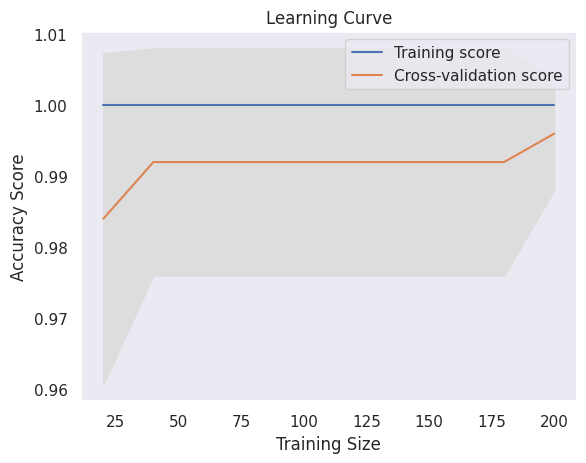

In [ ]:
plot_learning_curve(knn_best)

## PCA

-0.02202867299563675
{'knn__weights': 'distance', 'knn__p': 1, 'knn__n_neighbors': 3, 'knn__metric': 'minkowski', 'knn__leaf_size': 9, 'knn__algorithm': 'brute', 'PCA__n_components': 15}
Accuracy score: 1.0
Log loss: 9.992007221626415e-16
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



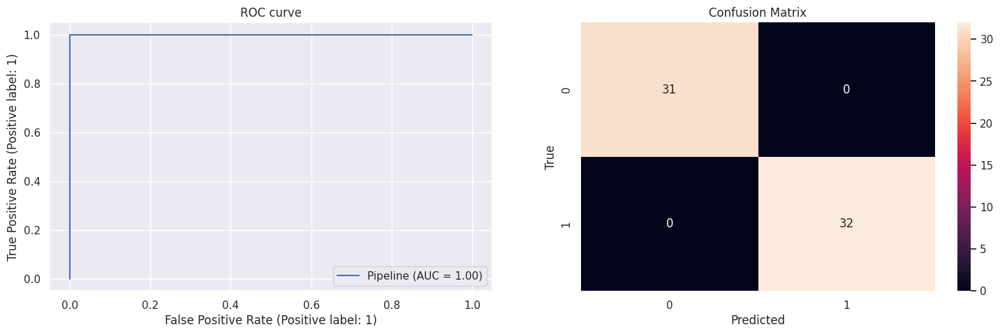

In [ ]:
knn_pipe = Pipeline([('SC', StandardScaler(with_mean=False)),('PCA', PCA()), ('knn', KNeighborsClassifier(n_jobs=-1))])
knn_pipe_param = {'PCA__n_components':[n for n in range(10,109)],
                  'knn__n_neighbors': list(range(1, 31)),
                  'knn__weights': ['uniform', 'distance'],
                  'knn__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                  'knn__leaf_size': list(range(1,51)),
                  'knn__p': [1,2],
                  'knn__metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
                   }

knn_pipe_best = cross_val(knn_pipe,knn_pipe_param,X_train,y_train,random=True)
knn_pipe_eval = evaluation(knn_pipe_best,X_train,y_train,X_test,y_test)

In [ ]:
knn_pipe_avg = average_performance(knn_pipe_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9682539682539683
Average Accuracy score: 0.9904761904761905
Average Log loss: 0.01686740764152406
Average Roc-auc score: 0.9996969696969696
Average f1-score: 0.9904092084922258


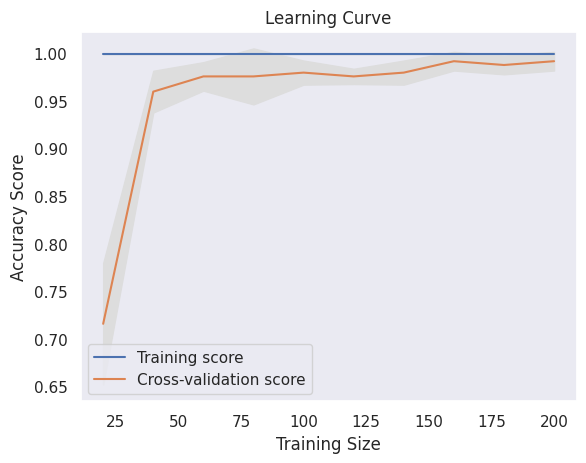

In [ ]:
plot_learning_curve(knn_pipe_best)

## Important genes

Score: -0.016431356931947597
Parameters: {'algorithm': 'brute', 'leaf_size': 37, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': -1, 'n_neighbors': 13, 'p': 1, 'weights': 'uniform'}
Genes selected: ['NDRG1', 'PFKP', 'MTATP6P1', 'PGK1', 'PDK1', 'FAM162A', 'PSME2', 'DHCR7', 'GAPDH', 'ENO2', 'MT-ATP8', 'FDPS', 'TUBD1', 'BNIP3', 'ARPC1B', 'CTPS1', 'P4HA1', 'FADS1', 'HNRNPA2B1', 'PGP', 'IFITM2', 'MT-CYB', 'IRF2BP2', 'VEGFA', 'GPI', 'H2AX', 'DSP', 'PYCR3', 'FUT11', 'LDHA', 'BSCL2', 'CYP1B1-AS1', 'CXXC5', 'GBE1', 'APEH', 'HLA-B', 'IL27RA', 'SNRNP25', 'GFRA1', 'ALDOA', 'ELOVL2', 'NFE2L2', 'KRT80', 'MOV10', 'PFKFB3', 'SOX4', 'SLC2A1', 'PFKFB4', 'MT-CO2', 'KDM3A', 'FBP1', 'SLC9A3R1', 'AP1B1', 'NME1-NME2', 'TANC2', 'TNFRSF21', 'SQLE', 'RHOD', 'HLA-C', 'ZYX', 'ACAT2', 'FLOT2', 'MT-ATP6', 'ACOT7', 'SDF2L1', 'HK2', 'DDIT4', 'NAPRT', 'CRELD2', 'NECTIN2', 'MT-CO3', 'PTPRN', 'PEBP1', 'ERO1A', 'DYNC2I2', 'SSH3', 'ACTG1', 'NT5DC2', 'IFITM1', 'EMP2', 'GPER1', 'BNIP3L', 'PHLDA3', 'CBX5', 'NUP210', 

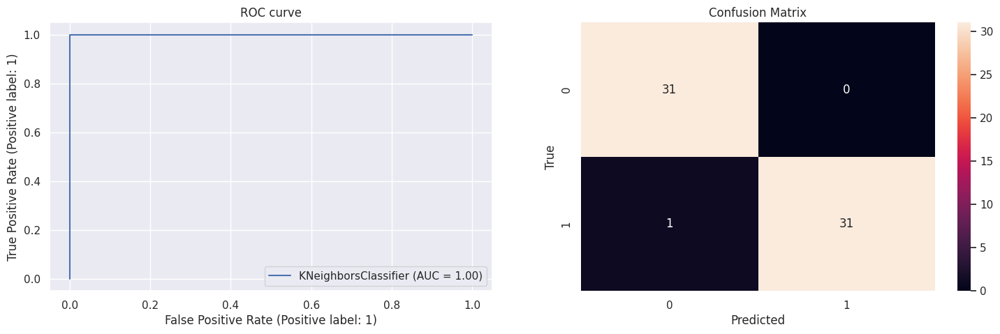

In [ ]:
knn_genes_best, knn_genes = cross_val_genes(knn, knn_param, X_train, y_train, random=True )
knn_genes_eval = evaluation_genes(knn_genes_best,knn_genes, X_train, y_train, X_test, y_test)

In [ ]:
knn_genes_avg = average_performance(knn_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9936507936507937
Average Log loss: 0.026357646433214595
Average Roc-auc score: 0.9997442267919473
Average f1-score: 0.9935700826417184


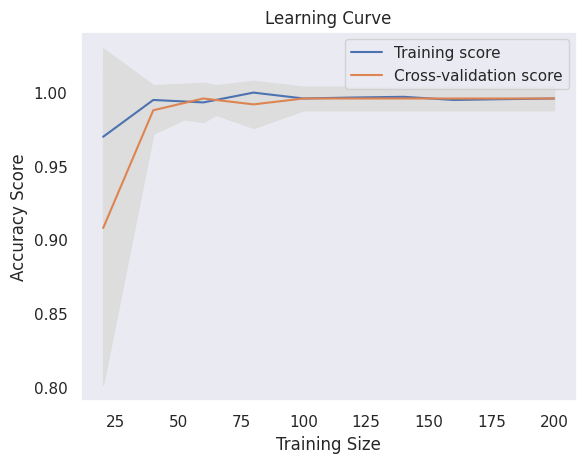

In [ ]:
plot_learning_curve(knn_genes_best)

# SVM

In [ ]:
from sklearn.svm import SVC

## FULL

-0.02284165129623167
{'C': 0.48855705431742025, 'kernel': 'rbf'}
Accuracy score: 0.9841269841269841
Log loss: 0.04550964561841678
Roc-auc score: 1.0
Average f1-score: 0.9841269841269841
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        31
           1       1.00      0.97      0.98        32

    accuracy                           0.98        63
   macro avg       0.98      0.98      0.98        63
weighted avg       0.98      0.98      0.98        63



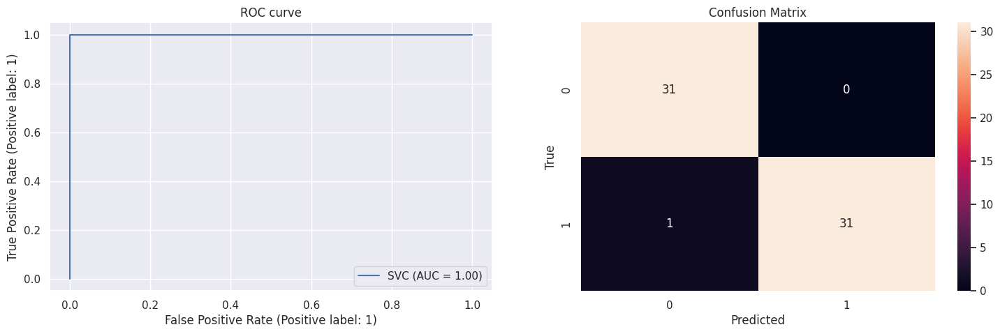

In [ ]:
from scipy.stats import expon

svm = SVC(random_state=0, probability=True)
svm_param = {'kernel':['rbf', 'poly','linear','sigmoid'], 
             'C': expon(scale=1)}

svm_best = cross_val(svm,svm_param,X_train,y_train,random=True)
svm_eval = evaluation(svm_best,X_train,y_train,X_test,y_test)

In [ ]:
svm_avg = average_performance(svm_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9682539682539683
Average Accuracy score: 0.9904761904761905
Average Log loss: 0.030043946213275573
Average Roc-auc score: 0.9994878926572639
Average f1-score: 0.9903518661756218


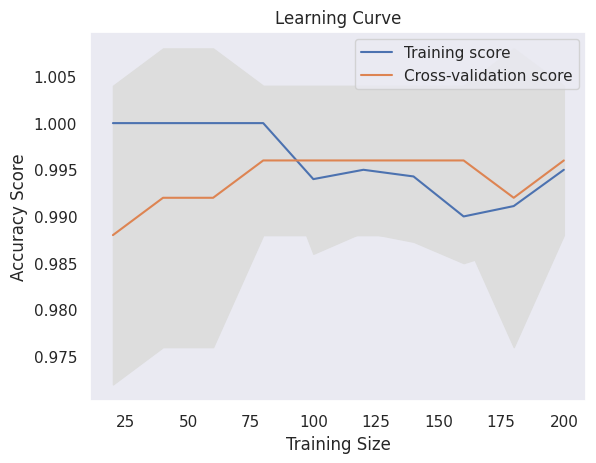

In [ ]:
plot_learning_curve(svm_best)

## PCA

-0.0217652670810256
{'PCA__n_components': 45, 'SVC__C': 1.0588341418654275, 'SVC__kernel': 'sigmoid'}
Accuracy score: 1.0
Log loss: 0.03250886584256375
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



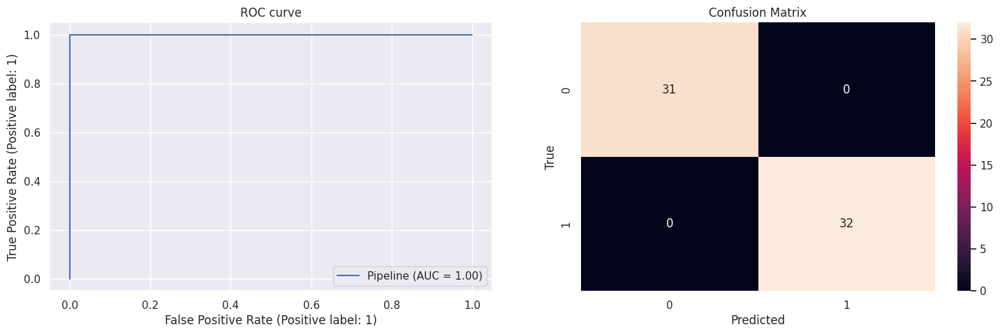

In [ ]:
from scipy.stats import expon

svm_pipe = Pipeline([('SC', StandardScaler(with_mean=False)),('PCA', PCA()), ('SVC', SVC(random_state=0, probability=True))])
svm_pipe_param = {'PCA__n_components':[n for n in range(10,109)],
                   'SVC__kernel':['rbf', 'poly','linear','sigmoid'], 
                   'SVC__C': expon(scale=1)
                   }

svm_pipe_best = cross_val(svm_pipe,svm_pipe_param,X_train,y_train,random=True)
svm_pipe_eval = evaluation(svm_pipe_best,X_train,y_train,X_test,y_test)

In [ ]:
svm_pipe_avg = average_performance(svm_pipe_best, X, y, 10)

Maximum and minimum accuracy: 1.0   1.0
Average Accuracy score: 1.0
Average Log loss: 0.01970630718560263
Average Roc-auc score: 1.0
Average f1-score: 1.0


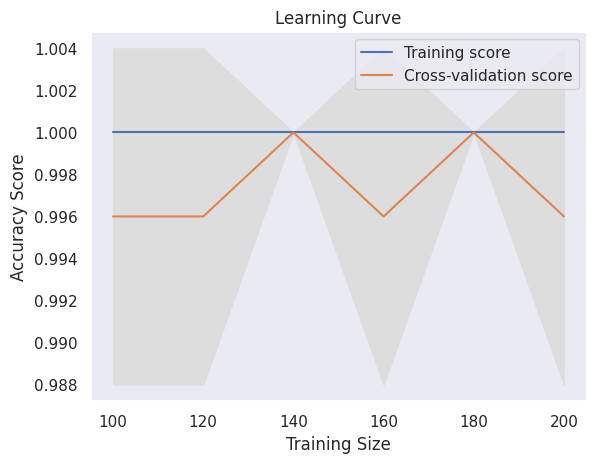

In [ ]:
plot_learning_curve(svm_pipe_best)

## Important genes

Score: -0.03230777169719855
Parameters: {'C': 0.48855705431742025, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Genes selected: ['NDRG1', 'PFKP', 'MTATP6P1', 'PGK1', 'PDK1', 'FAM162A', 'PSME2', 'DHCR7', 'GAPDH', 'ENO2', 'MT-ATP8', 'FDPS', 'TUBD1', 'BNIP3', 'ARPC1B', 'CTPS1', 'P4HA1', 'FADS1', 'HNRNPA2B1', 'PGP', 'IFITM2', 'MT-CYB', 'IRF2BP2', 'VEGFA', 'GPI', 'H2AX', 'DSP', 'PYCR3', 'FUT11', 'LDHA', 'BSCL2', 'CYP1B1-AS1', 'CXXC5', 'GBE1', 'APEH', 'HLA-B', 'IL27RA', 'SNRNP25', 'GFRA1', 'ALDOA', 'ELOVL2', 'NFE2L2', 'KRT80', 'MOV10', 'PFKFB3', 'SOX4', 'SLC2A1', 'PFKFB4', 'MT-CO2', 'KDM3A', 'FBP1', 'SLC9A3R1', 'AP1B1', 'NME1-NME2', 'TANC2', 'TNFRSF21', 'SQLE', 'RHOD', 'HLA-C', 'ZYX', 'ACAT2', 'FLOT2', 'MT-ATP6', 'ACOT7', 'SDF2L1', 'HK2', 'DDIT4', 'NAPRT', 'CRELD2', 'NECTIN2'

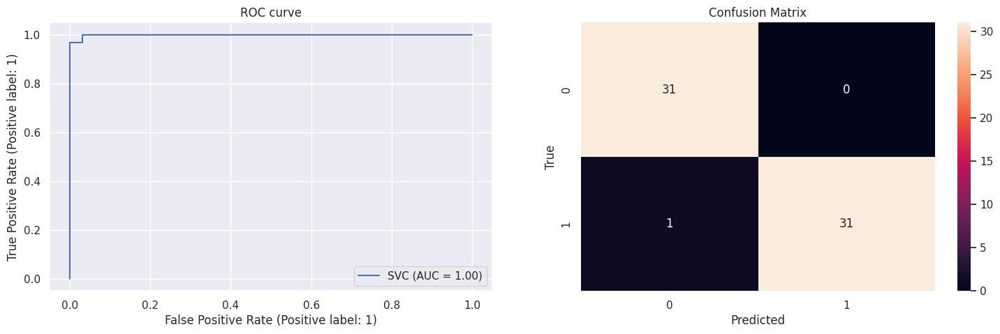

In [ ]:
svm_genes_best, svm_genes = cross_val_genes(svm, svm_param, X_train, y_train, random=True)
svm_genes_eval = evaluation_genes(svm_genes_best,svm_genes, X_train, y_train, X_test, y_test)

In [ ]:
svm_genes_avg = average_performance(svm_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9936507936507937
Average Log loss: 0.029995307630852192
Average Roc-auc score: 1.0
Average f1-score: 0.9934687474291612


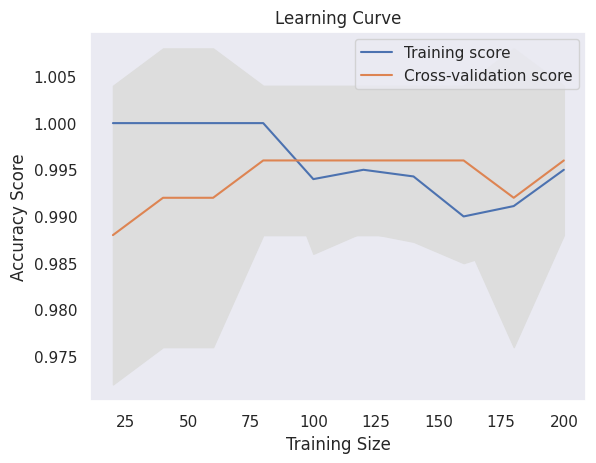

In [ ]:
plot_learning_curve(svm_genes_best)

# XGBoost

Gradient Boosting is a machine learning algorithm that combines multiple weak predictive models (typically decision trees) to create a stronger predictive model. It is an ensemble method where each subsequent model is trained to correct the mistakes made by the previous models in the ensemble.

Gradient Boosting is appreciated for its high predictive accuracy and flexibility to handle different data types. It provides measures of feature importance, allowing us to identify the most influential features in our dataset.

Despite its advantages, Gradient Boosing brings also some cons. It is indeed prone to overfitting if the number of estimators (trees) is set too high or if the data contains noisy or irrelevant features. Proper hyperparameter tuning and regularization techniques can help mitigate this issue. In addition, it is computationally intensive and time consuming (for this reason, there are optimized implementations, such as XGBoost and LightGBM, which provide faster performance.) 



In [ ]:
from xgboost import XGBClassifier

## FULL

Before moving on to running the classifier, we must handle the parameters it should deal with. In particular, to work with the Gradient Boost classifier, we must select values for its hyperparameters. 
We will use random search, since it significantly reduces the computational burden of the operation

In [ ]:
from scipy.stats import randint, uniform

# Define the model
xgb = XGBClassifier()

xgb_param = {
    'n_estimators': [10, 100, 500],  
    'subsample': [0.5, 0.75, 1],
    'learning_rate': [0.001, 0.01, 0.1],
    'min_child_weight': [0.1, 0.25, 0.5],
    'max_depth' : [None, 1000, 2500, 5000],
    'colsample_bytree': [0.25, 0.5, 0.75],
    'colsample_bylevel': [0.1, 0.185, 0.25],
    'colsample_bynode': [0.25, 0.5, 0.75]
    }

-0.013273284535817465
{'subsample': 0.5, 'n_estimators': 500, 'min_child_weight': 0.1, 'max_depth': 5000, 'learning_rate': 0.1, 'colsample_bytree': 0.25, 'colsample_bynode': 0.25, 'colsample_bylevel': 0.185}
Accuracy score: 1.0
Log loss: 0.005514228651355509
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



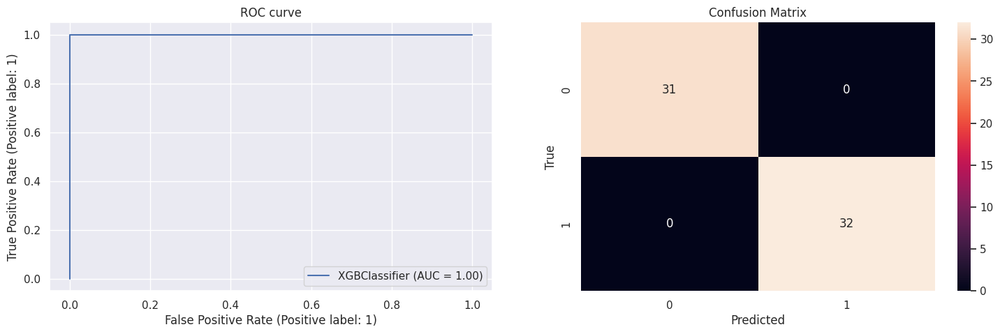

In [ ]:
xgb_best = cross_val(xgb, xgb_param, X_train, y_train, random=True)
xgb_eval = evaluation(xgb_best, X_train, y_train, X_test, y_test)

In [ ]:
xgb_avg = average_performance(xgb_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9920634920634921
Average Log loss: 0.019576392649665535
Average Roc-auc score: 1.0
Average f1-score: 0.9919999108316052


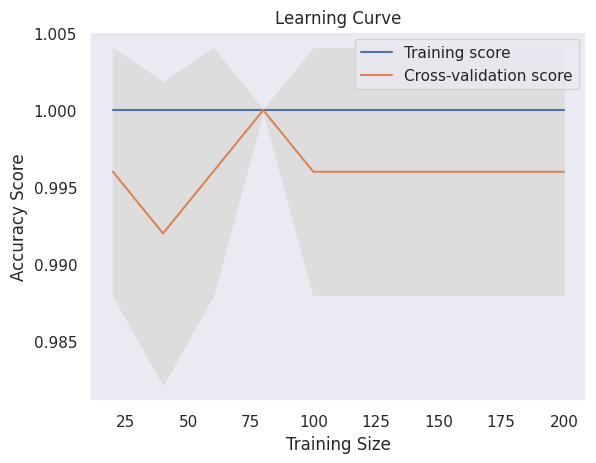

In [ ]:
plot_learning_curve(xgb_best)

## PCA

We now apply XGBoost on our dataset, but first apply scaling and PCA by pipelining.

In [ ]:
xgb_pipe = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),
    ('pca', PCA()),
    ('xgb', XGBClassifier())])

In [ ]:
xgb_pipe_param = {
    'pca__n_components': [10, 11, 12, 13, 14, 15],
    'xgb__n_estimators': randint(2500,5000),  
    'xgb__subsample': [0.5, 0.125, 0.25],
    'xgb__learning_rate': [ 0.05, 0.1, 0.25],
    'xgb__min_child_weight': [0.005, 0.01, 0.025],
    'xgb__max_depth' : [None, 1000, 1250, 2500],
    'xgb__colsample_bytree': [0.75, 0.8, 0.875, 0.95],
    'xgb__colsample_bylevel': [0.1, 0.185, 0.25, 0.35, 0.5],
    'xgb__colsample_bynode': [0.25, 0.375, 0.5, 0.625, 0.75]
    }

-0.03707889995238038
{'pca__n_components': 14, 'xgb__colsample_bylevel': 0.25, 'xgb__colsample_bynode': 0.75, 'xgb__colsample_bytree': 0.875, 'xgb__learning_rate': 0.25, 'xgb__max_depth': 2500, 'xgb__min_child_weight': 0.005, 'xgb__n_estimators': 3073, 'xgb__subsample': 0.125}
Accuracy score: 1.0
Log loss: 0.0018100234088735075
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        32

    accuracy                           1.00        63
   macro avg       1.00      1.00      1.00        63
weighted avg       1.00      1.00      1.00        63



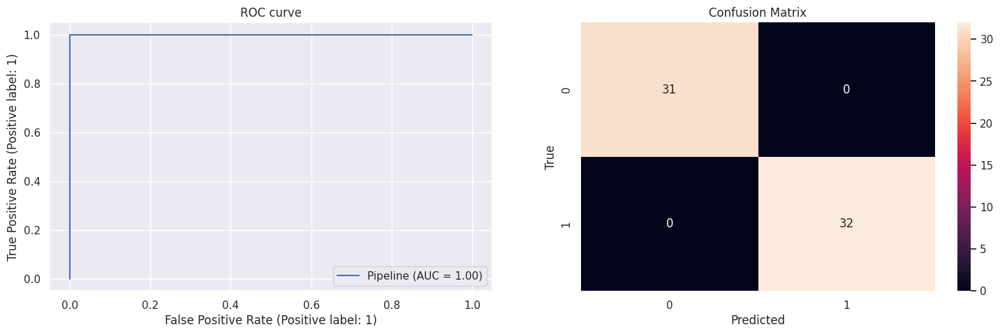

In [ ]:
xgb_pipe_best = cross_val(xgb_pipe, xgb_pipe_param, X_train, y_train, random=True)
pipe_xgb_eval = evaluation(xgb_pipe_best, X_train, y_train, X_test, y_test)

In [ ]:
xgb_pipe_avg = average_performance(xgb_pipe_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9682539682539683
Average Accuracy score: 0.9793650793650794
Average Log loss: 0.05571485092996661
Average Roc-auc score: 0.9989852361557283
Average f1-score: 0.9790775177412128


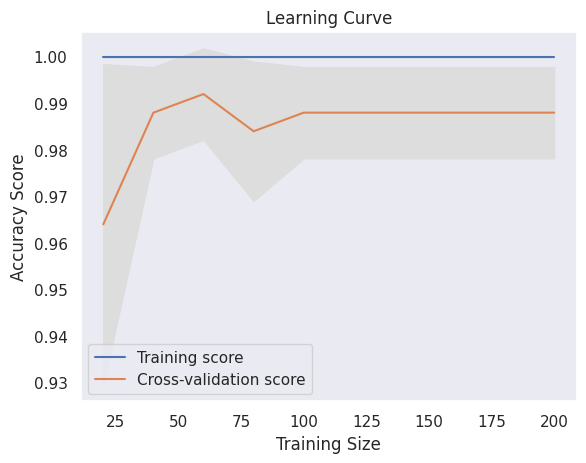

In [ ]:
plot_learning_curve(xgb_pipe_best)

## Important genes

Score: -0.009384044877557842
Parameters: {'objective': 'binary:logistic', 'use_label_encoder': None, 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': 0.185, 'colsample_bynode': 0.25, 'colsample_bytree': 0.25, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'gpu_id': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 5000, 'max_leaves': None, 'min_child_weight': 0.1, 'missing': nan, 'monotone_constraints': None, 'n_estimators': 500, 'n_jobs': None, 'num_parallel_tree': None, 'predictor': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.5, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Genes selected: ['NDRG1', 'PFKP', 'MTATP

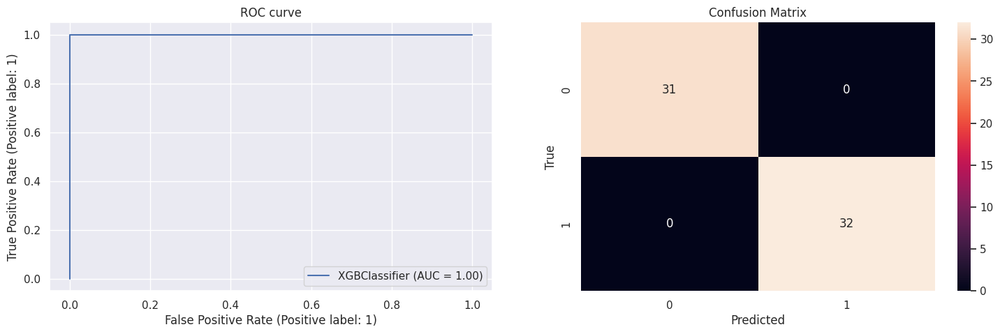

In [ ]:
xgb_genes_best, xgb_genes = cross_val_genes(xgb, xgb_param, X_train, y_train, random=True)
xgb_genes_eval = evaluation_genes(xgb_genes_best,xgb_genes, X_train, y_train, X_test, y_test)

In [ ]:
xgb_genes_avg = average_performance(xgb_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9841269841269841
Average Accuracy score: 0.9984126984126984
Average Log loss: 0.010353179837693462
Average Roc-auc score: 1.0
Average f1-score: 0.998303258820361


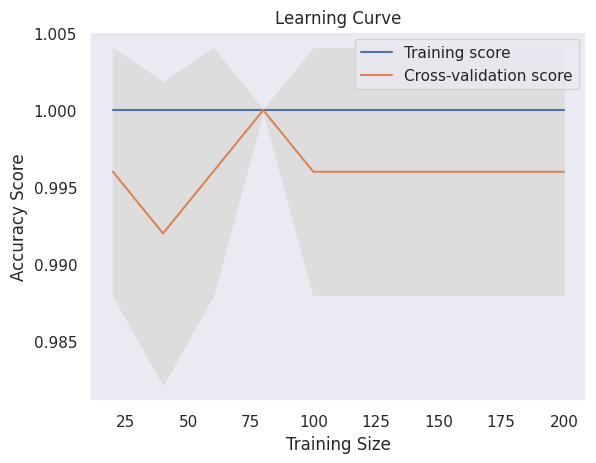

In [ ]:
plot_learning_curve(xgb_genes_best)

# Comparison of all the models

In [ ]:
final_scores = {
    'RF' : rf_avg,
    'RF + PCA' : rf_pipe_avg,
    'RF + genes' : rf_genes_avg,
    'LR' : lr_avg,
    'LR + PCA' : lr_pipe_avg,
    'LR + genes' : lr_genes_avg,
    'KNN' : knn_avg,
    'KNN + PCA' : knn_pipe_avg,
    'KNN + genes' : knn_genes_avg,
    'SVM' : svm_avg,
    'SVM + PCA' : svm_pipe_avg,
    'SVM + genes' : svm_genes_avg,
    'XGB' : xgb_avg,
    'XGB + PCA' : xgb_pipe_avg,
    'XGB + genes' : xgb_genes_avg
}

df_comparison_final = pd.DataFrame(final_scores, index=['Min accuracy', 'Max accuracy', 'Avg Accuracy','Avg Log loss','Avg Roc-auc score','Avg f1-score'])
df_comparison_final

,RF,RF + PCA,RF + genes,LR,LR + PCA,LR + genes,KNN,KNN + PCA,KNN + genes,SVM,SVM + PCA,SVM + genes,XGB,XGB + PCA,XGB + genes
Min accuracy,0.984127,0.952381,0.984127,0.984127,0.984127,0.968254,0.984127,0.968254,0.984127,0.968254,1.000000,0.984127,0.984127,0.968254,0.984127
Max accuracy,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Avg Accuracy,0.996825,0.984127,0.993651,0.999683,0.998413,0.987302,0.990476,0.990476,0.993651,0.990476,1.000000,0.993651,0.992063,0.979365,0.998413
Avg Log loss,0.079223,0.084597,0.086746,0.001586,0.002973,0.045125,0.331123,0.016867,0.026358,0.030044,0.019706,0.029995,0.019576,0.055715,0.010353
Avg Roc-auc score,1.000000,0.999491,1.000000,1.000000,1.000000,0.999187,0.990395,0.999697,0.999744,0.999488,1.000000,1.000000,1.000000,0.998985,1.000000
Avg f1-score,0.996641,0.984025,0.993614,0.999681,0.998411,0.987226,0.990306,0.990409,0.993570,0.990352,1.000000,0.993469,0.992000,0.979078,0.998303


# Ensemble

In [ ]:
final_model = svm_pipe_best

# Final predictions

In [ ]:
X_test_final = df_mcf_smart_test.T

In [ ]:
final_model.fit(X, y)
y_pred_final_mcf_smart = final_model.predict(X_test_final)
y_pred_final_mcf_smart

array([1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0])

In [ ]:
np.savetxt('mcf_smart_predictions', y_pred_final_mcf_smart, fmt='%1d')

# Results

We print the crosstabulation of our performance, together with the corresponding accuracy in the predictions.

In [4]:
import pandas as pd

# Define the data
data = {'0': [32, 0], '1': [0, 31]}

# Define the row names (index)
index = ['0', '1']

# Create the DataFrame
df = pd.DataFrame(data, index=index)

print(df)

accuracy = (df.iloc[0, 0] + df.iloc[1, 1])/(df.values.sum())
print(f"Accuracy: {accuracy * 100:.2f}%")

    0   1
0  32   0
1   0  31
Accuracy: 100.00%


We gladly achieve an accuracy of 100% 

In [1]:
%%shell
jupyter nbconvert --to html /content/MCF7_smart_report.ipynb

[NbConvertApp] Converting notebook /content/MCF7_smart_report.ipynb to html
[NbConvertApp] Writing 14409669 bytes to /content/MCF7_smart_report.html
